# Estimation

In [1]:
%load_ext autoreload
%autoreload 2

In [ ]:
#pip install sodapy

In [ ]:
#pip install census

In [2]:
import download
import mlpipeline
import helper

# Distribution
## Change Dict
- TOTAL = ['LR', 'RF', 'DT', 'GB', 'B']

- CHI: ['RF']

- AV: ['GB']

- CA: ['LR', 'DT', 'B']


## Change to_csv

In [3]:
params = {
    'to_exclude': ['year', 'label'],
    'grid_size': 'small',
    'top_x_percent': 0.1,
    'date_col': 'filing_year',
    'prediction_window': 12,
    'start_time': '2010-01-01',
    'end_time': '2016-01-01',
    'len_train': 36,
    'discrete_bins': 3,
    'cats': ['low', 'medium', 'high'],
    'models_to_run': ['GB'],
    'outcome': 'label',
    'thresholds': [1, 2, 5, 10, 20, 30, 50], 
    'bias_list': ['race', 'poor']}

In [4]:
eviction = download.load_evict('../inputs/eviction_data_tract.csv')
crime = download.load_crime('../inputs/crime_by_tract.csv')
buildings = download.load_building('../inputs/building_violation_by_tract.csv')
acs = download.load_acs('../inputs/acs_year_tract.csv')
education = download.load_education('../inputs/educ_year_tract.csv')
tracts = download.load_tract('../inputs/ch_opdat/tracts.csv')

In [5]:
eviction_df = download.join_bases(eviction, acs, education, crime, buildings, tracts)

In [ ]:
#helper.explore_data(eviction_df)

In [6]:
eviction_df = mlpipeline.create_label(eviction_df, 'year', 'eviction_filings_rate', 1 - params['top_x_percent'],
                                      params['prediction_window'])
eviction_df = eviction_df.drop(['eviction_filings_rate_next_year', 'next_year'], axis = 1)

In [7]:
eviction_df.filing_year.describe()

count                    6375
unique                      8
top       2017-01-01 00:00:00
freq                      799
first     2010-01-01 00:00:00
last      2017-01-01 00:00:00
Name: filing_year, dtype: object

In [8]:
rv = mlpipeline.temporal_validation(eviction_df, params['date_col'], params['prediction_window'],
                                    params['start_time'], params['end_time'], params['len_train'],
                                    params['bias_list'])

In [9]:
cols_to_discretize = mlpipeline.get_continuous_variables(eviction_df)
list(cols_to_discretize)
cols_to_binary = []
for col in cols_to_discretize:
     cols_to_binary.append(col + "_group")
processed_rv = mlpipeline.process_train_data(rv, cols_to_discretize, params['discrete_bins'],
                                              params['cats'], cols_to_binary)

perc_increase_total_crime_class_Violent Crime                             797
perc_increase_total_crime_class_Less serious offences_mean_by_commarea    796
perc_increase_bv_mean_by_commarea                                         796
perc_increase_bv                                                          796
perc_increase_total_crime_class_Property Crime                            796
perc_increase_total_crime_class_Less serious offences                     796
perc_increase_total_crime                                                 796
perc_increase_total_crime_class_Violent Crime_mean_by_commarea            796
perc_increase_total_crime_class_Property Crime_mean_by_commarea           796
perc_increase_total_crime_mean_by_commarea                                796
population_race_asian                                                      10
population_race_latinx                                                     10
population_race_other                                           

/anaconda3/lib/python3.7/site-packages/pandas/core/generic.py:6130: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(new_data)


Can't fill missing values for non-numeric column race
population_race_other                                             3
population_poverty_below                                          3
population_race_asian                                             3
population_race_latinx                                            3
population_race_black                                             3
population_race_white                                             3
population_poverty_above                                          3
housing_units_rental                                              3
housing_units_other                                               3
race                                                              3
label_prev_year                                                   0
total_primary_type_OTHER OFFENSE                                  0
total_primary_type_PUBLIC INDECENCY                               0
total_primary_type_PUBLIC PEACE VIOLATION                     

Can't fill missing values for non-numeric column race
population_race_other                                             3
population_poverty_below                                          3
population_race_asian                                             3
population_race_latinx                                            3
population_race_black                                             3
population_race_white                                             3
population_poverty_above                                          3
housing_units_rental                                              3
housing_units_other                                               3
race                                                              3
label_prev_year                                                   0
total_primary_type_OTHER OFFENSE                                  0
total_primary_type_PUBLIC INDECENCY                               0
total_primary_type_PUBLIC PEACE VIOLATION                     

Can't fill missing values for non-numeric column race
race                                                              3
population_poverty_below                                          3
population_race_asian                                             3
population_race_latinx                                            3
population_race_black                                             3
population_race_white                                             3
population_poverty_above                                          3
population_race_other                                             3
housing_units_other                                               3
housing_units_rental                                              3
perc_increase_total_crime_class_Property Crime                    1
perc_increase_total_crime_class_Violent Crime                     1
total_primary_type_PROSTITUTION                                   0
total_primary_type_THEFT                                      

Can't fill missing values for non-numeric column race
race                                                              2
housing_units_other                                               2
population_race_asian                                             2
population_race_latinx                                            2
population_race_black                                             2
population_race_white                                             2
population_poverty_above                                          2
population_poverty_below                                          2
population_race_other                                             2
housing_units_rental                                              2
perc_increase_total_crime_class_Violent Crime                     1
total_primary_type_WEAPONS VIOLATION                              0
total_primary_type_OTHER OFFENSE                                  0
total_primary_type_PUBLIC INDECENCY                           

In [10]:
key1 = list(processed_rv.keys())[0]
train = processed_rv[key1][0]
selected_features = list(train.loc[:,train.apply(lambda x: x.isin([0, 1]).all())].columns)
selected_features.remove('label')

In [11]:
import warnings
warnings.simplefilter(action='ignore')

GB


<Figure size 432x288 with 0 Axes>

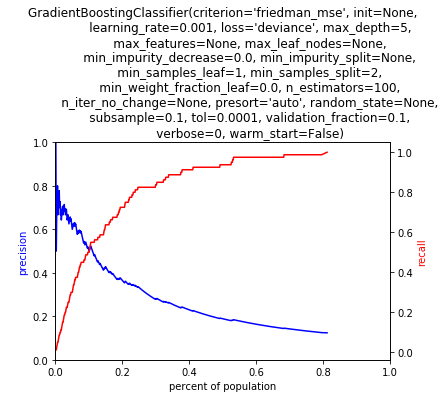

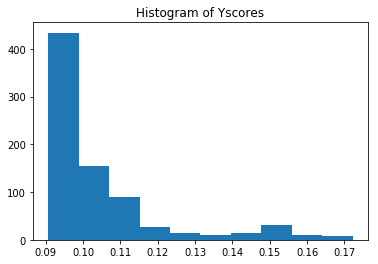

FEATURE IMPORTANCES

1. Feature label_prev_year (0.286882)
2. Feature eviction_filings_rate_group_low (0.035348)
3. Feature total_domestic_1_group_high (0.008674)
4. Feature total_primary_type_GAMBLING_mean_by_commarea_group_high (0.008443)
5. Feature population_race_black_group_low (0.007789)
6. Feature total_crime_class_Violent Crime_mean_by_commarea_group_medium (0.007629)
7. Feature perc_increase_total_crime_group_medium (0.007473)
8. Feature total_primary_type_PROSTITUTION_group_low (0.006876)
9. Feature total_inspection_category_REGISTRATION_mean_by_commarea_group_high (0.006441)
10. Feature total_primary_type_BATTERY_mean_by_commarea_group_medium (0.006317)
            score  label_value
race                          
Asian           0          0.0
Black          73         76.0
Integrated      0          0.0
Latin           4          2.0
White           2          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

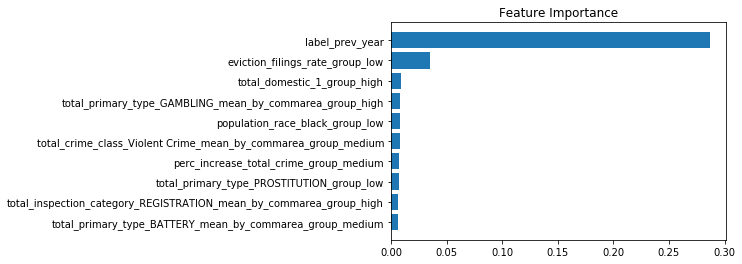

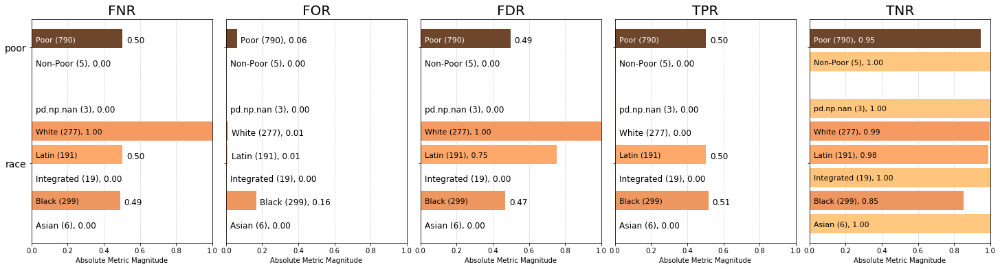

<Figure size 432x288 with 0 Axes>

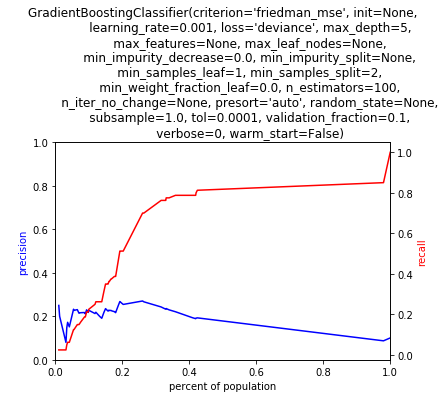

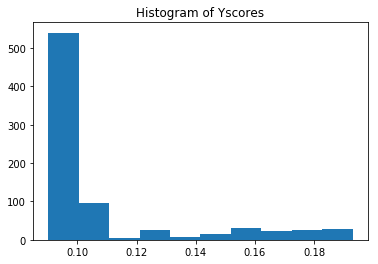

FEATURE IMPORTANCES

1. Feature label_prev_year (0.597366)
2. Feature population_race_black_mean_by_commarea_group_high (0.080036)
3. Feature eviction_filings_rate_group_low (0.029770)
4. Feature eviction_filings_total_group_low (0.028871)
5. Feature total_domestic_1_group_high (0.024924)
6. Feature total_crime_class_Less serious offences_group_medium (0.014096)
7. Feature default_eviction_order_no_tenant_prose_group_low (0.013287)
8. Feature total_primary_type_GAMBLING_mean_by_commarea_group_medium (0.012419)
9. Feature total_department_bureau_CONSERVATION_group_medium (0.010045)
10. Feature total_violation_status_COMPLIED_perc_group_low (0.009458)
            score  label_value
race                          
Asian           0          0.0
Black          77         76.0
Integrated      0          0.0
Latin           1          2.0
White           1          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

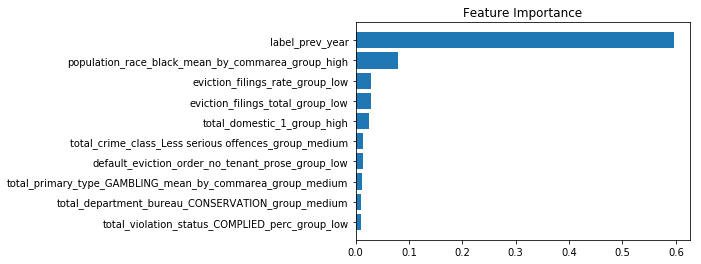

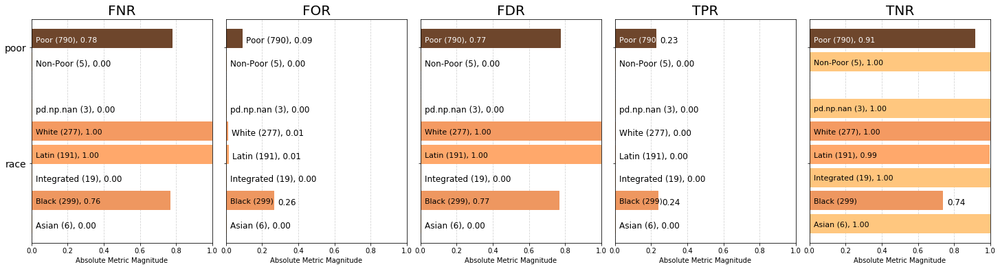

<Figure size 432x288 with 0 Axes>

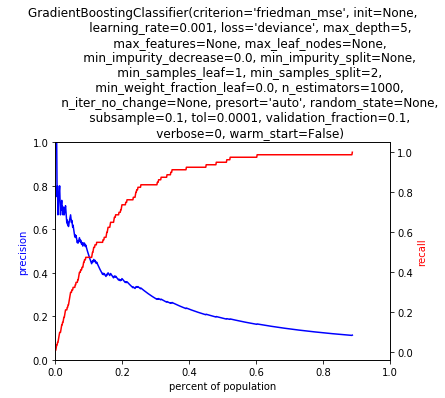

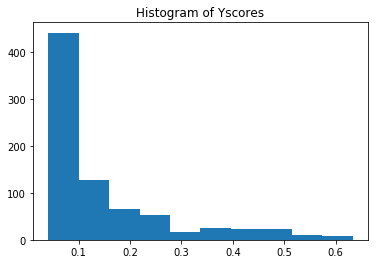

FEATURE IMPORTANCES

1. Feature label_prev_year (0.191475)
2. Feature eviction_filings_rate_group_low (0.024429)
3. Feature some_college_group_high (0.010302)
4. Feature eviction_filings_rate_group_medium (0.008391)
5. Feature total_domestic_1_group_high (0.007414)
6. Feature perc_total_crime_class_Property Crime_group_low (0.007265)
7. Feature some_college_group_medium (0.007023)
8. Feature population_race_black_mean_by_commarea_group_high (0.006480)
9. Feature population_race_black_group_high (0.006451)
10. Feature total_inspection_category_REGISTRATION_mean_by_commarea_group_high (0.005978)
            score  label_value
race                          
Asian           0          0.0
Black          74         76.0
Integrated      0          0.0
Latin           3          2.0
White           2          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

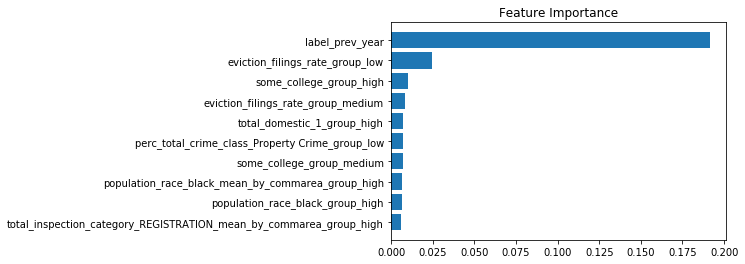

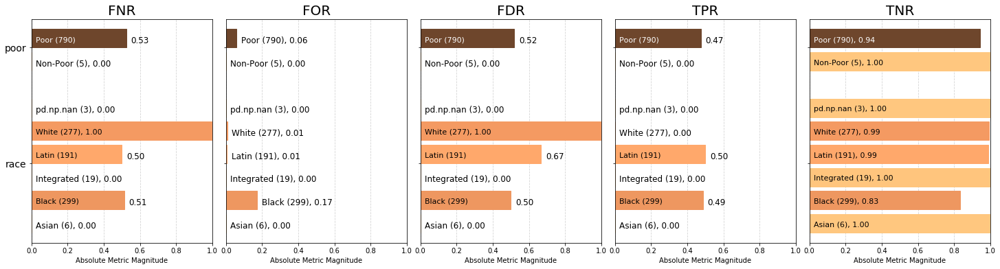

<Figure size 432x288 with 0 Axes>

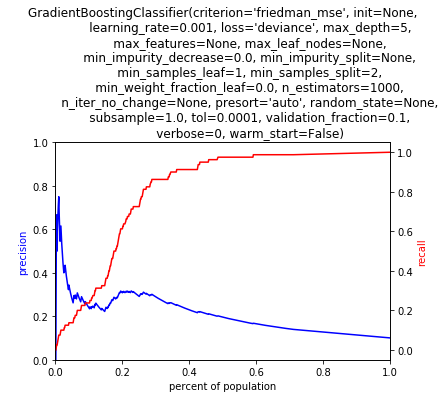

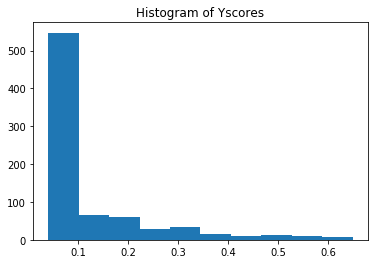

FEATURE IMPORTANCES

1. Feature label_prev_year (0.515591)
2. Feature population_race_black_mean_by_commarea_group_high (0.036457)
3. Feature eviction_filings_rate_group_low (0.028700)
4. Feature eviction_filings_total_group_low (0.019371)
5. Feature total_primary_type_BATTERY_group_low (0.016553)
6. Feature total_domestic_1_group_high (0.015898)
7. Feature total_primary_type_ROBBERY_mean_by_commarea_group_medium (0.014875)
8. Feature total_arrest_0_mean_by_commarea_group_medium (0.014648)
9. Feature total_primary_type_CRIMINAL DAMAGE_mean_by_commarea_group_medium (0.013959)
10. Feature eviction_order_yes_tenant_represented_mean_by_commarea_group_medium (0.013643)
            score  label_value
race                          
Asian           0          0.0
Black          75         76.0
Integrated      0          0.0
Latin           3          2.0
White           1          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

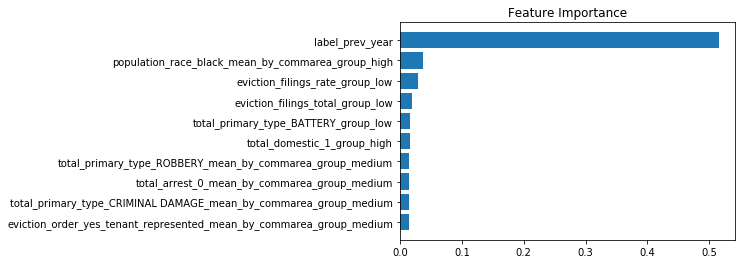

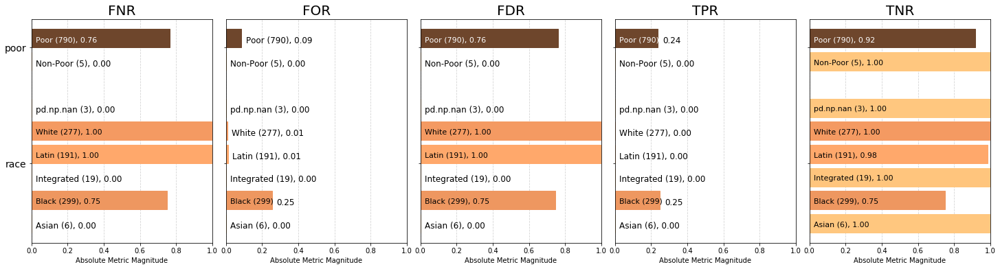

<Figure size 432x288 with 0 Axes>

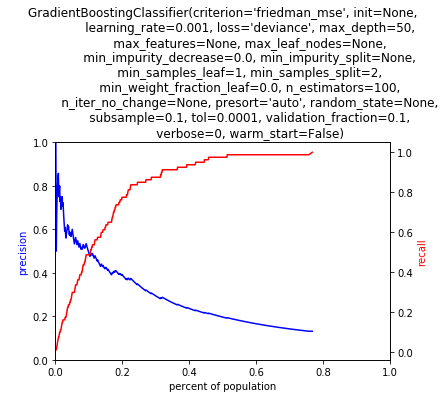

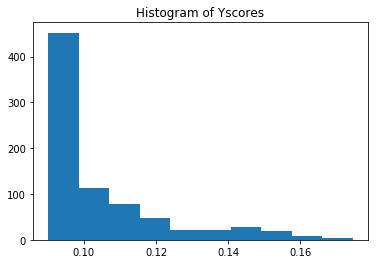

FEATURE IMPORTANCES

1. Feature label_prev_year (0.215159)
2. Feature not_highschool_grad_mean_by_commarea_group_high (0.011274)
3. Feature eviction_filings_rate_group_low (0.009877)
4. Feature some_college_group_medium (0.009334)
5. Feature some_college_group_high (0.009223)
6. Feature high_school_grad_group_high (0.008684)
7. Feature eviction_filings_rate_group_medium (0.006382)
8. Feature population_race_black_mean_by_commarea_group_high (0.006221)
9. Feature total_department_bureau_SPECIAL TASK FORCE_mean_by_commarea_group_medium (0.006085)
10. Feature total_inspection_category_COMPLAINT_perc_group_high (0.005681)
            score  label_value
race                          
Asian           0          0.0
Black          72         76.0
Integrated      0          0.0
Latin           6          2.0
White           1          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

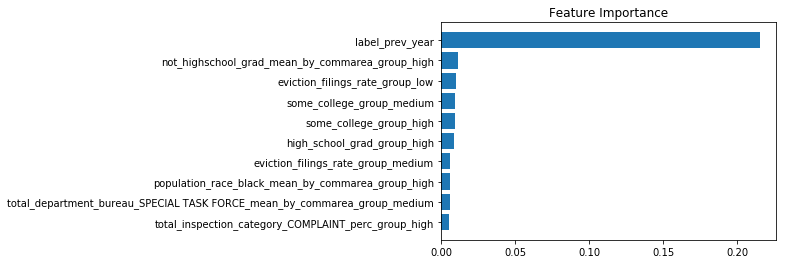

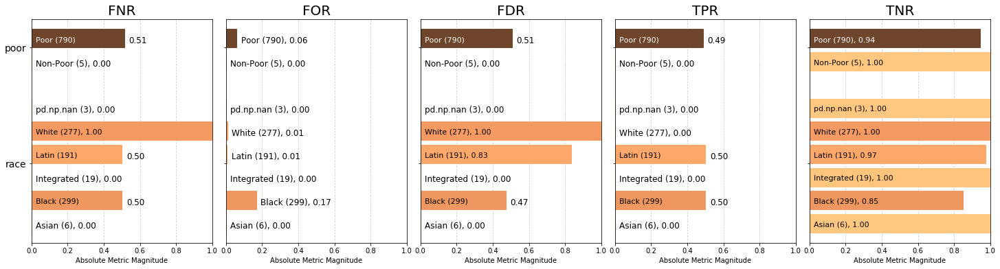

<Figure size 432x288 with 0 Axes>

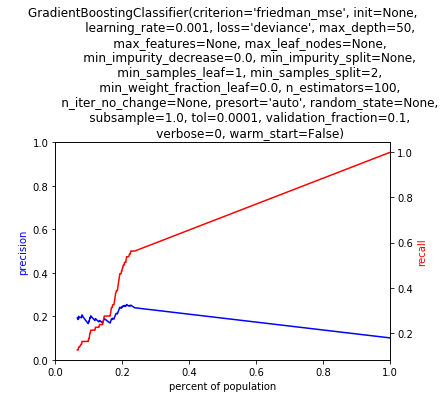

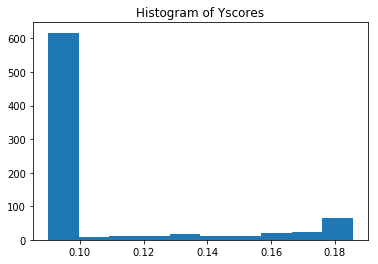

FEATURE IMPORTANCES

1. Feature label_prev_year (0.260541)
2. Feature population_race_black_mean_by_commarea_group_high (0.034987)
3. Feature default_eviction_order_no_tenant_prose_group_low (0.018278)
4. Feature graduate_group_medium (0.013188)
5. Feature eviction_filings_rate_group_low (0.012777)
6. Feature total_domestic_1_group_high (0.010920)
7. Feature total_primary_type_BATTERY_group_low (0.010789)
8. Feature total_primary_type_CRIMINAL DAMAGE_mean_by_commarea_group_medium (0.010686)
9. Feature some_college_group_medium (0.010038)
10. Feature perc_total_crime_class_Violent Crime_group_low (0.009557)
            score  label_value
race                          
Asian           0          0.0
Black          74         76.0
Integrated      0          0.0
Latin           3          2.0
White           2          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

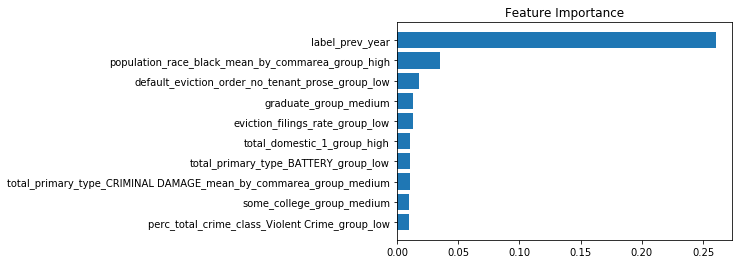

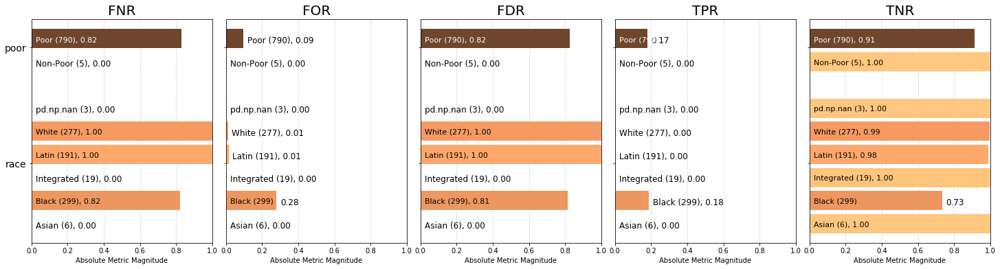

<Figure size 432x288 with 0 Axes>

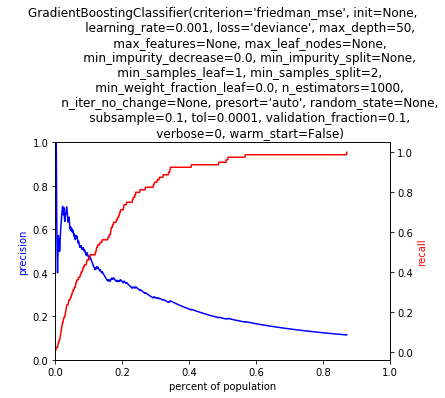

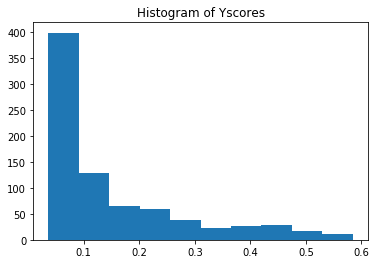

FEATURE IMPORTANCES

1. Feature label_prev_year (0.146877)
2. Feature eviction_filings_rate_group_low (0.016952)
3. Feature some_college_group_high (0.010618)
4. Feature some_college_group_medium (0.008144)
5. Feature perc_total_crime_class_Property Crime_group_low (0.006979)
6. Feature high_school_grad_group_high (0.006770)
7. Feature population_race_black_group_high (0.006603)
8. Feature eviction_filings_rate_group_medium (0.006381)
9. Feature total_domestic_1_group_high (0.006310)
10. Feature perc_increase_total_crime_class_Less serious offences_group_medium (0.005811)
            score  label_value
race                          
Asian           0          0.0
Black          74         76.0
Integrated      0          0.0
Latin           3          2.0
White           2          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

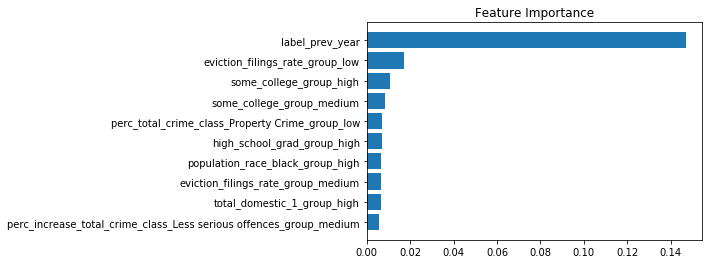

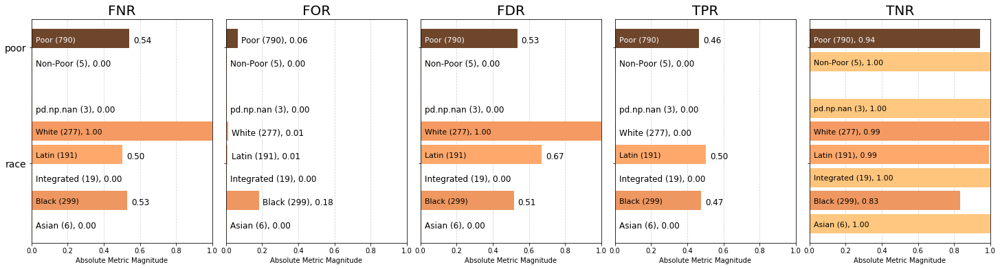

<Figure size 432x288 with 0 Axes>

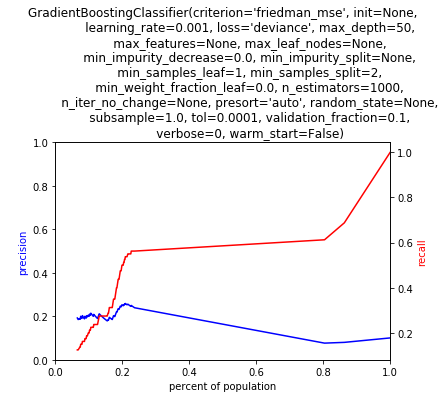

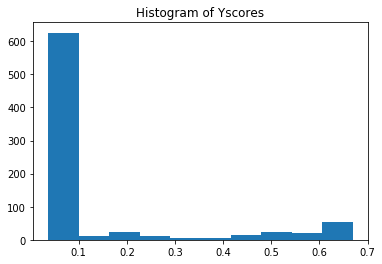

FEATURE IMPORTANCES

1. Feature label_prev_year (0.260541)
2. Feature population_race_black_mean_by_commarea_group_high (0.035103)
3. Feature default_eviction_order_no_tenant_prose_group_low (0.018306)
4. Feature graduate_group_medium (0.013083)
5. Feature eviction_filings_rate_group_low (0.012799)
6. Feature total_domestic_1_group_high (0.010904)
7. Feature some_college_group_medium (0.010800)
8. Feature total_primary_type_CRIMINAL DAMAGE_mean_by_commarea_group_medium (0.010725)
9. Feature total_primary_type_BATTERY_group_low (0.010681)
10. Feature perc_total_crime_class_Violent Crime_group_low (0.009727)
            score  label_value
race                          
Asian           0          0.0
Black          73         76.0
Integrated      1          0.0
Latin           3          2.0
White           2          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

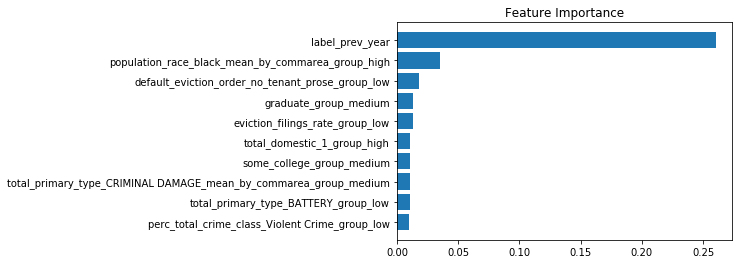

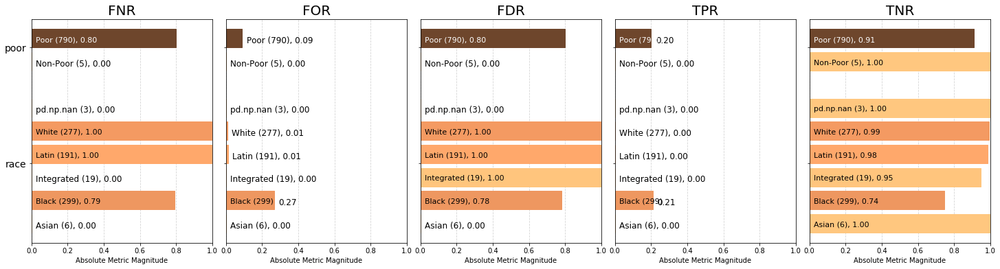

<Figure size 432x288 with 0 Axes>

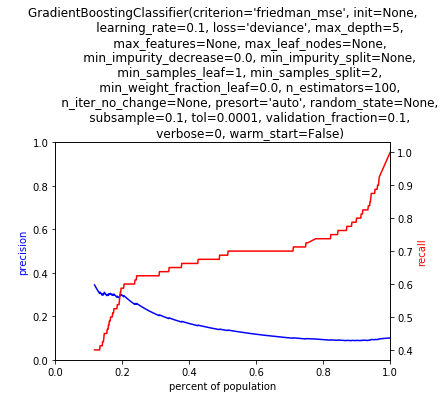

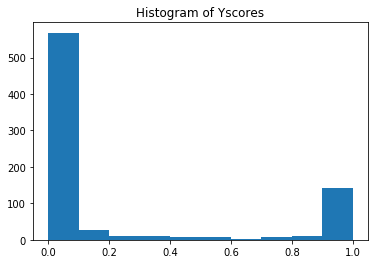

FEATURE IMPORTANCES

1. Feature label_prev_year (0.046541)
2. Feature total_department_bureau_CONSERVATION_mean_by_commarea_group_high (0.044851)
3. Feature total_department_bureau_REFRIGERATION_group_high (0.021923)
4. Feature not_highschool_grad_mean_by_commarea_group_high (0.019786)
5. Feature total_primary_type_MOTOR VEHICLE THEFT_group_high (0.019214)
6. Feature perc_total_crime_class_Violent Crime_group_high (0.016280)
7. Feature total_violation_status_COMPLIED_perc_group_low (0.013629)
8. Feature total_primary_type_PROSTITUTION_mean_by_commarea_group_high (0.013604)
9. Feature total_primary_type_NARCOTICS_mean_by_commarea_group_medium (0.013037)
10. Feature total_department_bureau_SPECIAL TASK FORCE_group_high (0.009990)
            score  label_value
race                          
Asian           1          0.0
Black          64         76.0
Integrated      1          0.0
Latin           6          2.0
White           6          2.0
model_id, score_thresholds 1 {'rank_abs': [79

<Figure size 432x288 with 0 Axes>

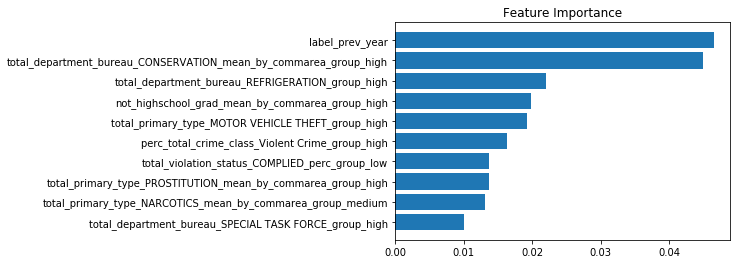

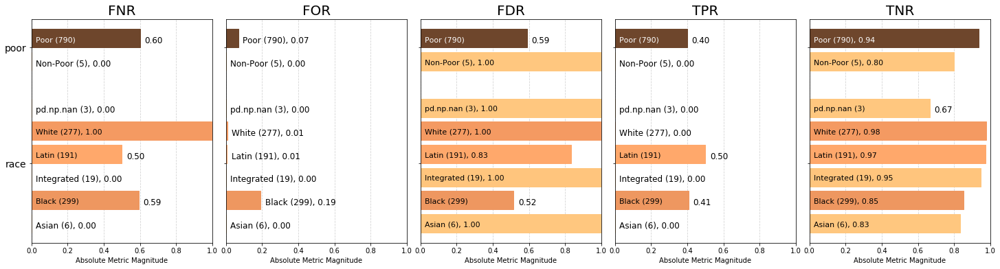

<Figure size 432x288 with 0 Axes>

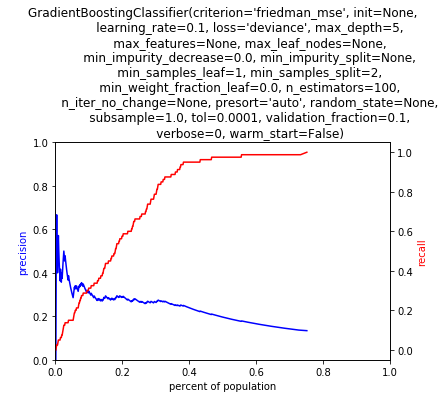

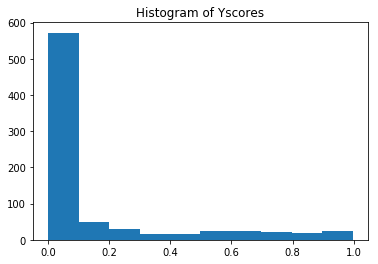

FEATURE IMPORTANCES

1. Feature label_prev_year (0.334769)
2. Feature population_race_black_mean_by_commarea_group_high (0.021761)
3. Feature eviction_filings_rate_group_low (0.018337)
4. Feature total_domestic_1_group_high (0.011690)
5. Feature total_primary_type_ROBBERY_mean_by_commarea_group_medium (0.011572)
6. Feature population_race_black_group_high (0.010196)
7. Feature eviction_filings_rate_mean_by_commarea_group_medium (0.008457)
8. Feature some_college_group_medium (0.008037)
9. Feature total_primary_type_BATTERY_group_low (0.007752)
10. Feature total_primary_type_NARCOTICS_mean_by_commarea_group_medium (0.007584)
            score  label_value
race                          
Asian           0          0.0
Black          76         76.0
Integrated      0          0.0
Latin           2          2.0
White           0          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

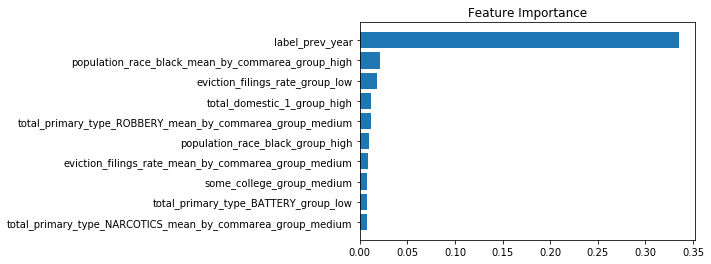

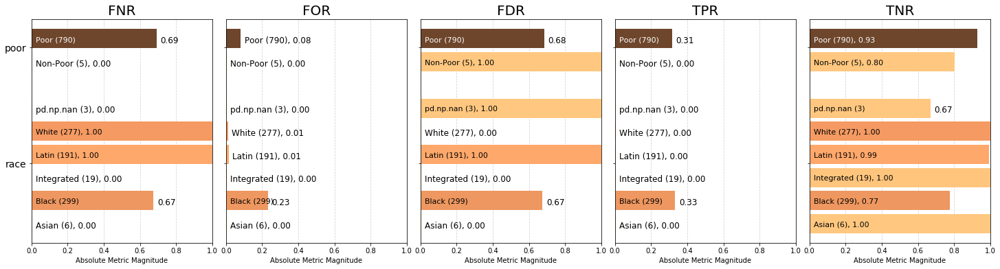

<Figure size 432x288 with 0 Axes>

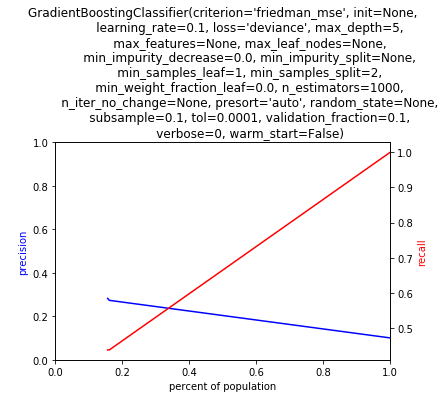

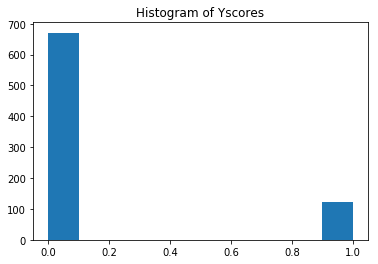

FEATURE IMPORTANCES

1. Feature label_prev_year (0.073070)
2. Feature commarea_group_medium (0.051373)
3. Feature total_primary_type_PUBLIC PEACE VIOLATION_mean_by_commarea_group_medium (0.036083)
4. Feature total_primary_type_BURGLARY_mean_by_commarea_group_medium (0.032282)
5. Feature eviction_order_yes_tenant_rep_laa_mean_by_commarea_group_high (0.019808)
6. Feature eviction_filings_rate_group_low (0.013184)
7. Feature total_primary_type_HOMICIDE_mean_by_commarea_group_medium (0.012498)
8. Feature total_primary_type_OBSCENITY_mean_by_commarea_group_medium (0.010286)
9. Feature total_crime_class_Violent Crime_mean_by_commarea_group_medium (0.009830)
10. Feature total_department_bureau_ELECTRICAL_mean_by_commarea_group_medium (0.009237)
            score  label_value
race                          
Asian           0          0.0
Black          66         76.0
Integrated      0          0.0
Latin           4          2.0
White           9          2.0
model_id, score_thresholds 1 {'rank

<Figure size 432x288 with 0 Axes>

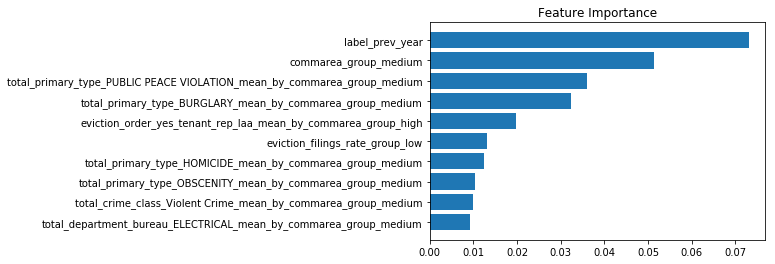

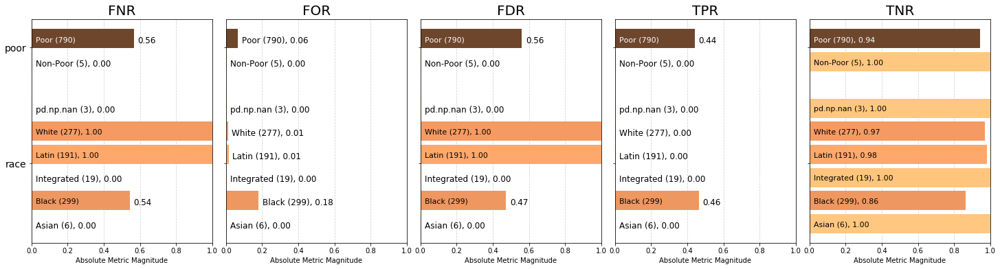

<Figure size 432x288 with 0 Axes>

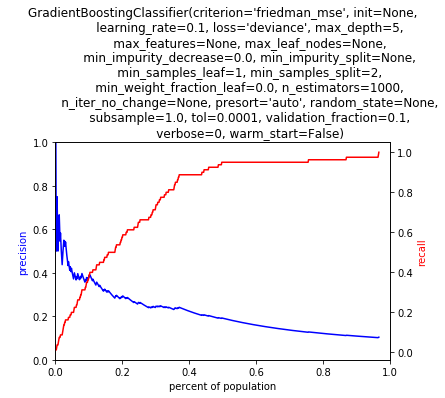

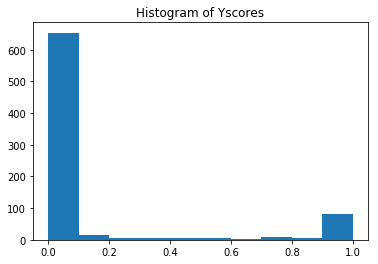

FEATURE IMPORTANCES

1. Feature label_prev_year (0.295470)
2. Feature population_race_black_mean_by_commarea_group_high (0.018923)
3. Feature eviction_filings_rate_group_low (0.017375)
4. Feature total_primary_type_ROBBERY_mean_by_commarea_group_medium (0.011266)
5. Feature population_race_black_group_high (0.009853)
6. Feature total_domestic_1_group_high (0.009648)
7. Feature total_primary_type_BATTERY_group_low (0.009618)
8. Feature total_primary_type_NARCOTICS_mean_by_commarea_group_medium (0.008626)
9. Feature eviction_filings_rate_mean_by_commarea_group_medium (0.007781)
10. Feature total_violation_status_COMPLIED_perc_group_low (0.007033)
            score  label_value
race                          
Asian           0          0.0
Black          73         76.0
Integrated      0          0.0
Latin           3          2.0
White           3          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

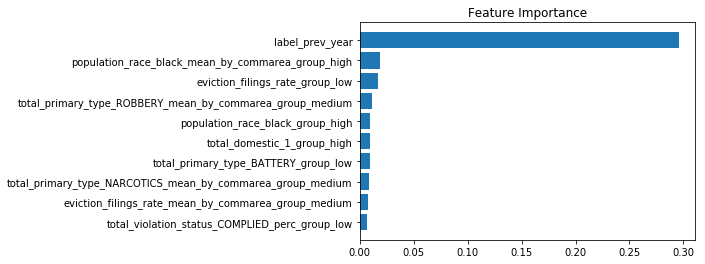

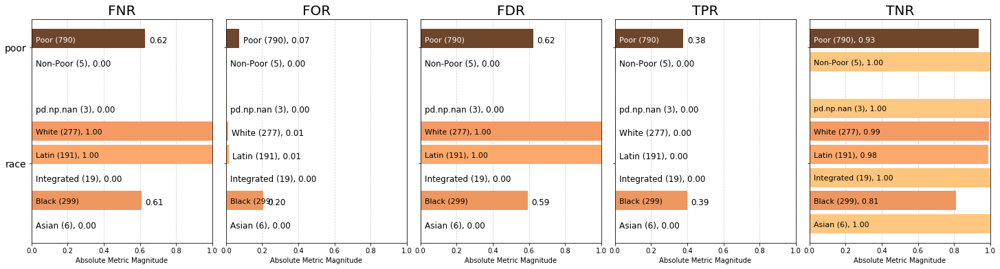

<Figure size 432x288 with 0 Axes>

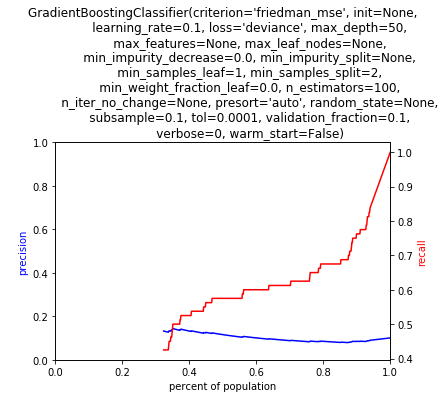

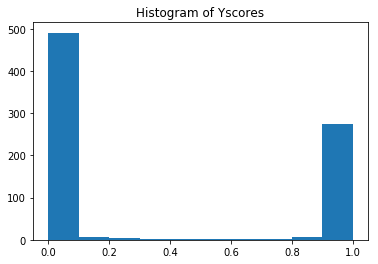

FEATURE IMPORTANCES

1. Feature label_prev_year (0.031304)
2. Feature total_department_bureau_PLUMBING_group_medium (0.018931)
3. Feature total_inspection_category_REGISTRATION_mean_by_commarea_group_high (0.016133)
4. Feature total_primary_type_WEAPONS VIOLATION_group_medium (0.012764)
5. Feature total_primary_type_INTIMIDATION_mean_by_commarea_group_high (0.009616)
6. Feature total_department_bureau_DEMOLITION_mean_by_commarea_group_high (0.009345)
7. Feature some_college_group_high (0.008950)
8. Feature perc_total_crime_class_Property Crime_group_low (0.008880)
9. Feature high_school_grad_group_high (0.008806)
10. Feature total_department_bureau_VENTILATION_mean_by_commarea_group_medium (0.008579)
            score  label_value
race                          
Asian           0          0.0
Black          38         76.0
Integrated      6          0.0
Latin           1          2.0
White          34          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

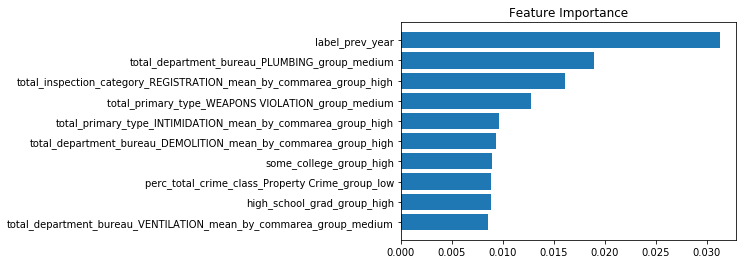

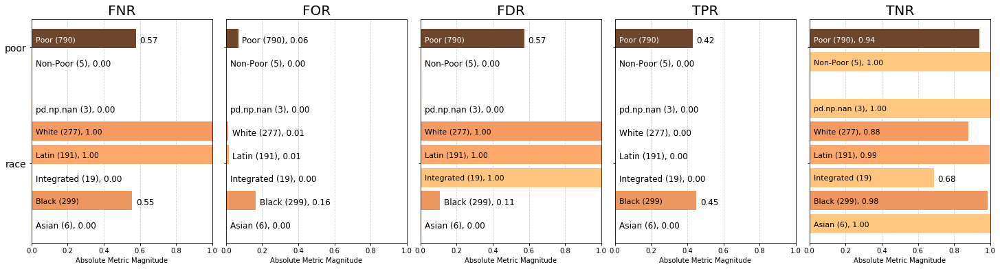

<Figure size 432x288 with 0 Axes>

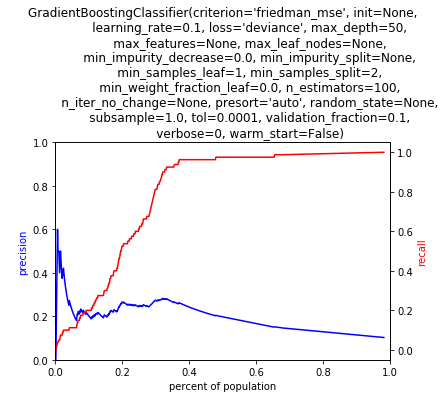

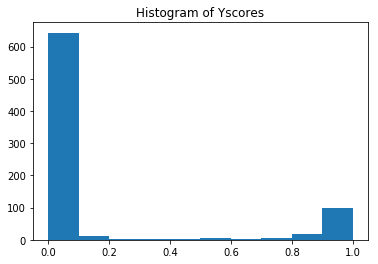

FEATURE IMPORTANCES

1. Feature label_prev_year (0.260541)
2. Feature population_race_black_mean_by_commarea_group_high (0.034989)
3. Feature default_eviction_order_no_tenant_prose_group_low (0.018278)
4. Feature graduate_group_medium (0.015338)
5. Feature eviction_filings_rate_group_low (0.012777)
6. Feature total_primary_type_CRIMINAL DAMAGE_mean_by_commarea_group_medium (0.011614)
7. Feature up_to_middle_group_low (0.010902)
8. Feature total_domestic_1_group_high (0.010872)
9. Feature total_primary_type_BATTERY_group_low (0.010774)
10. Feature some_college_group_high (0.009656)
            score  label_value
race                          
Asian           0          0.0
Black          73         76.0
Integrated      0          0.0
Latin           3          2.0
White           3          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

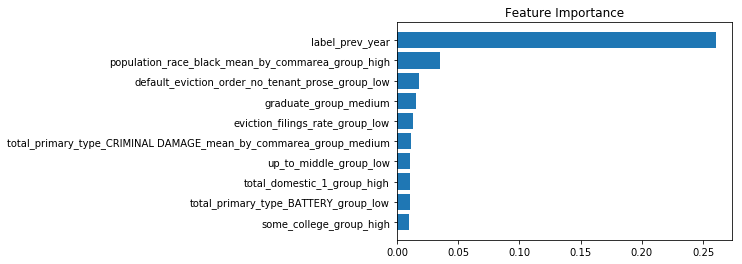

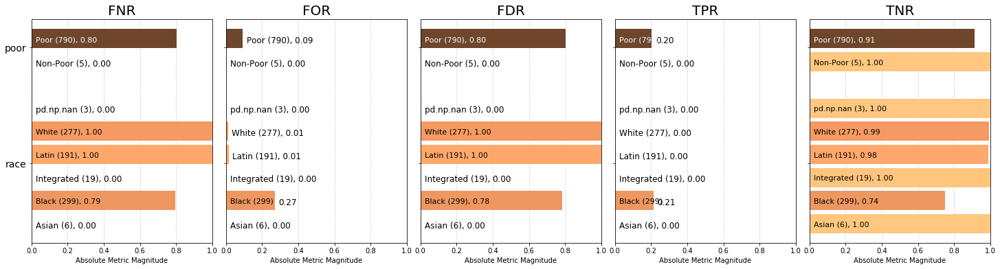

<Figure size 432x288 with 0 Axes>

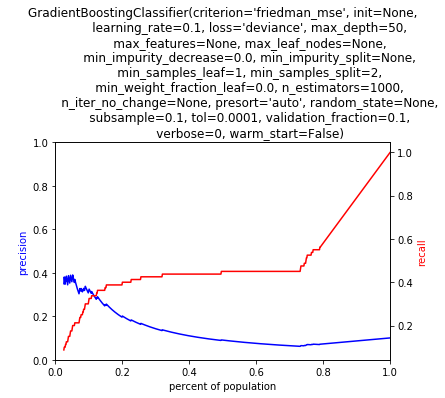

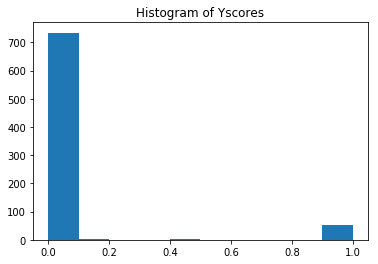

FEATURE IMPORTANCES

1. Feature label_prev_year (0.039886)
2. Feature total_department_bureau_REFRIGERATION_group_high (0.022310)
3. Feature some_college_group_high (0.014931)
4. Feature total_primary_type_WEAPONS VIOLATION_group_high (0.011290)
5. Feature not_highschool_grad_mean_by_commarea_group_high (0.010292)
6. Feature some_college_group_medium (0.007125)
7. Feature default_eviction_order_yes_tenant_prose_mean_by_commarea_group_high (0.006428)
8. Feature associate_group_high (0.006345)
9. Feature associate_mean_by_commarea_group_high (0.005948)
10. Feature total_primary_type_NARCOTICS_mean_by_commarea_group_medium (0.005890)
            score  label_value
race                          
Asian           1          0.0
Black          61         76.0
Integrated      4          0.0
Latin           7          2.0
White           5          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

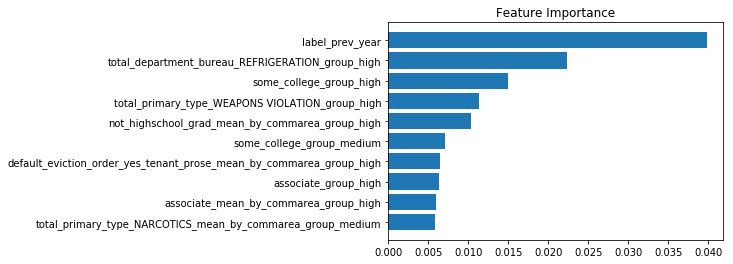

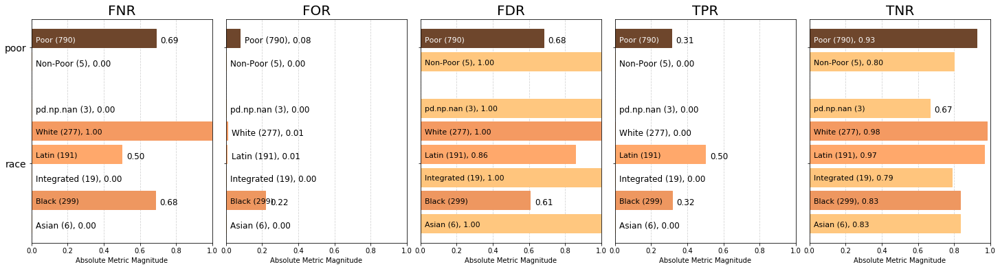

<Figure size 432x288 with 0 Axes>

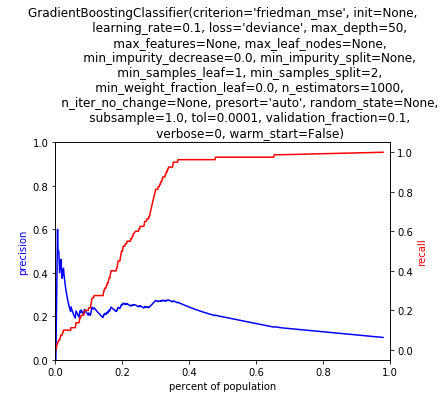

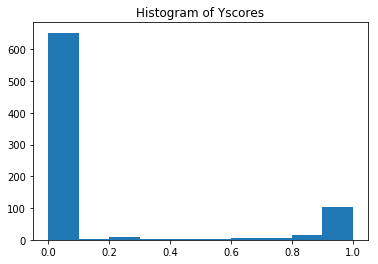

FEATURE IMPORTANCES

1. Feature label_prev_year (0.260541)
2. Feature population_race_black_mean_by_commarea_group_high (0.035231)
3. Feature default_eviction_order_no_tenant_prose_group_low (0.018278)
4. Feature graduate_group_medium (0.013846)
5. Feature eviction_filings_rate_group_low (0.012777)
6. Feature total_primary_type_BATTERY_group_low (0.011133)
7. Feature total_domestic_1_group_high (0.010952)
8. Feature total_department_bureau_CONSERVATION_group_medium (0.010516)
9. Feature total_primary_type_CRIMINAL DAMAGE_mean_by_commarea_group_medium (0.010229)
10. Feature total_inspection_category_COMPLAINT_perc_group_medium (0.010037)
            score  label_value
race                          
Asian           0          0.0
Black          75         76.0
Integrated      0          0.0
Latin           3          2.0
White           1          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

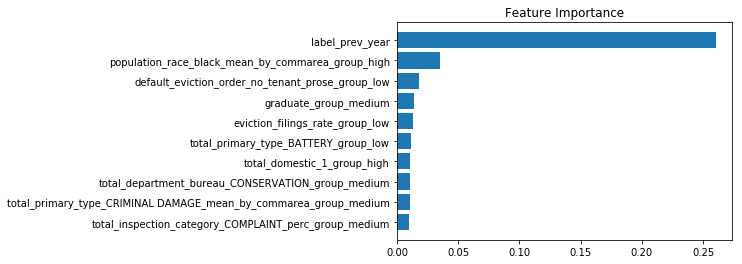

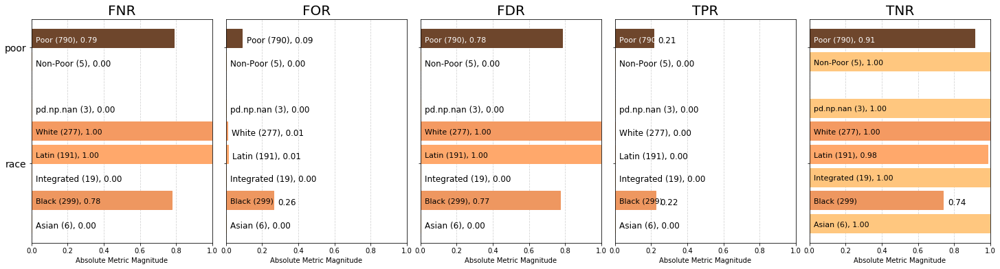

<Figure size 432x288 with 0 Axes>

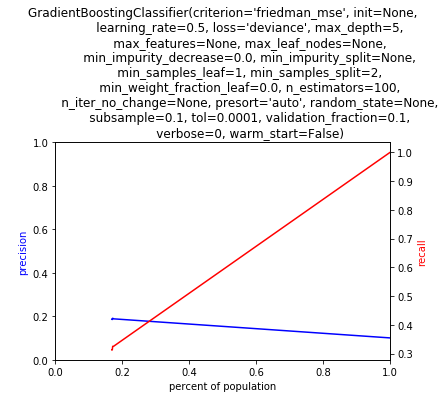

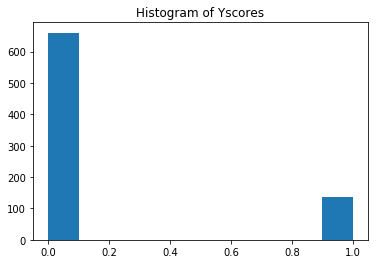

FEATURE IMPORTANCES

1. Feature total_primary_type_ROBBERY_mean_by_commarea_group_low (0.130856)
2. Feature total_crime_class_Violent Crime_mean_by_commarea_group_low (0.056489)
3. Feature label_prev_year (0.055820)
4. Feature total_primary_type_WEAPONS VIOLATION_mean_by_commarea_group_low (0.042938)
5. Feature total_primary_type_ROBBERY_mean_by_commarea_group_medium (0.041115)
6. Feature eviction_filings_rate_group_low (0.026178)
7. Feature perc_total_crime_class_Property Crime_mean_by_commarea_group_low (0.022197)
8. Feature total_primary_type_BATTERY_mean_by_commarea_group_low (0.021917)
9. Feature eviction_filings_rate_group_medium (0.019348)
10. Feature total_department_bureau_SPECIAL TASK FORCE_mean_by_commarea_group_medium (0.013672)
            score  label_value
race                          
Asian           0          0.0
Black          50         76.0
Integrated      6          0.0
Latin           8          2.0
White          15          2.0
model_id, score_thresholds 1 {'r

<Figure size 432x288 with 0 Axes>

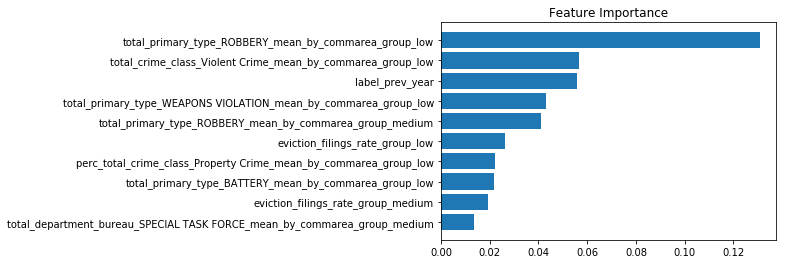

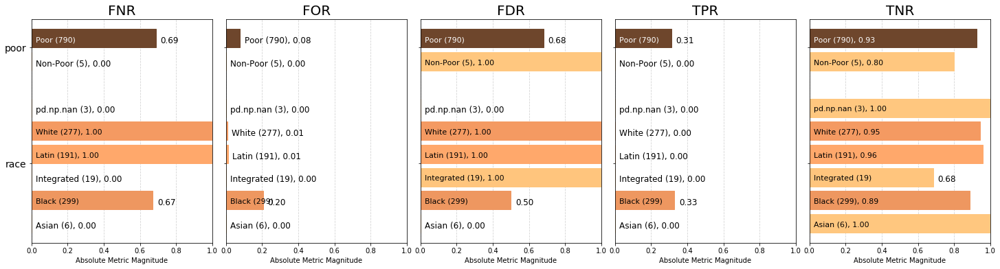

<Figure size 432x288 with 0 Axes>

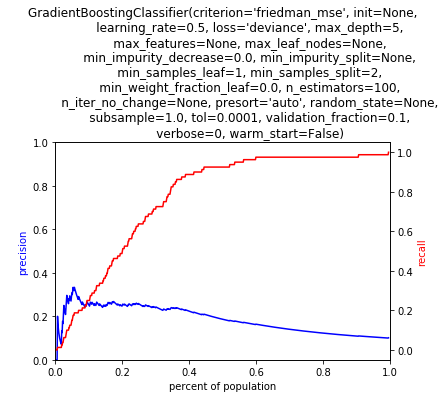

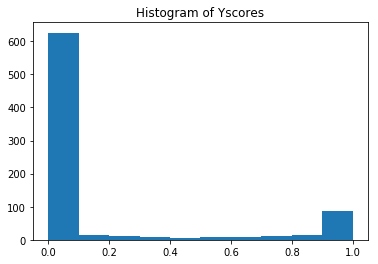

FEATURE IMPORTANCES

1. Feature label_prev_year (0.257152)
2. Feature population_race_black_mean_by_commarea_group_high (0.033124)
3. Feature default_eviction_order_no_tenant_prose_group_low (0.017239)
4. Feature eviction_filings_rate_group_low (0.013819)
5. Feature population_race_black_group_high (0.013215)
6. Feature eviction_order_yes_tenant_rep_pa_mean_by_commarea_group_low (0.013056)
7. Feature total_domestic_1_group_high (0.012575)
8. Feature graduate_group_low (0.012126)
9. Feature total_primary_type_BATTERY_group_low (0.011638)
10. Feature total_primary_type_LIQUOR LAW VIOLATION_mean_by_commarea_group_low (0.011510)
            score  label_value
race                          
Asian           0          0.0
Black          73         76.0
Integrated      0          0.0
Latin           3          2.0
White           3          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

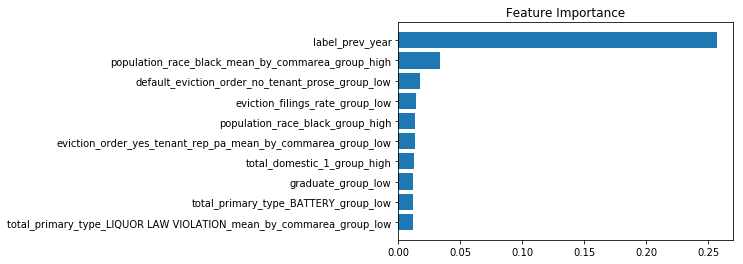

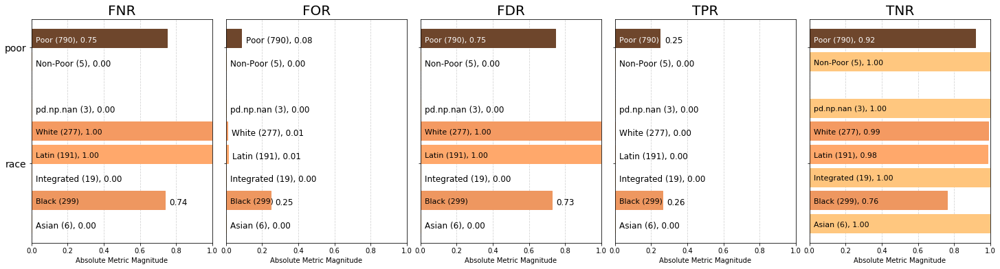

<Figure size 432x288 with 0 Axes>

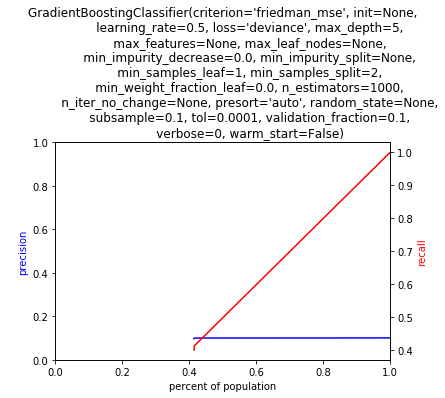

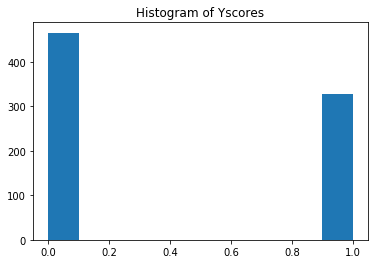

FEATURE IMPORTANCES

1. Feature total_violation_status_OPEN_perc_group_medium (0.383370)
2. Feature label_prev_year (0.087171)
3. Feature total_arrest_1_mean_by_commarea_group_medium (0.033445)
4. Feature total_crime_class_Violent Crime_mean_by_commarea_group_low (0.025541)
5. Feature population_race_black_group_high (0.014558)
6. Feature not_highschool_grad_mean_by_commarea_group_high (0.011415)
7. Feature total_primary_type_GAMBLING_mean_by_commarea_group_low (0.010244)
8. Feature total_inspection_category_REGISTRATION_mean_by_commarea_group_low (0.009310)
9. Feature total_primary_type_NARCOTICS_mean_by_commarea_group_low (0.008818)
10. Feature total_violation_status_OPEN_mean_by_commarea_group_low (0.008314)
            score  label_value
race                          
Asian           0          0.0
Black          29         76.0
Integrated      1          0.0
Latin           2          2.0
White          47          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

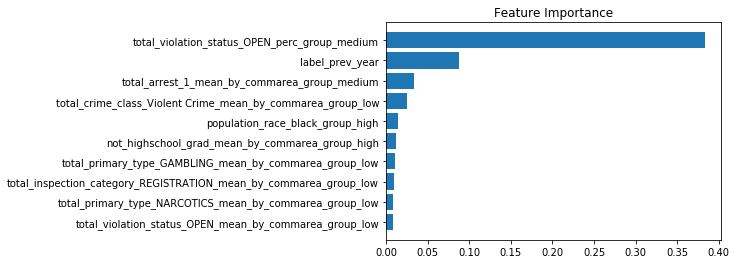

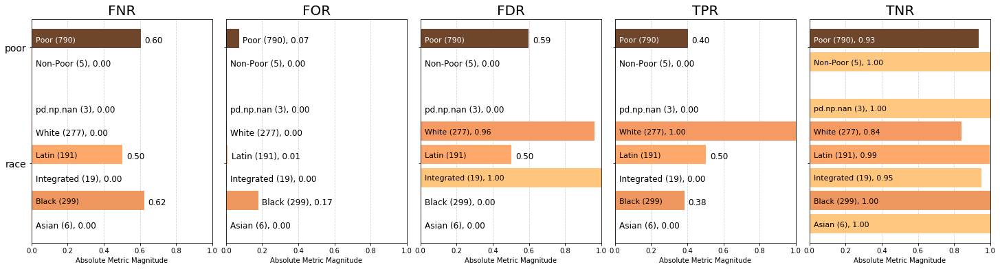

<Figure size 432x288 with 0 Axes>

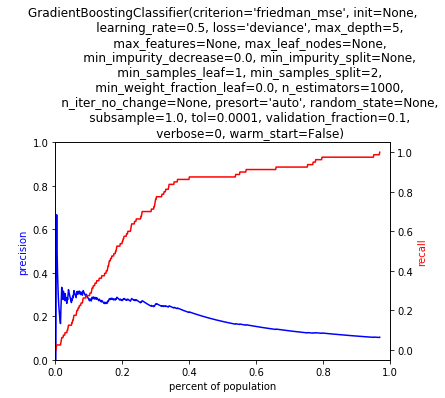

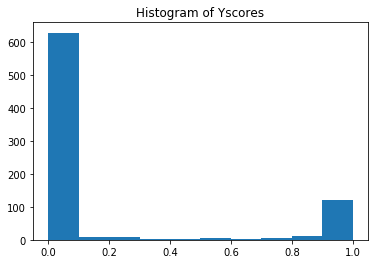

FEATURE IMPORTANCES

1. Feature label_prev_year (0.264045)
2. Feature population_race_black_mean_by_commarea_group_high (0.033592)
3. Feature default_eviction_order_no_tenant_prose_group_low (0.017566)
4. Feature population_race_black_group_high (0.015652)
5. Feature eviction_filings_rate_group_low (0.013521)
6. Feature total_primary_type_BATTERY_group_low (0.012353)
7. Feature eviction_order_yes_tenant_rep_pa_mean_by_commarea_group_low (0.012064)
8. Feature graduate_group_low (0.011506)
9. Feature total_domestic_1_group_high (0.010449)
10. Feature some_college_group_low (0.009621)
            score  label_value
race                          
Asian           0          0.0
Black          69         76.0
Integrated      0          0.0
Latin           2          2.0
White           6          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

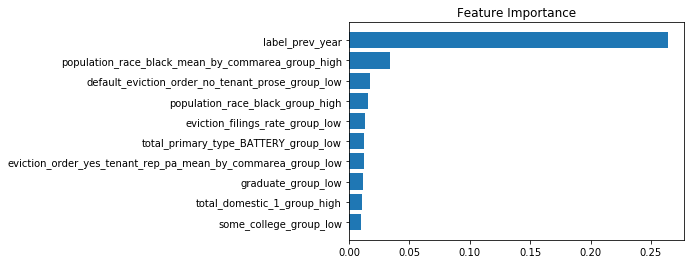

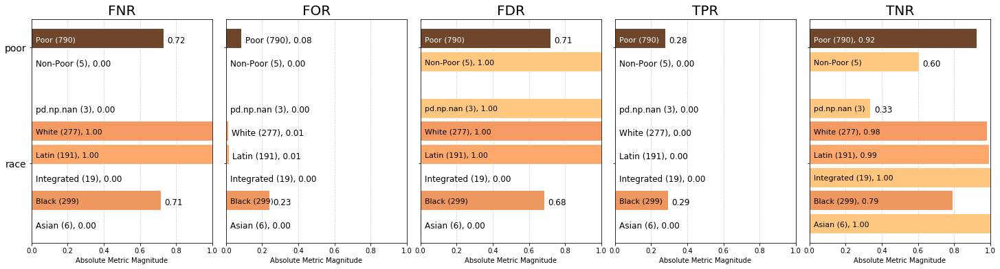

<Figure size 432x288 with 0 Axes>

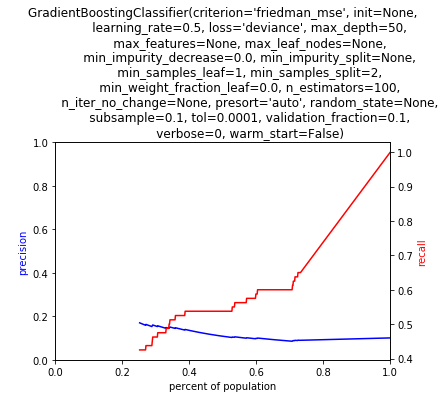

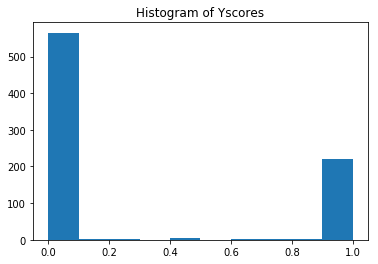

FEATURE IMPORTANCES

1. Feature total_department_bureau_IRON_mean_by_commarea_group_high (0.040906)
2. Feature label_prev_year (0.026704)
3. Feature total_violation_status_COMPLIED_mean_by_commarea_group_high (0.013127)
4. Feature total_primary_type_OFFENSE INVOLVING CHILDREN_mean_by_commarea_group_low (0.010023)
5. Feature high_school_grad_group_medium (0.009601)
6. Feature total_inspection_category_REGISTRATION_mean_by_commarea_group_high (0.008897)
7. Feature total_primary_type_OFFENSE INVOLVING CHILDREN_mean_by_commarea_group_medium (0.008826)
8. Feature total_primary_type_CRIMINAL DAMAGE_mean_by_commarea_group_medium (0.008756)
9. Feature ftu_eviction_order_tenant_prose_mean_by_commarea_group_medium (0.008211)
10. Feature some_college_group_medium (0.007712)
            score  label_value
race                          
Asian           0          0.0
Black          36         76.0
Integrated      4          0.0
Latin          18          2.0
White          21          2.0
model_id,

<Figure size 432x288 with 0 Axes>

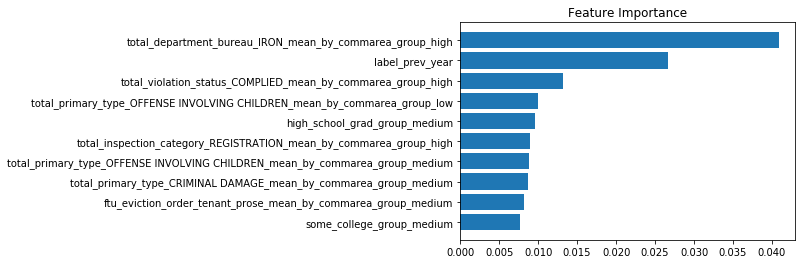

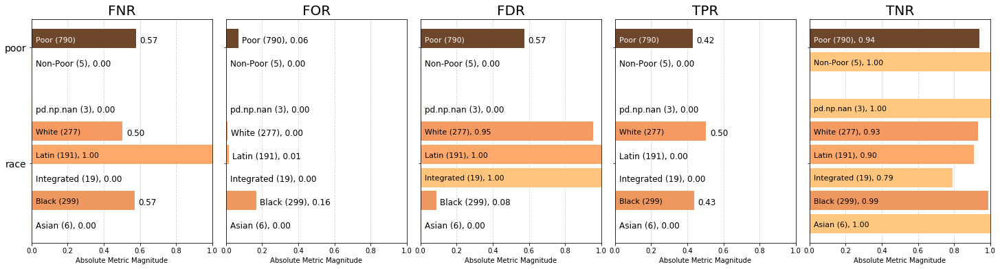

<Figure size 432x288 with 0 Axes>

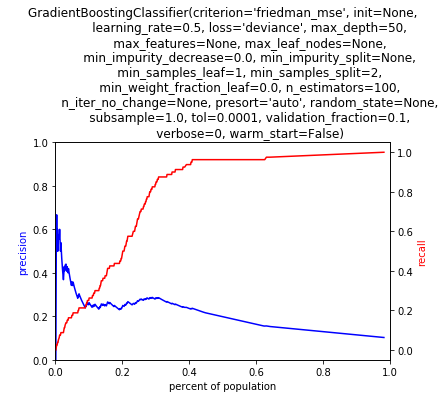

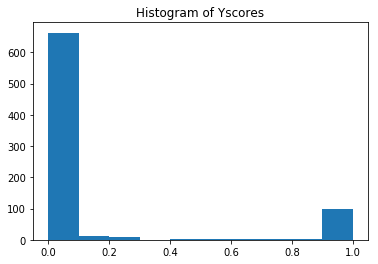

FEATURE IMPORTANCES

1. Feature label_prev_year (0.260540)
2. Feature population_race_black_mean_by_commarea_group_high (0.034901)
3. Feature default_eviction_order_no_tenant_prose_group_low (0.018278)
4. Feature graduate_group_medium (0.016937)
5. Feature some_college_group_high (0.015323)
6. Feature eviction_filings_rate_group_low (0.015062)
7. Feature total_violation_status_OPEN_perc_group_high (0.013280)
8. Feature total_department_bureau_CONSERVATION_group_medium (0.013056)
9. Feature eviction_order_yes_tenant_rep_pa_mean_by_commarea_group_low (0.011989)
10. Feature perc_total_crime_class_Less serious offences_group_medium (0.011767)
            score  label_value
race                          
Asian           0          0.0
Black          74         76.0
Integrated      0          0.0
Latin           3          2.0
White           2          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

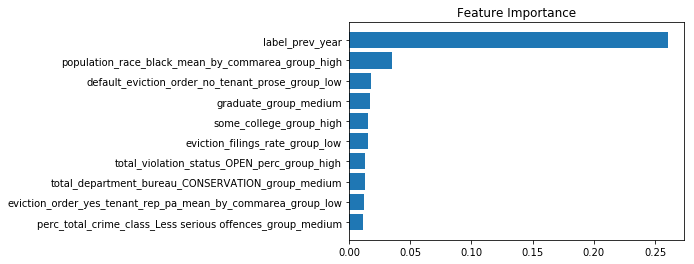

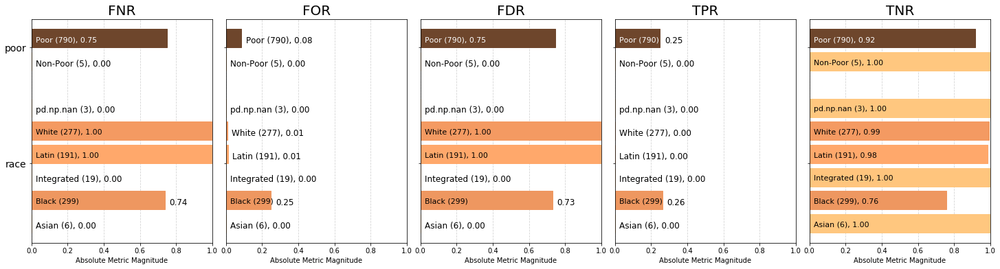

<Figure size 432x288 with 0 Axes>

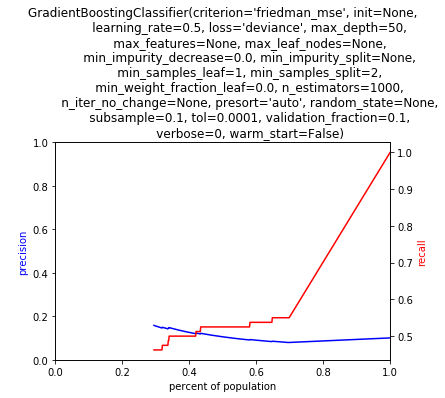

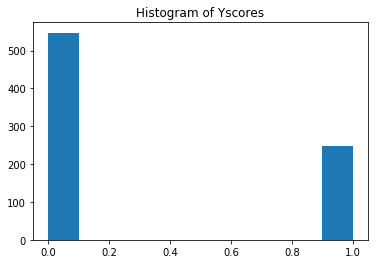

FEATURE IMPORTANCES

1. Feature total_domestic_1_mean_by_commarea_group_medium (0.033659)
2. Feature total_inspection_category_REGISTRATION_mean_by_commarea_group_medium (0.017481)
3. Feature label_prev_year (0.016648)
4. Feature total_inspection_category_REGISTRATION_mean_by_commarea_group_low (0.014606)
5. Feature total_crime_class_Violent Crime_mean_by_commarea_group_medium (0.012169)
6. Feature total_department_bureau_WATER_mean_by_commarea_group_low (0.010671)
7. Feature total_primary_type_PROSTITUTION_group_low (0.010050)
8. Feature total_department_bureau_SIGNS_group_medium (0.009965)
9. Feature total_primary_type_PUBLIC PEACE VIOLATION_mean_by_commarea_group_medium (0.009440)
10. Feature some_college_group_high (0.008628)
            score  label_value
race                          
Asian           0          0.0
Black          37         76.0
Integrated      3          0.0
Latin           4          2.0
White          35          2.0
model_id, score_thresholds 1 {'rank_abs': [

<Figure size 432x288 with 0 Axes>

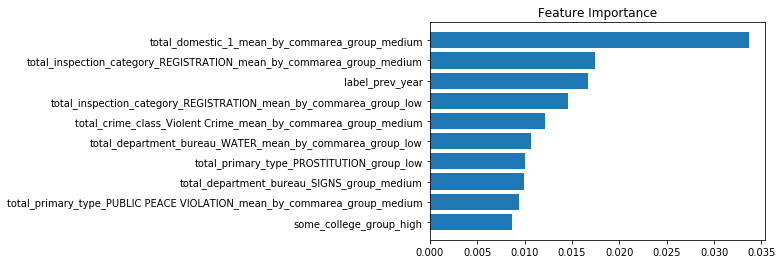

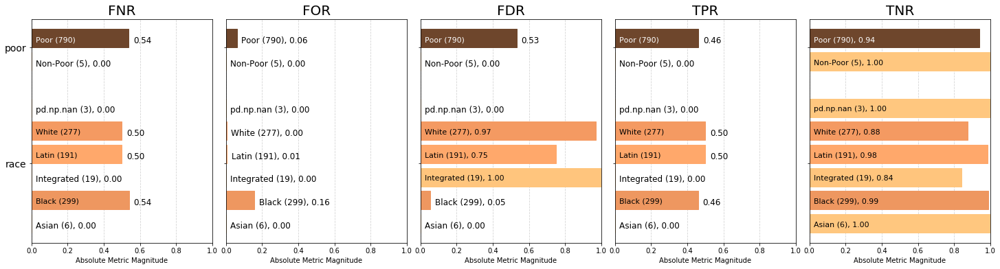

<Figure size 432x288 with 0 Axes>

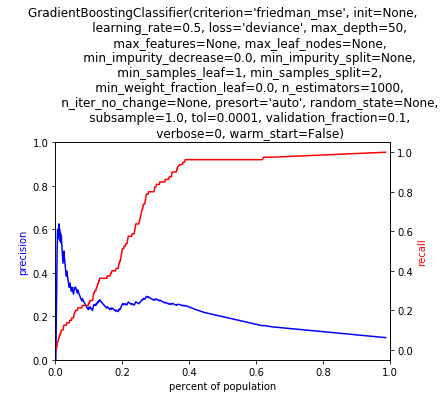

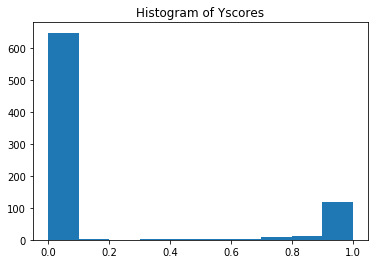

FEATURE IMPORTANCES

1. Feature label_prev_year (0.260540)
2. Feature population_race_black_mean_by_commarea_group_high (0.034901)
3. Feature default_eviction_order_no_tenant_prose_group_low (0.018278)
4. Feature graduate_group_medium (0.014657)
5. Feature up_to_middle_group_low (0.014468)
6. Feature perc_total_crime_class_Less serious offences_group_medium (0.013916)
7. Feature eviction_filings_rate_group_low (0.012777)
8. Feature some_college_group_medium (0.012426)
9. Feature eviction_order_yes_tenant_rep_pa_mean_by_commarea_group_low (0.012187)
10. Feature total_primary_type_OTHER OFFENSE_mean_by_commarea_group_medium (0.011630)
            score  label_value
race                          
Asian           0          0.0
Black          72         76.0
Integrated      0          0.0
Latin           3          2.0
White           4          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

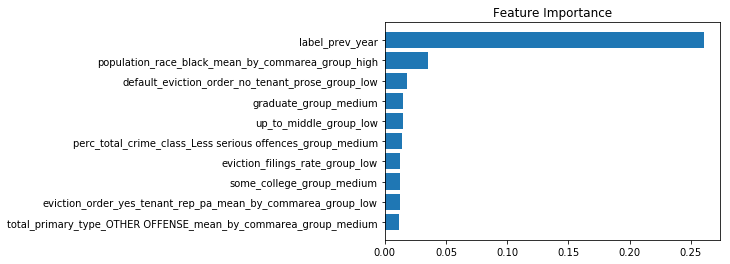

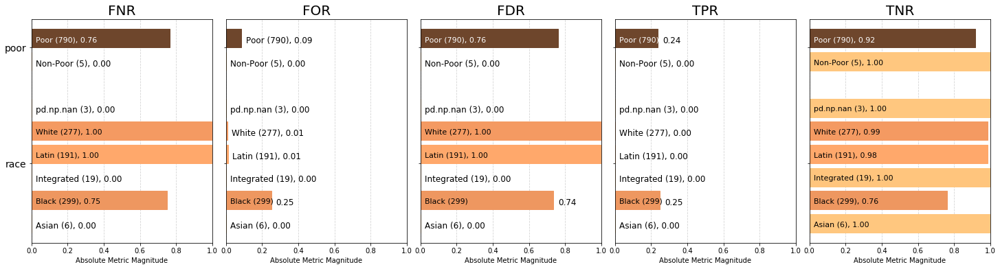

GB


<Figure size 432x288 with 0 Axes>

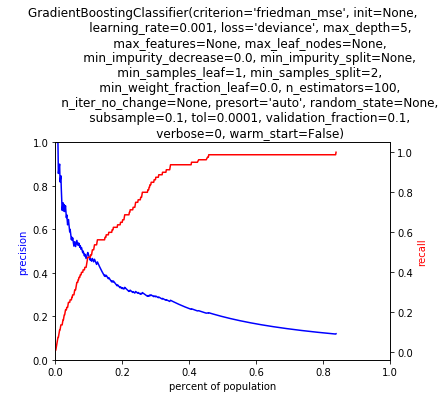

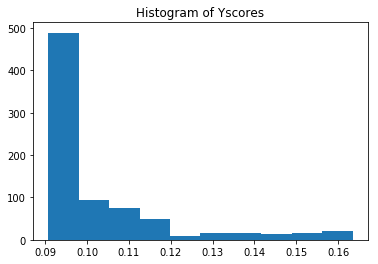

FEATURE IMPORTANCES

1. Feature label_prev_year (0.297983)
2. Feature population_race_black_group_high (0.021126)
3. Feature population_race_black_mean_by_commarea_group_high (0.010757)
4. Feature eviction_filings_rate_group_low (0.010400)
5. Feature eviction_filings_rate_mean_by_commarea_group_medium (0.009563)
6. Feature some_college_group_high (0.008899)
7. Feature eviction_filings_rate_mean_by_commarea_group_low (0.008479)
8. Feature total_primary_type_NARCOTICS_mean_by_commarea_group_medium (0.007030)
9. Feature perc_increase_total_crime_class_Less serious offences_group_medium (0.006506)
10. Feature total_domestic_1_group_medium (0.006466)
            score  label_value
race                          
Asian           0          0.0
Black          75         75.0
Integrated      0          0.0
Latin           2          2.0
White           2          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

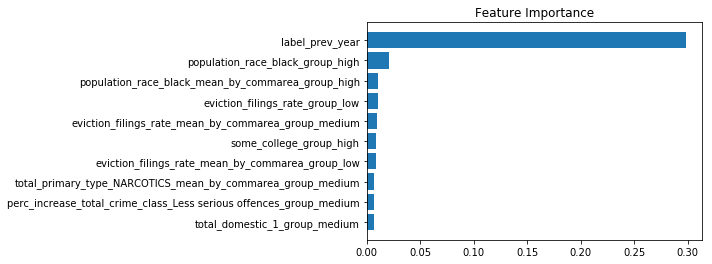

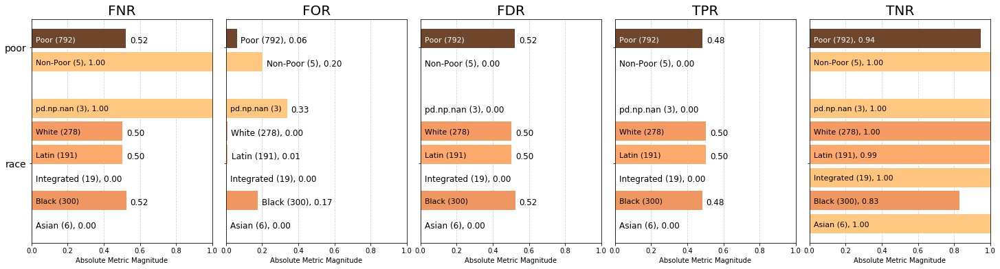

<Figure size 432x288 with 0 Axes>

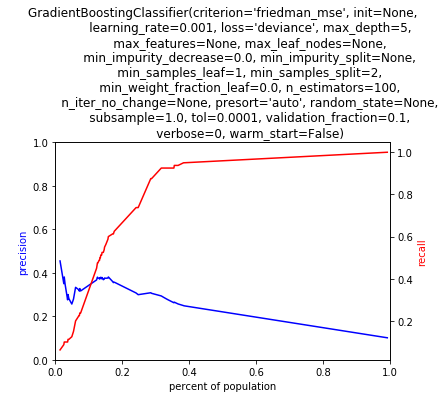

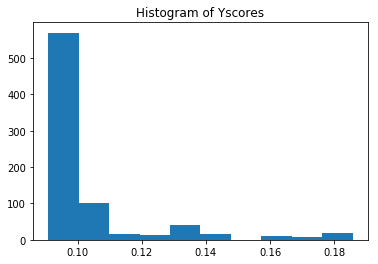

FEATURE IMPORTANCES

1. Feature label_prev_year (0.620047)
2. Feature population_race_black_group_high (0.062281)
3. Feature eviction_order_no_group_low (0.039427)
4. Feature population_race_black_mean_by_commarea_group_high (0.031690)
5. Feature total_crime_class_Less serious offences_group_medium (0.021813)
6. Feature total_department_bureau_SPECIAL TASK FORCE_mean_by_commarea_group_high (0.020060)
7. Feature eviction_filings_rate_group_low (0.020021)
8. Feature some_college_group_high (0.014107)
9. Feature perc_increase_total_crime_class_Less serious offences_group_medium (0.012707)
10. Feature total_primary_type_GAMBLING_mean_by_commarea_group_high (0.010899)
            score  label_value
race                          
Asian           0          0.0
Black          76         75.0
Integrated      0          0.0
Latin           2          2.0
White           1          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

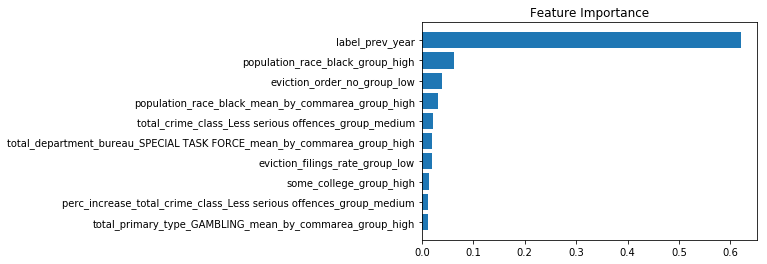

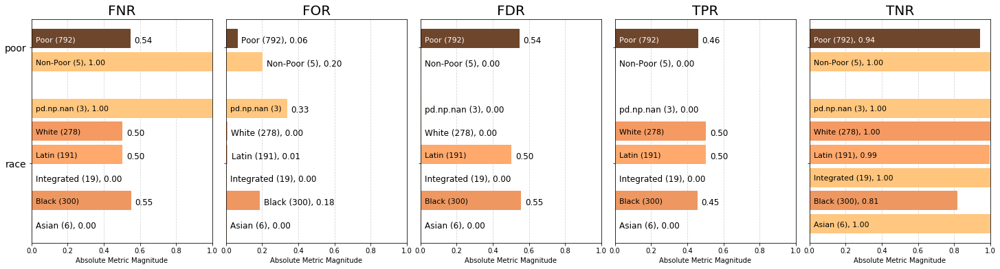

<Figure size 432x288 with 0 Axes>

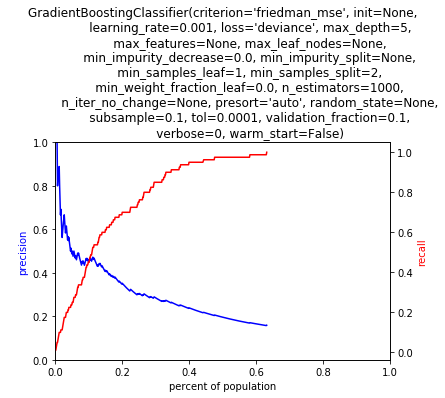

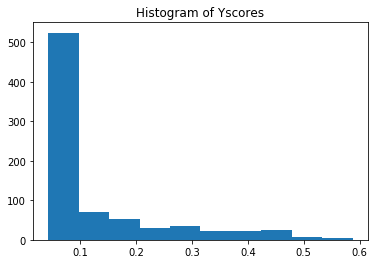

FEATURE IMPORTANCES

1. Feature label_prev_year (0.212472)
2. Feature eviction_filings_rate_group_low (0.017607)
3. Feature population_race_black_group_high (0.011730)
4. Feature some_college_group_high (0.008079)
5. Feature population_race_black_mean_by_commarea_group_high (0.007802)
6. Feature total_department_bureau_DEMOLITION_mean_by_commarea_group_high (0.007731)
7. Feature total_primary_type_HUMAN TRAFFICKING_mean_by_commarea (0.007315)
8. Feature high_school_grad_group_high (0.007272)
9. Feature eviction_filings_rate_group_medium (0.006482)
10. Feature associate_group_low (0.006381)
            score  label_value
race                          
Asian           0          0.0
Black          74         75.0
Integrated      0          0.0
Latin           2          2.0
White           3          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

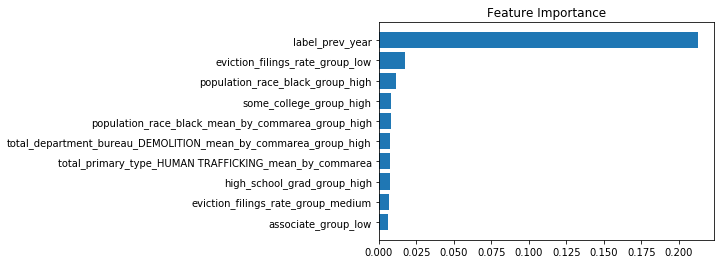

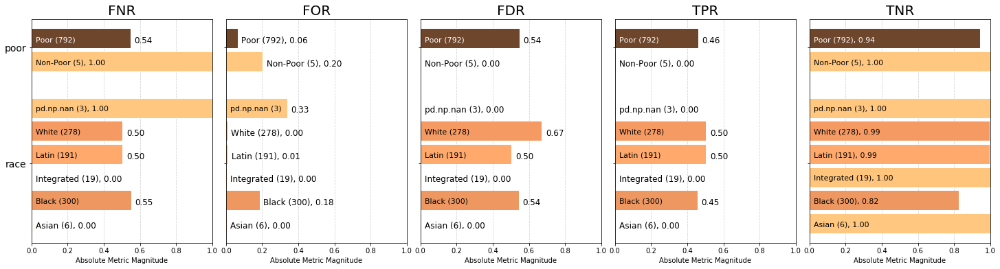

<Figure size 432x288 with 0 Axes>

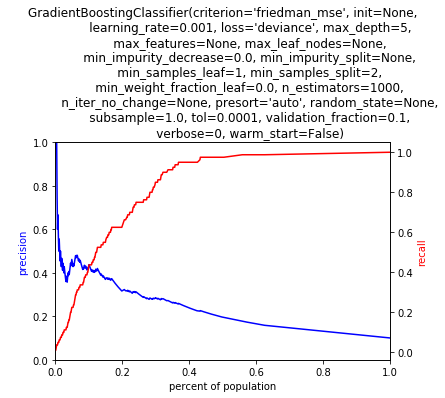

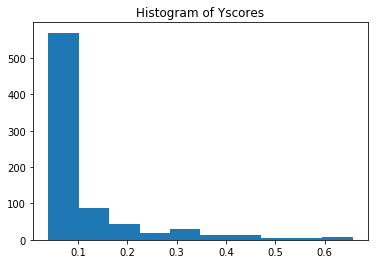

FEATURE IMPORTANCES

1. Feature label_prev_year (0.552222)
2. Feature population_race_black_group_high (0.039565)
3. Feature population_race_black_mean_by_commarea_group_high (0.032217)
4. Feature eviction_filings_rate_group_low (0.019638)
5. Feature eviction_order_no_group_low (0.017421)
6. Feature eviction_filings_rate_mean_by_commarea_group_medium (0.014420)
7. Feature total_primary_type_BATTERY_group_low (0.014255)
8. Feature perc_increase_total_crime_class_Less serious offences_group_medium (0.012538)
9. Feature total_department_bureau_SPECIAL TASK FORCE_mean_by_commarea_group_high (0.011579)
10. Feature total_crime_class_Less serious offences_group_medium (0.011141)
            score  label_value
race                          
Asian           0          0.0
Black          76         75.0
Integrated      0          0.0
Latin           2          2.0
White           1          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

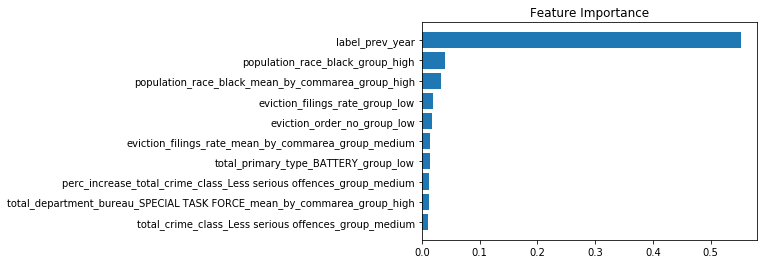

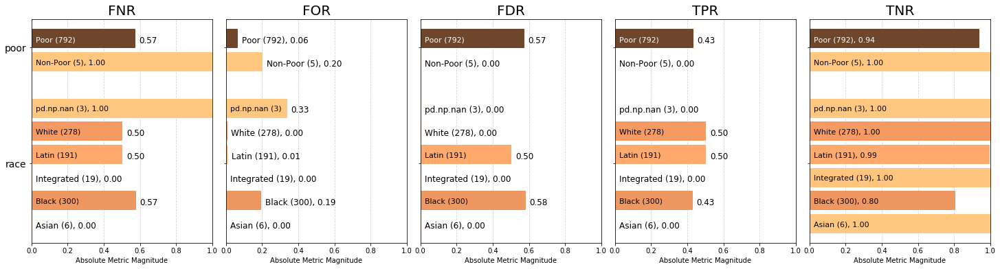

<Figure size 432x288 with 0 Axes>

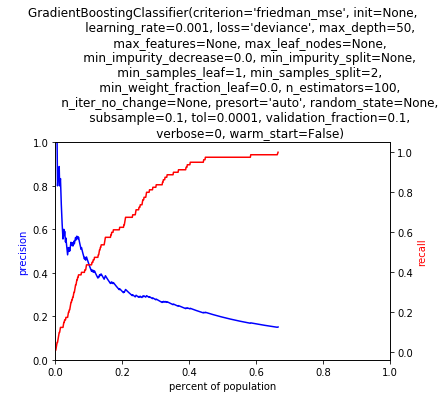

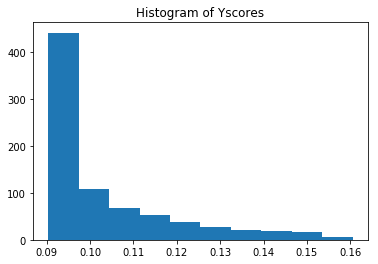

FEATURE IMPORTANCES

1. Feature label_prev_year (0.222919)
2. Feature population_race_black_mean_by_commarea_group_high (0.011530)
3. Feature population_race_black_group_high (0.008869)
4. Feature perc_increase_total_crime_class_Violent Crime_group_high (0.007626)
5. Feature some_college_group_high (0.007150)
6. Feature total_inspection_category_COMPLAINT_perc_group_high (0.006666)
7. Feature total_department_bureau_SPECIAL TASK FORCE_mean_by_commarea_group_high (0.006616)
8. Feature some_college_group_medium (0.006502)
9. Feature not_highschool_grad_group_low (0.006375)
10. Feature eviction_filings_rate_group_low (0.006341)
            score  label_value
race                          
Asian           0          0.0
Black          75         75.0
Integrated      0          0.0
Latin           2          2.0
White           2          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

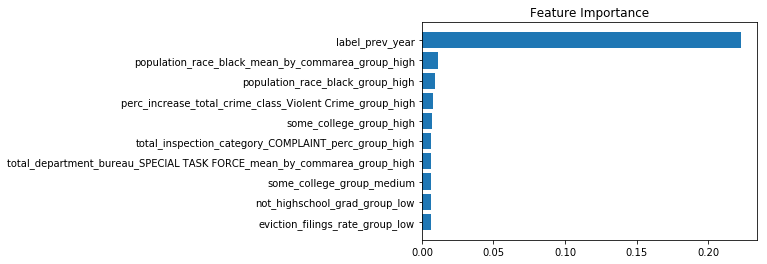

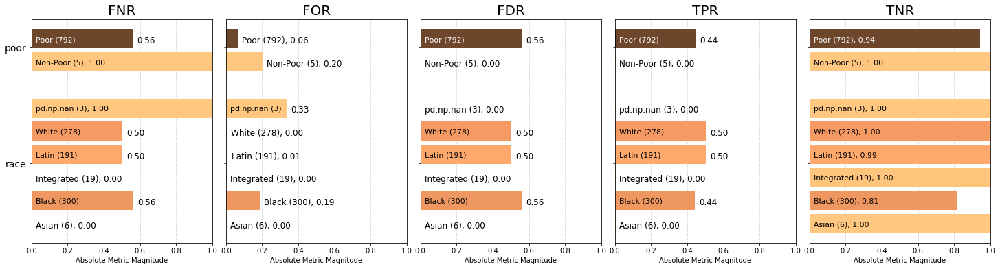

<Figure size 432x288 with 0 Axes>

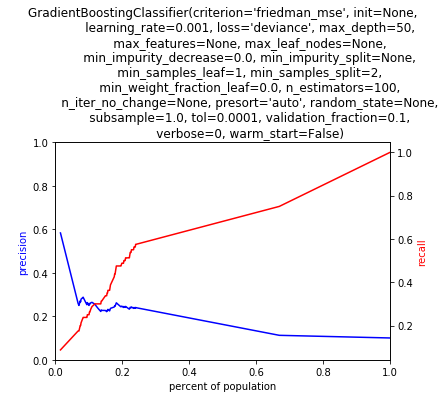

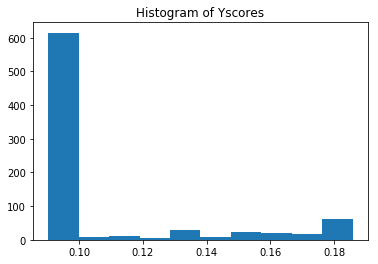

FEATURE IMPORTANCES

1. Feature label_prev_year (0.257791)
2. Feature population_race_black_group_high (0.038268)
3. Feature some_college_group_medium (0.022158)
4. Feature some_college_group_high (0.018086)
5. Feature eviction_order_no_group_low (0.016537)
6. Feature high_school_grad_group_medium (0.012974)
7. Feature perc_increase_total_crime_class_Less serious offences_group_medium (0.012171)
8. Feature total_crime_class_Less serious offences_group_medium (0.009448)
9. Feature total_department_bureau_SPECIAL TASK FORCE_mean_by_commarea_group_high (0.008928)
10. Feature total_inspection_category_COMPLAINT_perc_group_medium (0.008631)
            score  label_value
race                          
Asian           0          0.0
Black          70         75.0
Integrated      0          0.0
Latin           4          2.0
White           5          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

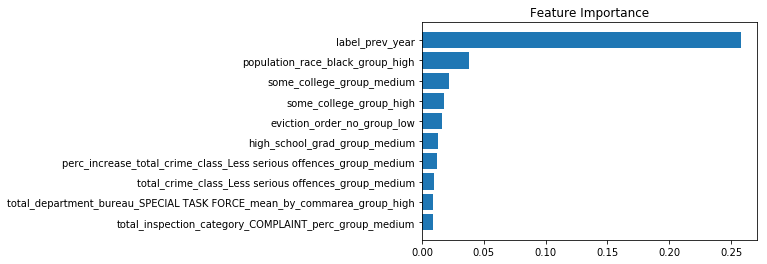

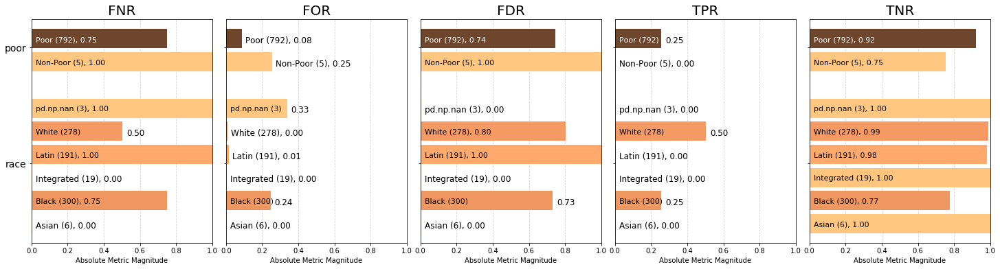

<Figure size 432x288 with 0 Axes>

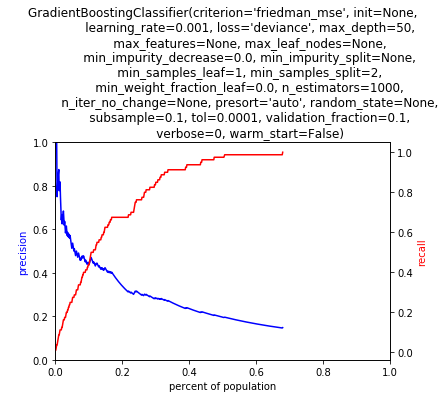

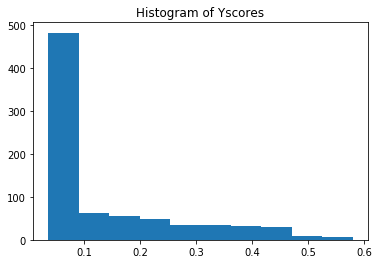

FEATURE IMPORTANCES

1. Feature label_prev_year (0.149258)
2. Feature eviction_filings_rate_group_low (0.011115)
3. Feature population_race_black_group_high (0.010404)
4. Feature some_college_group_high (0.009026)
5. Feature high_school_grad_group_high (0.007655)
6. Feature perc_total_crime_class_Property Crime_group_low (0.007387)
7. Feature some_college_group_medium (0.007226)
8. Feature perc_increase_total_crime_class_Less serious offences_group_medium (0.006392)
9. Feature total_primary_type_HUMAN TRAFFICKING_mean_by_commarea (0.006303)
10. Feature high_school_grad_group_medium (0.006258)
            score  label_value
race                          
Asian           0          0.0
Black          76         75.0
Integrated      0          0.0
Latin           1          2.0
White           2          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

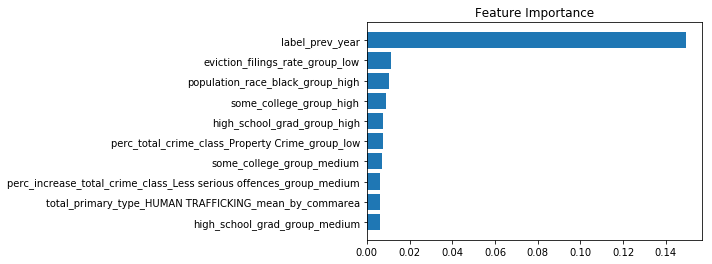

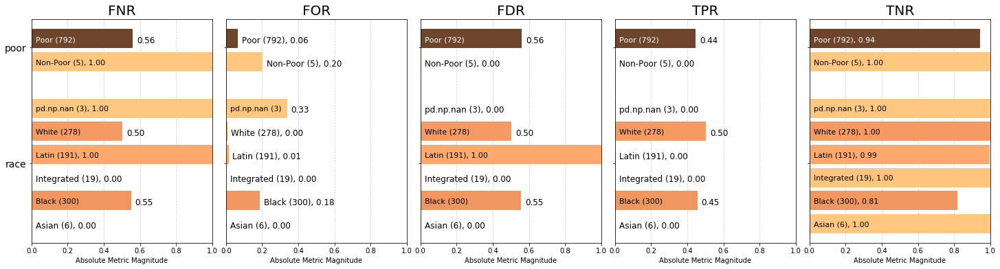

<Figure size 432x288 with 0 Axes>

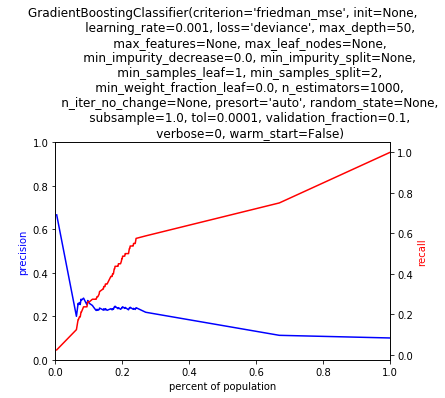

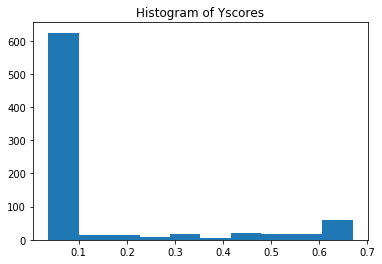

FEATURE IMPORTANCES

1. Feature label_prev_year (0.257791)
2. Feature population_race_black_group_high (0.038260)
3. Feature some_college_group_medium (0.021993)
4. Feature some_college_group_high (0.018541)
5. Feature eviction_order_no_group_low (0.016491)
6. Feature high_school_grad_group_medium (0.013168)
7. Feature perc_increase_total_crime_class_Less serious offences_group_medium (0.012223)
8. Feature total_crime_class_Less serious offences_group_medium (0.009508)
9. Feature total_department_bureau_SPECIAL TASK FORCE_mean_by_commarea_group_high (0.008928)
10. Feature total_inspection_category_COMPLAINT_perc_group_medium (0.008616)
            score  label_value
race                          
Asian           0          0.0
Black          71         75.0
Integrated      0          0.0
Latin           3          2.0
White           5          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

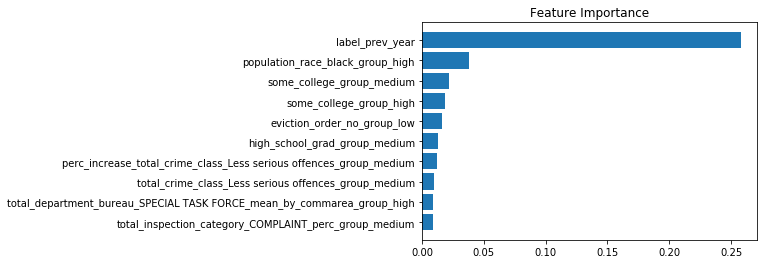

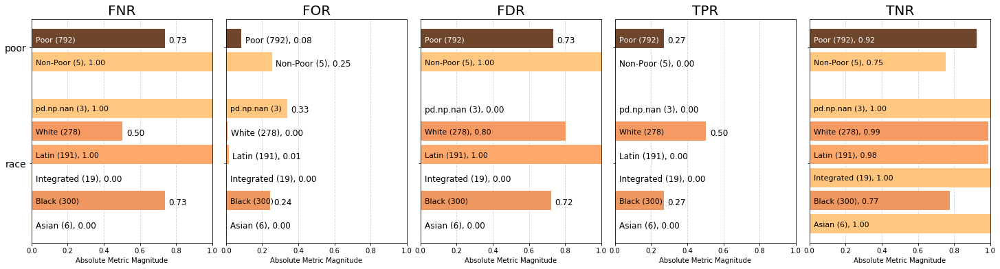

<Figure size 432x288 with 0 Axes>

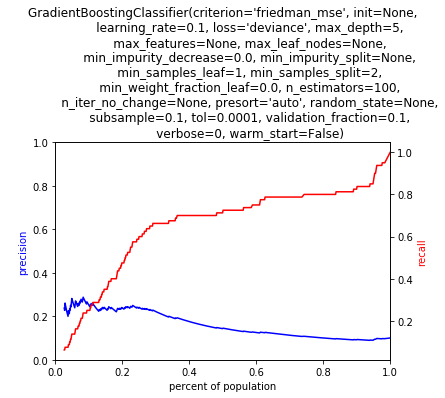

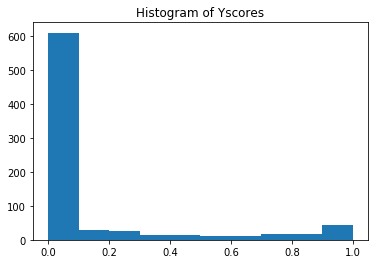

FEATURE IMPORTANCES

1. Feature label_prev_year (0.055683)
2. Feature total_arrest_1_group_high (0.049954)
3. Feature total_department_bureau_REFRIGERATION_group_high (0.019550)
4. Feature total_primary_type_NARCOTICS_group_high (0.017976)
5. Feature eviction_filings_rate_group_low (0.013660)
6. Feature total_primary_type_NARCOTICS_mean_by_commarea_group_medium (0.013329)
7. Feature not_highschool_grad_mean_by_commarea_group_high (0.011910)
8. Feature total_primary_type_HUMAN TRAFFICKING_mean_by_commarea (0.011298)
9. Feature total_primary_type_PROSTITUTION_group_high (0.010557)
10. Feature total_inspection_category_REGISTRATION_mean_by_commarea_group_low (0.010448)
            score  label_value
race                          
Asian           0          0.0
Black          64         75.0
Integrated      0          0.0
Latin           8          2.0
White           7          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

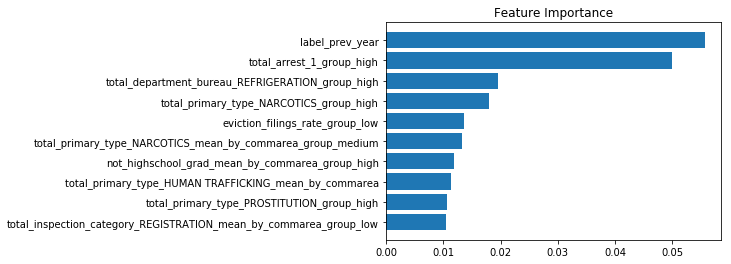

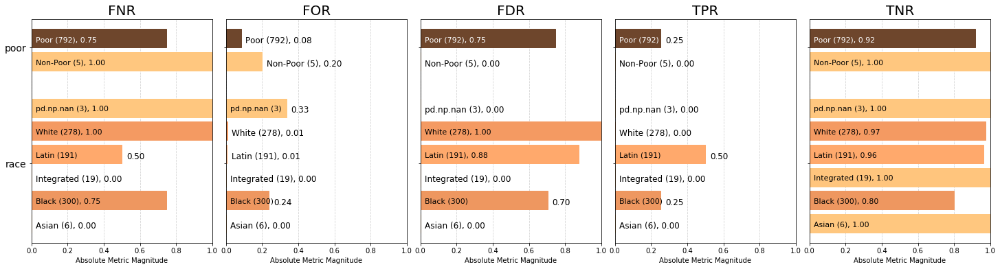

<Figure size 432x288 with 0 Axes>

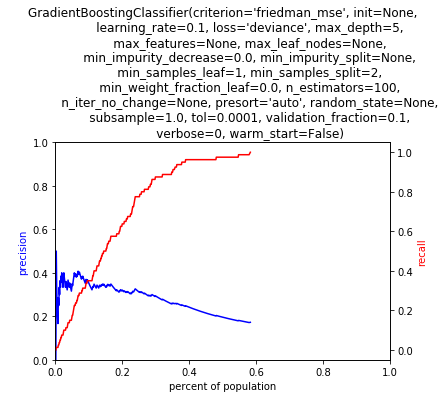

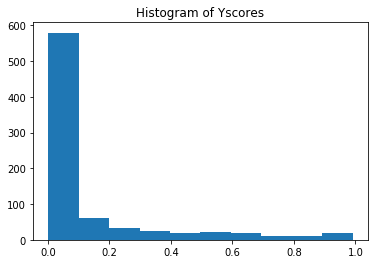

FEATURE IMPORTANCES

1. Feature label_prev_year (0.346711)
2. Feature population_race_black_group_high (0.031683)
3. Feature population_race_black_mean_by_commarea_group_high (0.019501)
4. Feature eviction_filings_rate_group_low (0.014259)
5. Feature total_primary_type_PUBLIC PEACE VIOLATION_mean_by_commarea_group_medium (0.011824)
6. Feature perc_increase_total_crime_class_Less serious offences_group_medium (0.011645)
7. Feature eviction_filings_rate_mean_by_commarea_group_medium (0.011461)
8. Feature total_primary_type_BATTERY_group_low (0.010996)
9. Feature total_department_bureau_SPECIAL TASK FORCE_mean_by_commarea_group_high (0.010666)
10. Feature perc_increase_total_crime_class_Violent Crime_group_high (0.009555)
            score  label_value
race                          
Asian           0          0.0
Black          75         75.0
Integrated      0          0.0
Latin           2          2.0
White           2          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

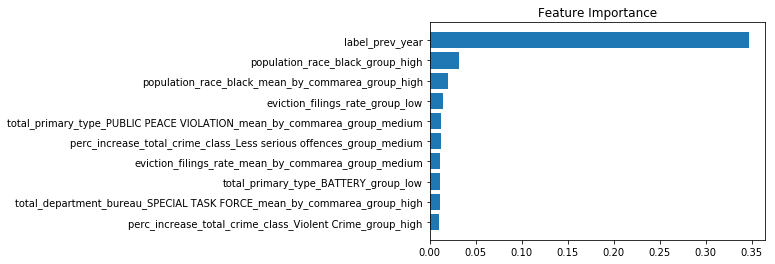

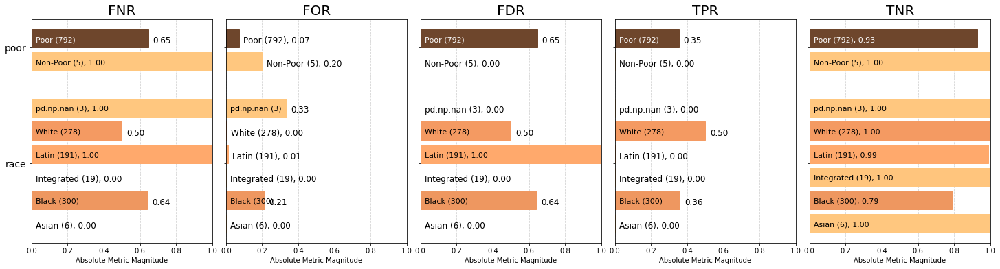

<Figure size 432x288 with 0 Axes>

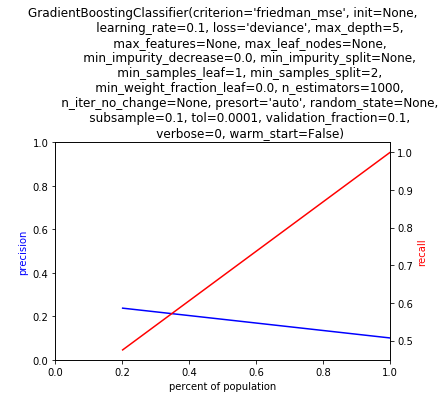

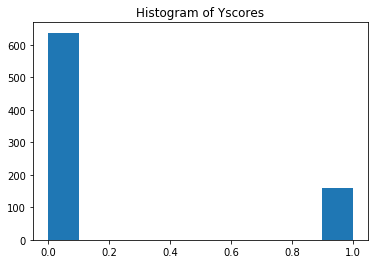

FEATURE IMPORTANCES

1. Feature some_college_group_high (0.092988)
2. Feature label_prev_year (0.020771)
3. Feature total_primary_type_NARCOTICS_mean_by_commarea_group_low (0.018458)
4. Feature total_primary_type_INTERFERENCE WITH PUBLIC OFFICER_mean_by_commarea_group_medium (0.015993)
5. Feature median_rent_group_low (0.014746)
6. Feature total_primary_type_CRIMINAL DAMAGE_mean_by_commarea_group_high (0.013429)
7. Feature total_primary_type_NARCOTICS_mean_by_commarea_group_medium (0.012163)
8. Feature not_highschool_grad_mean_by_commarea_group_high (0.009890)
9. Feature total_domestic_1_mean_by_commarea_group_medium (0.009259)
10. Feature total_primary_type_INTIMIDATION_mean_by_commarea_group_low (0.008051)
            score  label_value
race                          
Asian           2          0.0
Black          70         75.0
Integrated      2          0.0
Latin           2          2.0
White           3          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

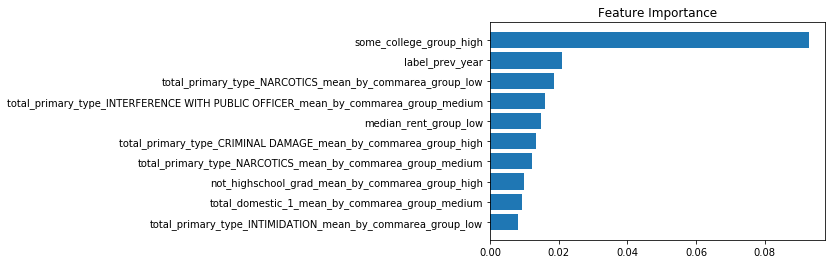

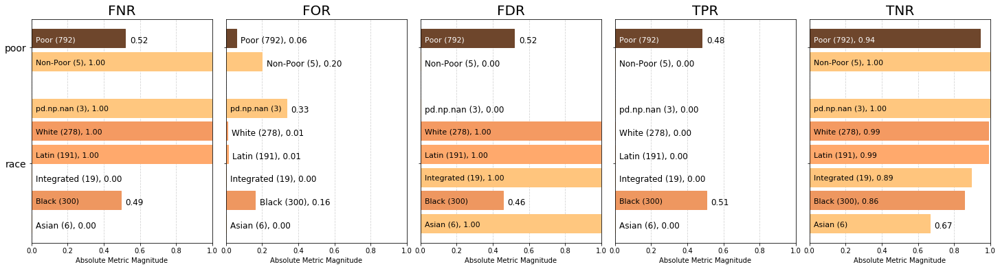

<Figure size 432x288 with 0 Axes>

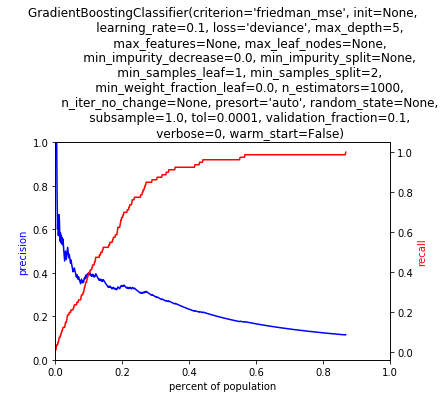

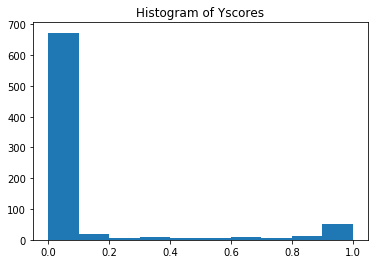

FEATURE IMPORTANCES

1. Feature label_prev_year (0.294192)
2. Feature population_race_black_group_high (0.027297)
3. Feature population_race_black_mean_by_commarea_group_high (0.016701)
4. Feature eviction_filings_rate_group_low (0.012417)
5. Feature total_primary_type_BATTERY_group_low (0.010144)
6. Feature perc_increase_total_crime_class_Violent Crime_group_high (0.009661)
7. Feature eviction_filings_rate_mean_by_commarea_group_medium (0.009421)
8. Feature perc_increase_total_crime_class_Less serious offences_group_medium (0.009277)
9. Feature total_primary_type_NARCOTICS_mean_by_commarea_group_medium (0.008357)
10. Feature total_primary_type_PUBLIC PEACE VIOLATION_mean_by_commarea_group_medium (0.008286)
            score  label_value
race                          
Asian           0          0.0
Black          75         75.0
Integrated      0          0.0
Latin           2          2.0
White           2          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

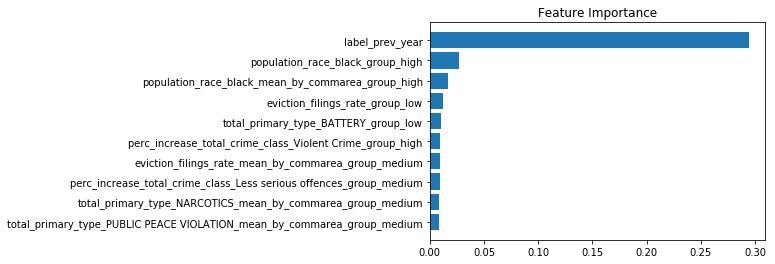

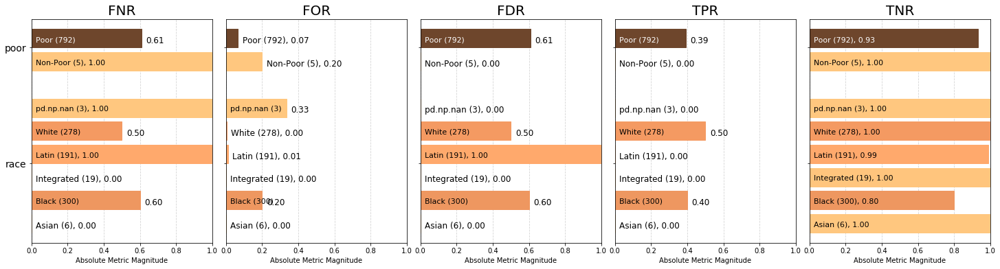

<Figure size 432x288 with 0 Axes>

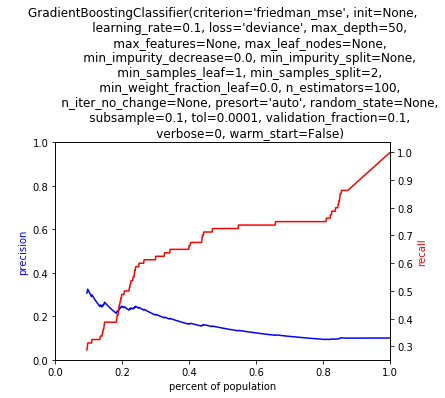

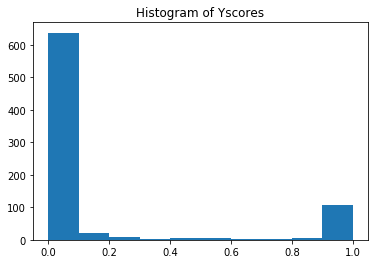

FEATURE IMPORTANCES

1. Feature total_department_bureau_CONSERVATION_mean_by_commarea_group_high (0.027085)
2. Feature label_prev_year (0.026194)
3. Feature total_inspection_category_COMPLAINT_mean_by_commarea_group_high (0.016003)
4. Feature total_primary_type_CRIM SEXUAL ASSAULT_mean_by_commarea_group_high (0.015089)
5. Feature total_violation_status_OPEN_mean_by_commarea_group_high (0.014494)
6. Feature population_race_other_group_high (0.013977)
7. Feature some_college_group_high (0.008877)
8. Feature some_college_group_medium (0.008497)
9. Feature total_inspection_category_REGISTRATION_mean_by_commarea_group_high (0.007645)
10. Feature total_violation_status_OPEN_perc_group_medium (0.007179)
            score  label_value
race                          
Asian           0          0.0
Black          62         75.0
Integrated      1          0.0
Latin           4          2.0
White          12          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

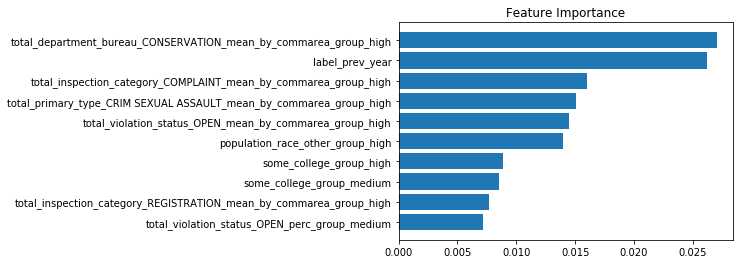

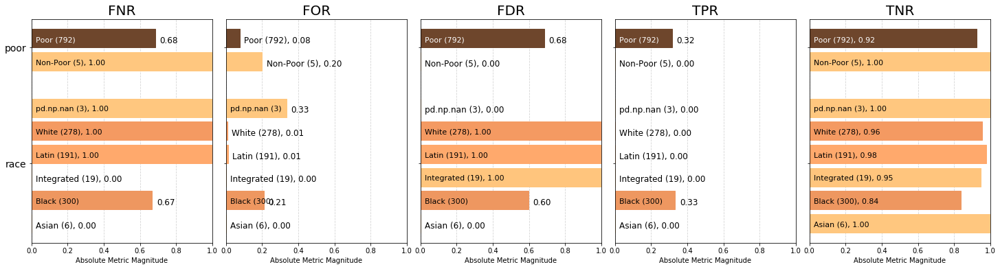

<Figure size 432x288 with 0 Axes>

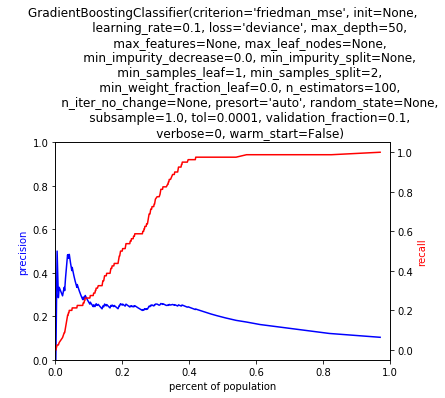

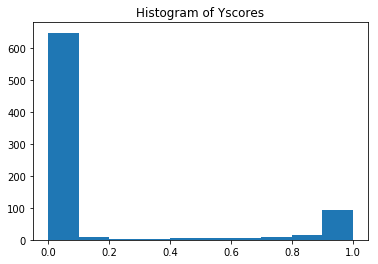

FEATURE IMPORTANCES

1. Feature label_prev_year (0.257790)
2. Feature population_race_black_group_high (0.038169)
3. Feature some_college_group_medium (0.024533)
4. Feature some_college_group_high (0.018066)
5. Feature eviction_order_no_group_low (0.016880)
6. Feature high_school_grad_group_medium (0.013208)
7. Feature perc_increase_total_crime_class_Less serious offences_group_medium (0.011390)
8. Feature total_inspection_category_COMPLAINT_perc_group_medium (0.009663)
9. Feature total_crime_class_Less serious offences_group_medium (0.009530)
10. Feature total_crime_class_Violent Crime_group_low (0.009072)
            score  label_value
race                          
Asian           0          0.0
Black          73         75.0
Integrated      0          0.0
Latin           2          2.0
White           4          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

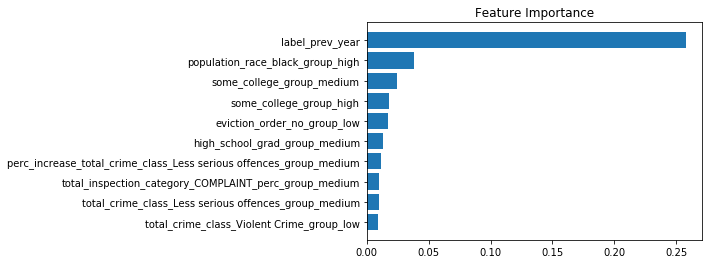

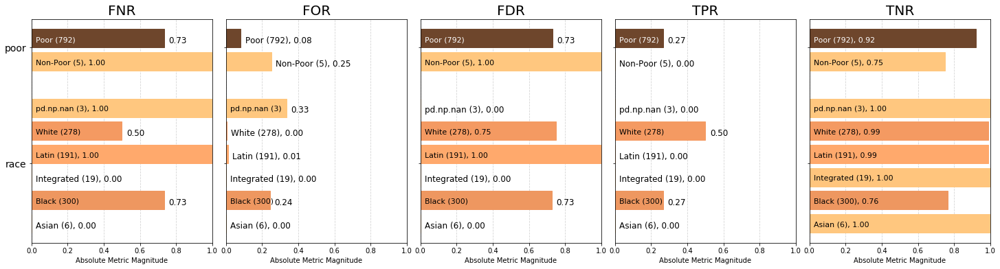

<Figure size 432x288 with 0 Axes>

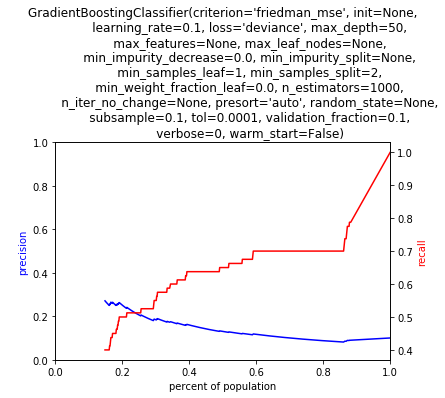

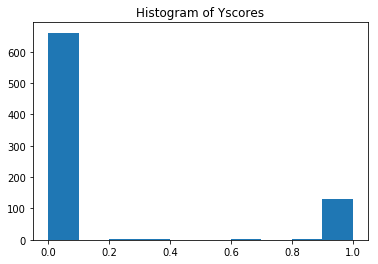

FEATURE IMPORTANCES

1. Feature total_department_bureau_ELECTRICAL_group_low (0.026609)
2. Feature total_department_bureau_ELECTRICAL_group_medium (0.022306)
3. Feature eviction_order_yes_tenant_rep_laa_mean_by_commarea_group_high (0.020210)
4. Feature eviction_filings_rate_group_medium (0.017360)
5. Feature default_eviction_order_yes_tenant_prose_mean_by_commarea_group_medium (0.013476)
6. Feature label_prev_year (0.012240)
7. Feature total_department_bureau_SPECIAL INSPECTION PROGRAM_mean_by_commarea_group_low (0.011362)
8. Feature default_eviction_order_yes_tenant_prose_mean_by_commarea_group_low (0.010375)
9. Feature eviction_filings_rate_group_low (0.010354)
10. Feature population_race_other_mean_by_commarea_group_high (0.009488)
            score  label_value
race                          
Asian           0          0.0
Black          60         75.0
Integrated      0          0.0
Latin          14          2.0
White           5          2.0
model_id, score_thresholds 1 {'rank_ab

<Figure size 432x288 with 0 Axes>

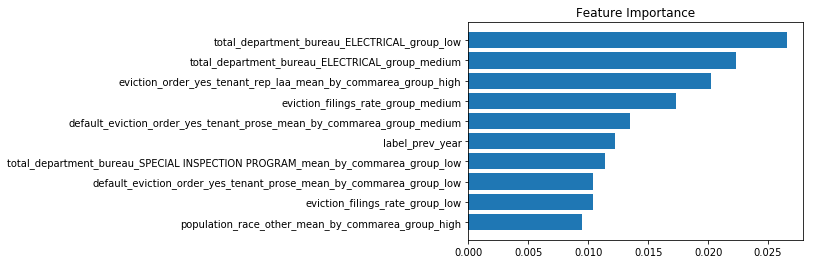

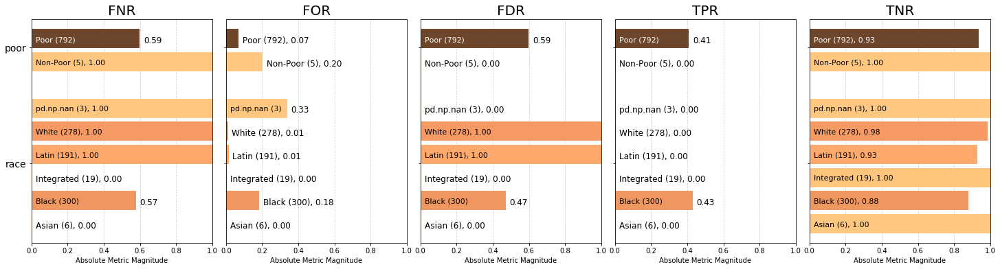

<Figure size 432x288 with 0 Axes>

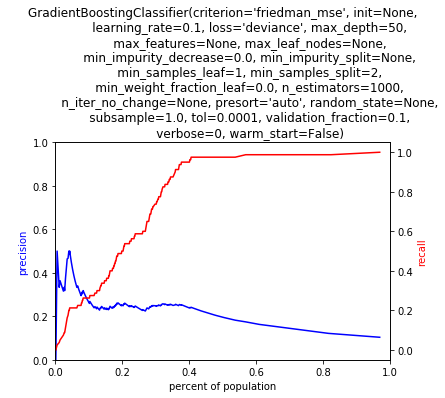

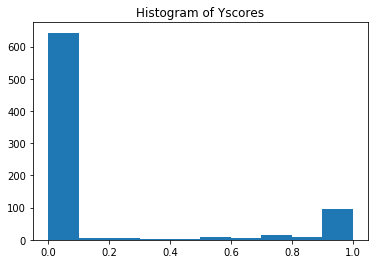

FEATURE IMPORTANCES

1. Feature label_prev_year (0.257790)
2. Feature population_race_black_group_high (0.038191)
3. Feature some_college_group_medium (0.022460)
4. Feature some_college_group_high (0.018040)
5. Feature eviction_order_no_group_low (0.016449)
6. Feature high_school_grad_group_medium (0.013957)
7. Feature perc_increase_total_crime_class_Less serious offences_group_medium (0.013059)
8. Feature total_inspection_category_COMPLAINT_perc_group_medium (0.009564)
9. Feature total_crime_class_Less serious offences_group_medium (0.009481)
10. Feature total_department_bureau_SPECIAL TASK FORCE_mean_by_commarea_group_high (0.008928)
            score  label_value
race                          
Asian           0          0.0
Black          73         75.0
Integrated      0          0.0
Latin           2          2.0
White           4          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

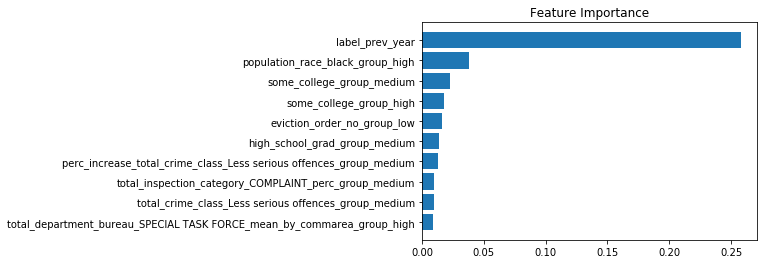

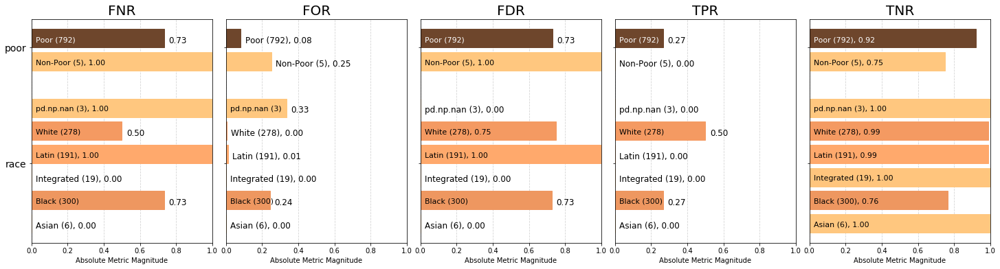

<Figure size 432x288 with 0 Axes>

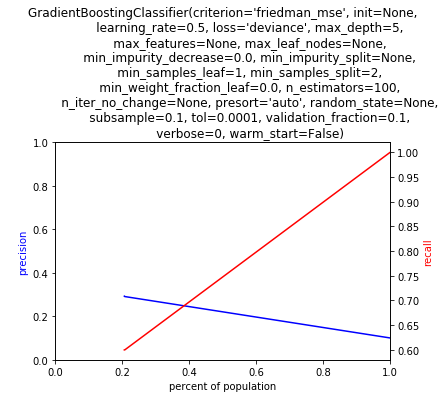

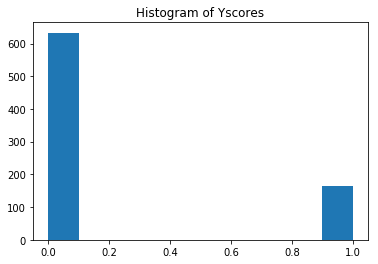

FEATURE IMPORTANCES

1. Feature label_prev_year (0.141971)
2. Feature total_inspection_category_COMPLAINT_mean_by_commarea_group_high (0.060646)
3. Feature total_building_violations_mean_by_commarea_group_high (0.039795)
4. Feature total_violation_status_COMPLIED_mean_by_commarea_group_high (0.020621)
5. Feature case_type_single_action_mean_by_commarea_group_low (0.013844)
6. Feature population_poverty_above_group_low (0.011752)
7. Feature eviction_filings_rate_group_low (0.010949)
8. Feature total_primary_type_BATTERY_group_medium (0.009985)
9. Feature high_school_grad_group_high (0.008465)
10. Feature population_poverty_below_group_high (0.008354)
            score  label_value
race                          
Asian           0          0.0
Black          64         75.0
Integrated      0          0.0
Latin          11          2.0
White           4          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

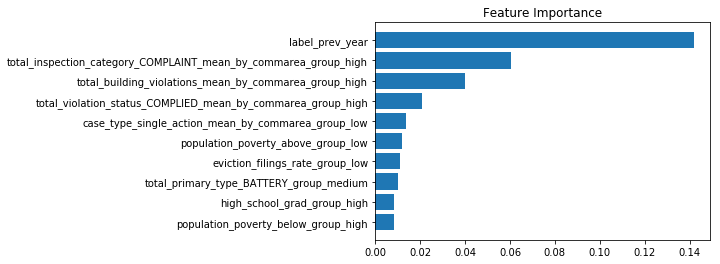

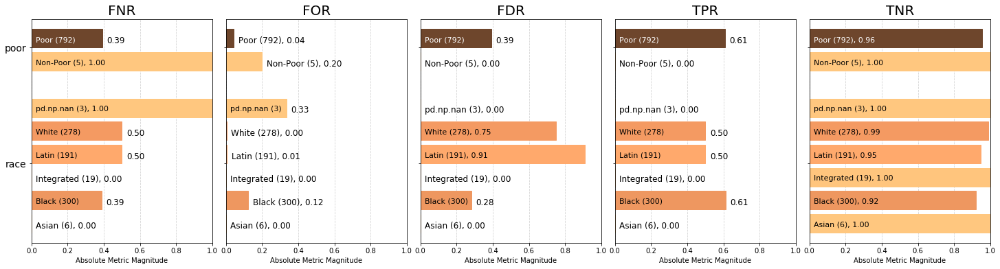

<Figure size 432x288 with 0 Axes>

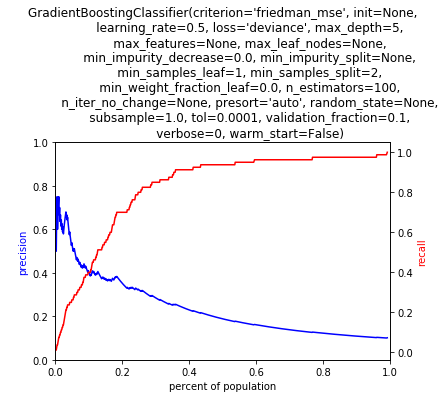

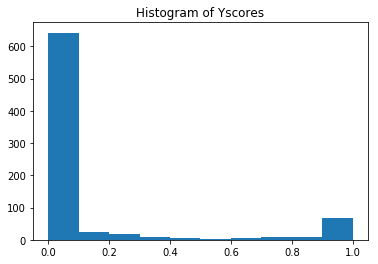

FEATURE IMPORTANCES

1. Feature label_prev_year (0.263401)
2. Feature population_race_black_group_high (0.050421)
3. Feature median_rent_group_high (0.019528)
4. Feature eviction_order_no_group_low (0.016735)
5. Feature total_department_bureau_SPECIAL TASK FORCE_mean_by_commarea_group_high (0.015797)
6. Feature total_crime_class_Less serious offences_group_medium (0.010988)
7. Feature perc_increase_total_crime_class_Less serious offences_group_medium (0.010638)
8. Feature eviction_filings_rate_group_low (0.009869)
9. Feature some_college_group_high (0.009506)
10. Feature perc_total_crime_class_Less serious offences_group_medium (0.008891)
            score  label_value
race                          
Asian           0          0.0
Black          69         75.0
Integrated      0          0.0
Latin           6          2.0
White           3          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

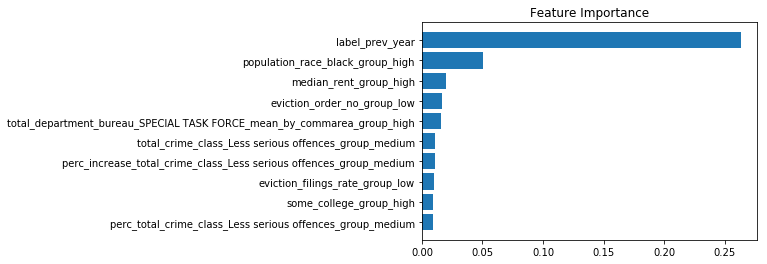

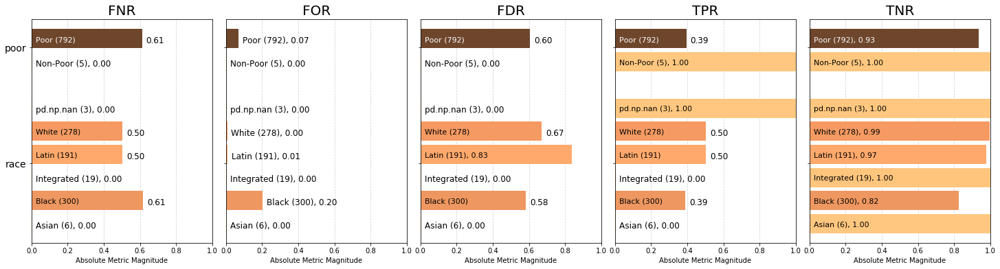

<Figure size 432x288 with 0 Axes>

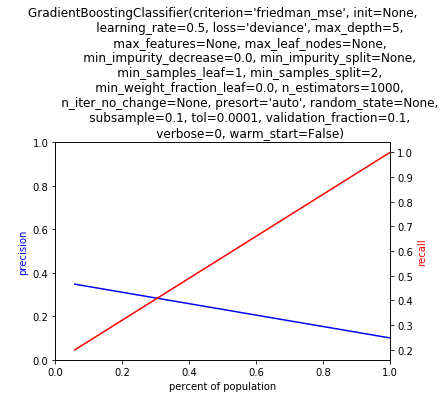

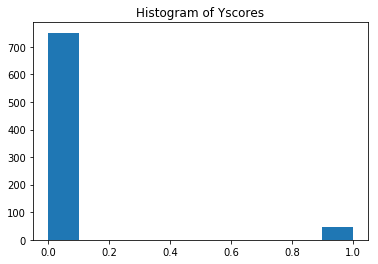

FEATURE IMPORTANCES

1. Feature label_prev_year (0.146709)
2. Feature total_primary_type_ROBBERY_mean_by_commarea_group_low (0.018982)
3. Feature population_race_black_group_high (0.017419)
4. Feature landlord_represented_mean_by_commarea_group_medium (0.013539)
5. Feature eviction_filings_rate_group_low (0.011913)
6. Feature eviction_order_yes_tenant_prose_mean_by_commarea_group_medium (0.011840)
7. Feature total_arrest_1_mean_by_commarea_group_medium (0.009325)
8. Feature total_arrest_1_mean_by_commarea_group_high (0.009315)
9. Feature back_rent_2500_to_4999_mean_by_commarea_group_medium (0.008633)
10. Feature case_type_joint_action_mean_by_commarea_group_medium (0.008249)
            score  label_value
race                          
Asian           0          0.0
Black          72         75.0
Integrated      1          0.0
Latin           0          2.0
White           5          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

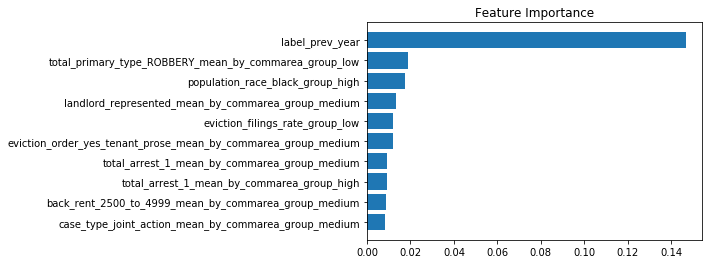

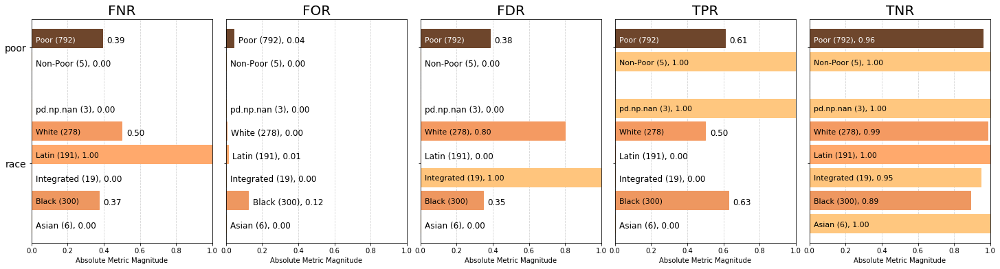

<Figure size 432x288 with 0 Axes>

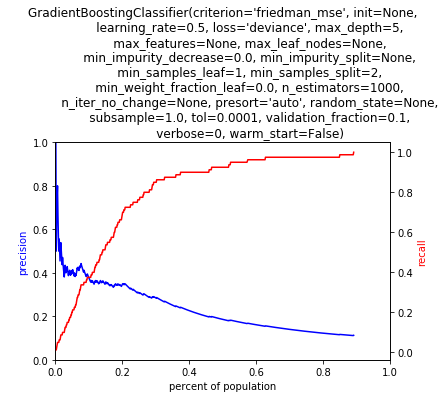

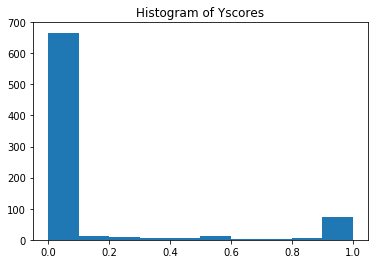

FEATURE IMPORTANCES

1. Feature label_prev_year (0.265612)
2. Feature population_race_black_group_high (0.051625)
3. Feature eviction_order_no_group_low (0.015578)
4. Feature some_college_group_high (0.013741)
5. Feature total_crime_class_Less serious offences_group_medium (0.012177)
6. Feature total_department_bureau_SPECIAL TASK FORCE_mean_by_commarea_group_high (0.011448)
7. Feature eviction_filings_rate_group_low (0.010598)
8. Feature high_school_grad_group_high (0.009934)
9. Feature total_primary_type_NARCOTICS_mean_by_commarea_group_medium (0.009067)
10. Feature some_college_group_medium (0.009020)
            score  label_value
race                          
Asian           0          0.0
Black          74         75.0
Integrated      0          0.0
Latin           2          2.0
White           2          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

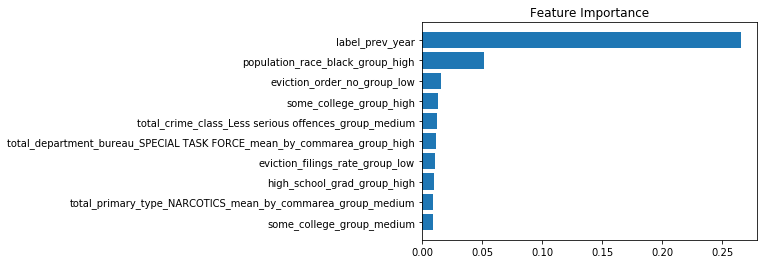

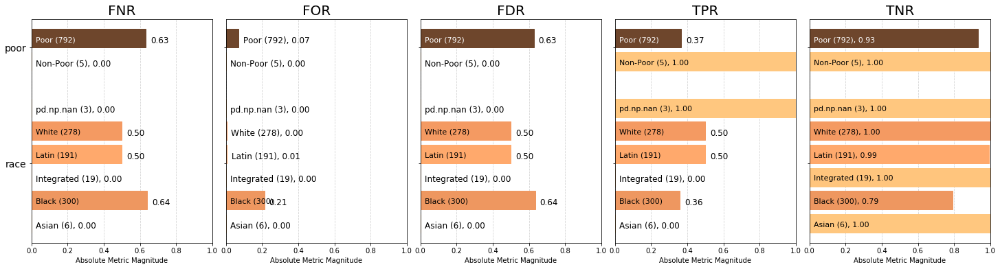

<Figure size 432x288 with 0 Axes>

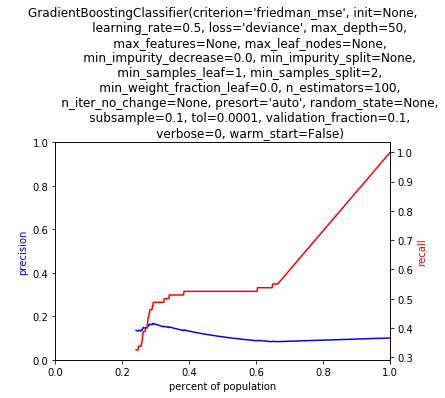

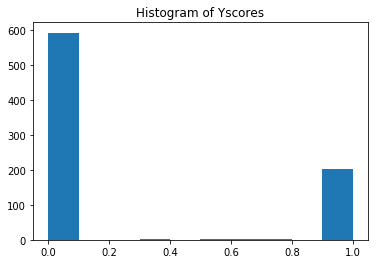

FEATURE IMPORTANCES

1. Feature label_prev_year (0.021974)
2. Feature perc_increase_total_crime_class_Property Crime_group_low (0.010842)
3. Feature perc_increase_total_crime_class_Violent Crime_group_low (0.010028)
4. Feature median_rent_group_high (0.008907)
5. Feature high_school_grad_group_high (0.008636)
6. Feature commarea_group_medium (0.007752)
7. Feature perc_total_crime_class_Less serious offences_group_high (0.007740)
8. Feature some_college_group_medium (0.007711)
9. Feature ftu_eviction_order_tenant_represented_mean_by_commarea_group_low (0.007299)
10. Feature perc_increase_total_crime_class_Violent Crime_group_medium (0.007266)
            score  label_value
race                          
Asian           0          0.0
Black          28         75.0
Integrated      3          0.0
Latin           1          2.0
White          46          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

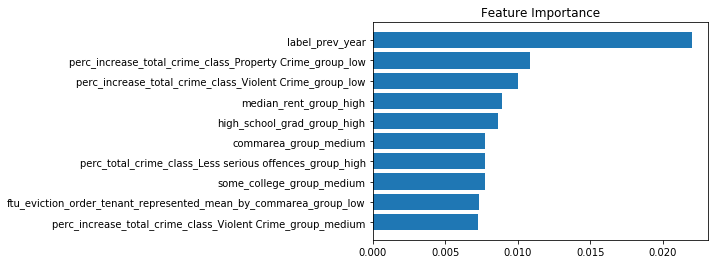

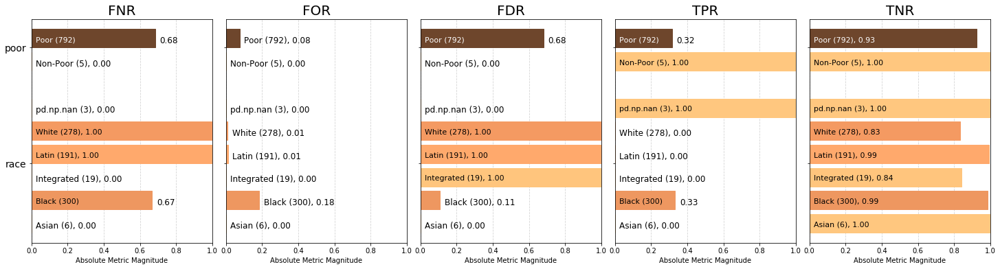

<Figure size 432x288 with 0 Axes>

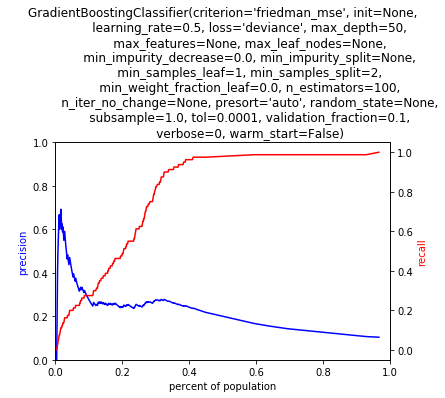

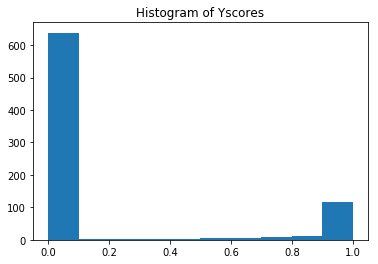

FEATURE IMPORTANCES

1. Feature label_prev_year (0.257789)
2. Feature population_race_black_group_high (0.038165)
3. Feature some_college_group_medium (0.026572)
4. Feature perc_increase_total_crime_class_Less serious offences_group_medium (0.018222)
5. Feature eviction_order_no_group_low (0.016396)
6. Feature high_school_grad_group_medium (0.015820)
7. Feature some_college_group_high (0.011991)
8. Feature total_primary_type_CRIMINAL DAMAGE_group_medium (0.011740)
9. Feature total_inspection_category_COMPLAINT_perc_group_medium (0.011026)
10. Feature perc_increase_total_crime_class_Violent Crime_group_low (0.010056)
            score  label_value
race                          
Asian           0          0.0
Black          73         75.0
Integrated      0          0.0
Latin           3          2.0
White           3          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

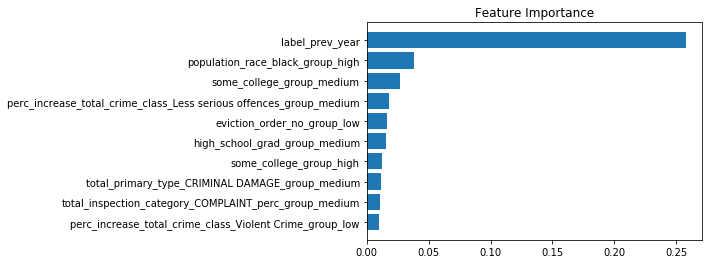

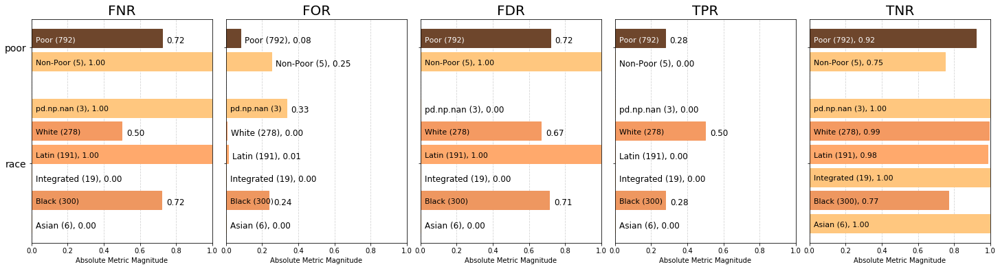

<Figure size 432x288 with 0 Axes>

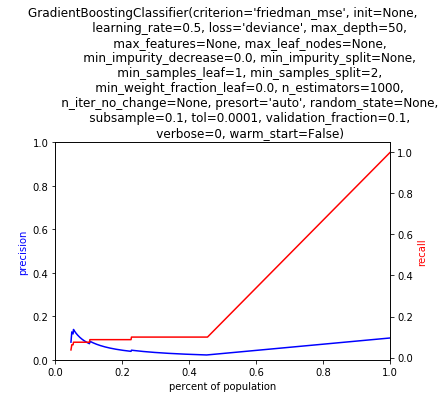

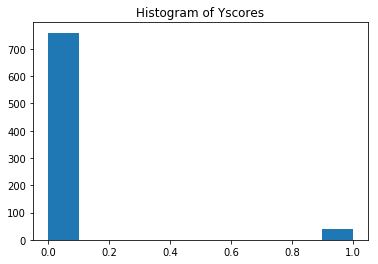

FEATURE IMPORTANCES

1. Feature label_prev_year (0.072073)
2. Feature some_college_group_high (0.008296)
3. Feature total_department_bureau_REFRIGERATION_group_high (0.008092)
4. Feature back_rent_median_group_high (0.007261)
5. Feature total_department_bureau_SPECIAL INSPECTION PROGRAM_group_low (0.006773)
6. Feature some_college_group_medium (0.006560)
7. Feature high_school_grad_group_high (0.006471)
8. Feature total_primary_type_HUMAN TRAFFICKING_mean_by_commarea (0.006296)
9. Feature not_highschool_grad_mean_by_commarea_group_high (0.006201)
10. Feature total_inspection_category_REGISTRATION_mean_by_commarea_group_medium (0.006037)
            score  label_value
race                          
Asian           1          0.0
Black          29         75.0
Integrated      1          0.0
Latin          16          2.0
White          32          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

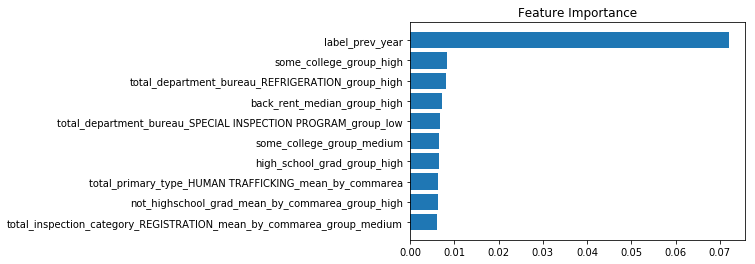

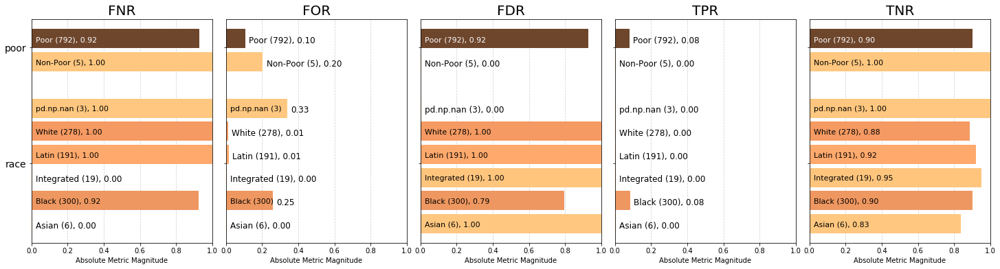

<Figure size 432x288 with 0 Axes>

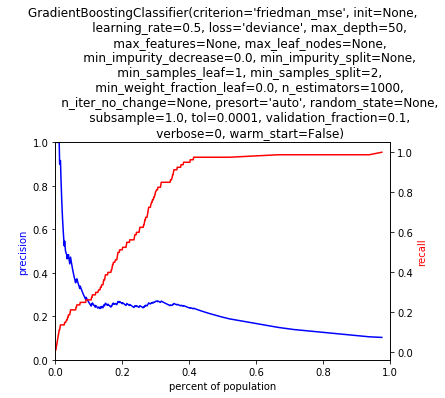

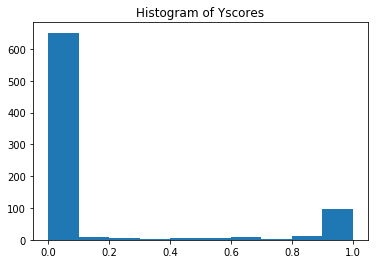

FEATURE IMPORTANCES

1. Feature label_prev_year (0.257790)
2. Feature population_race_black_group_high (0.038165)
3. Feature some_college_group_medium (0.023752)
4. Feature perc_increase_total_crime_class_Less serious offences_group_medium (0.020616)
5. Feature some_college_group_high (0.017650)
6. Feature eviction_order_no_group_low (0.016396)
7. Feature perc_increase_total_crime_group_medium (0.012033)
8. Feature total_violation_status_COMPLIED_perc_group_low (0.011212)
9. Feature high_school_grad_group_medium (0.011145)
10. Feature total_primary_type_WEAPONS VIOLATION_mean_by_commarea_group_medium (0.010438)
            score  label_value
race                          
Asian           0          0.0
Black          71         75.0
Integrated      0          0.0
Latin           3          2.0
White           5          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

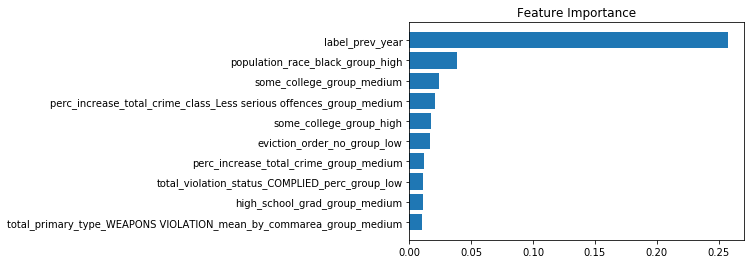

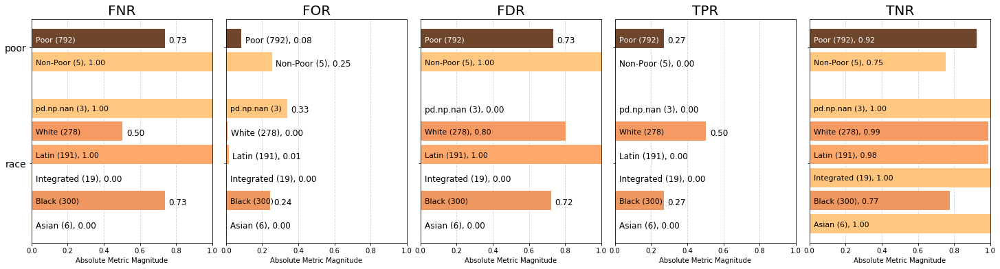

GB


<Figure size 432x288 with 0 Axes>

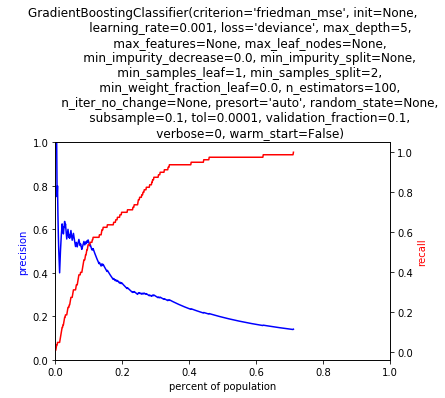

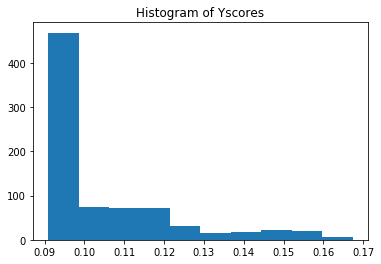

FEATURE IMPORTANCES

1. Feature label_prev_year (0.304773)
2. Feature population_race_black_group_high (0.020769)
3. Feature total_primary_type_HUMAN TRAFFICKING_mean_by_commarea (0.010088)
4. Feature eviction_filings_rate_mean_by_commarea_group_medium (0.008128)
5. Feature total_primary_type_INTERFERENCE WITH PUBLIC OFFICER_mean_by_commarea_group_medium (0.007842)
6. Feature median_rent_group_medium (0.006311)
7. Feature some_college_group_medium (0.006033)
8. Feature total_primary_type_INTERFERENCE WITH PUBLIC OFFICER_mean_by_commarea_group_low (0.005659)
9. Feature perc_increase_total_crime_class_Less serious offences_group_medium (0.005608)
10. Feature perc_total_crime_class_Less serious offences_group_high (0.005498)
            score  label_value
race                          
Asian           0          0.0
Black          74         74.0
Integrated      0          0.0
Latin           2          4.0
White           2          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

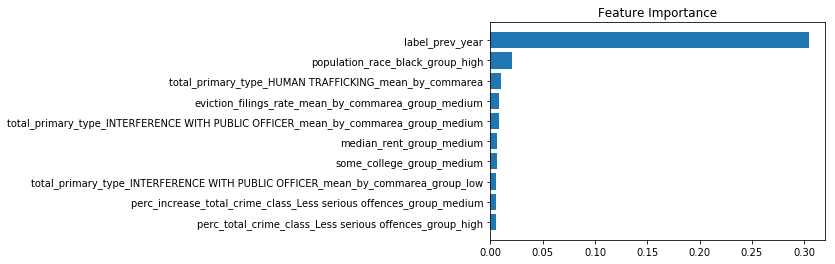

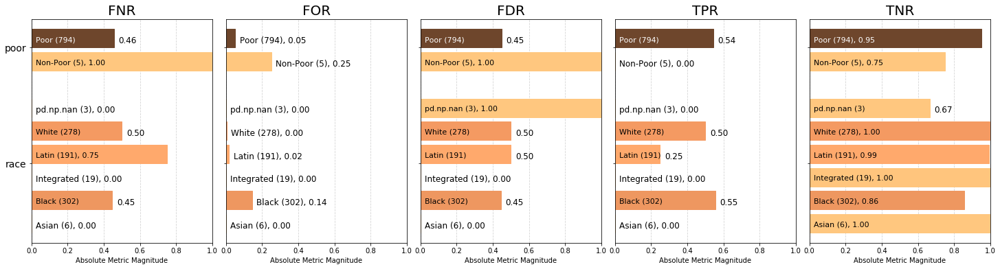

<Figure size 432x288 with 0 Axes>

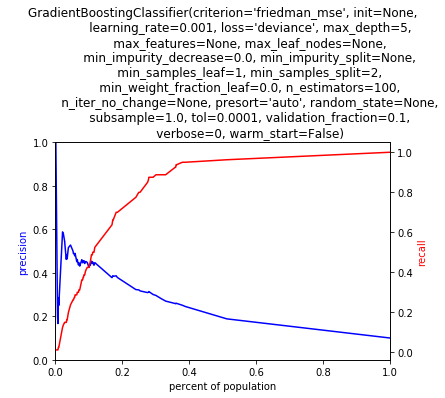

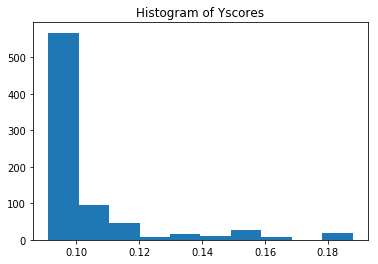

FEATURE IMPORTANCES

1. Feature label_prev_year (0.624126)
2. Feature population_race_black_group_high (0.113547)
3. Feature eviction_order_no_group_low (0.035208)
4. Feature total_department_bureau_SPECIAL TASK FORCE_mean_by_commarea_group_medium (0.022304)
5. Feature total_primary_type_GAMBLING_mean_by_commarea_group_high (0.015572)
6. Feature eviction_filings_rate_group_low (0.010324)
7. Feature total_arrest_0_mean_by_commarea_group_medium (0.009383)
8. Feature total_primary_type_BURGLARY_group_medium (0.009003)
9. Feature total_primary_type_BURGLARY_group_low (0.008039)
10. Feature total_department_bureau_DEMOLITION_group_medium (0.007785)
            score  label_value
race                          
Asian           0          0.0
Black          72         74.0
Integrated      0          0.0
Latin           4          4.0
White           2          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

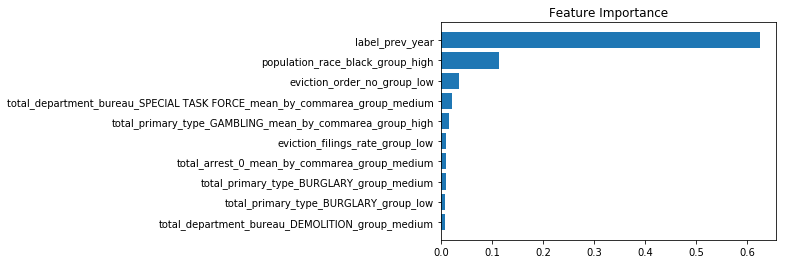

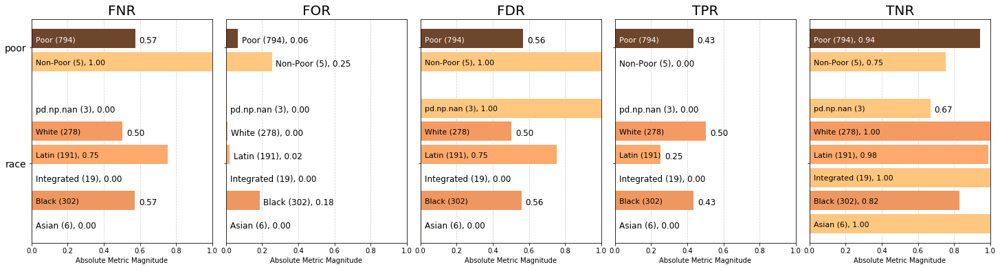

<Figure size 432x288 with 0 Axes>

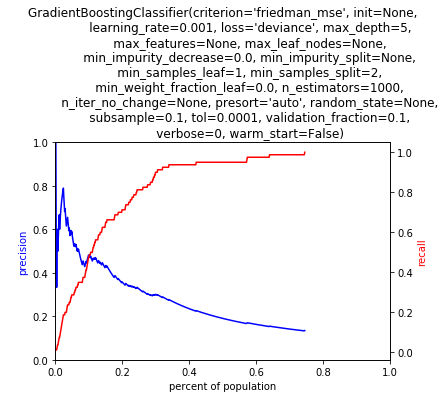

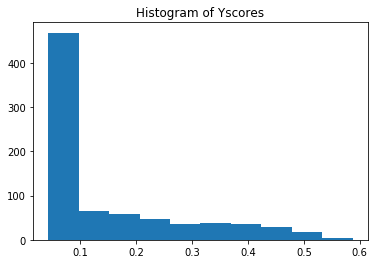

FEATURE IMPORTANCES

1. Feature label_prev_year (0.209937)
2. Feature population_race_black_group_high (0.015450)
3. Feature eviction_filings_rate_group_low (0.013831)
4. Feature total_primary_type_HUMAN TRAFFICKING_mean_by_commarea (0.010360)
5. Feature population_race_black_mean_by_commarea_group_high (0.009566)
6. Feature perc_total_crime_class_Property Crime_group_low (0.006365)
7. Feature total_department_bureau_SPECIAL TASK FORCE_mean_by_commarea_group_medium (0.006267)
8. Feature some_college_group_high (0.006216)
9. Feature high_school_grad_group_high (0.006023)
10. Feature some_college_group_medium (0.005883)
            score  label_value
race                          
Asian           0          0.0
Black          75         74.0
Integrated      0          0.0
Latin           2          4.0
White           2          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

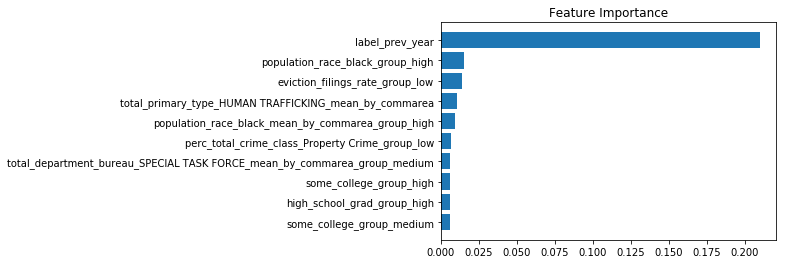

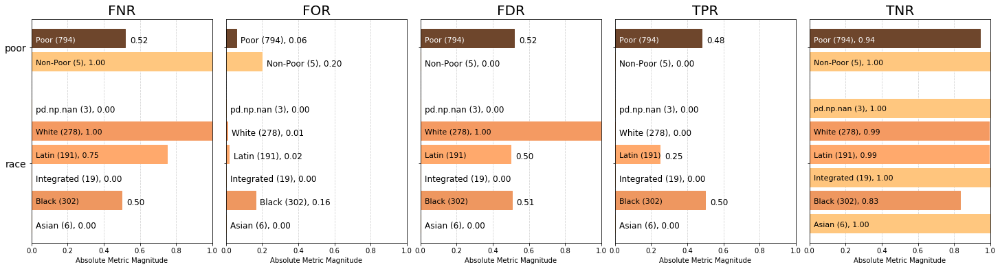

<Figure size 432x288 with 0 Axes>

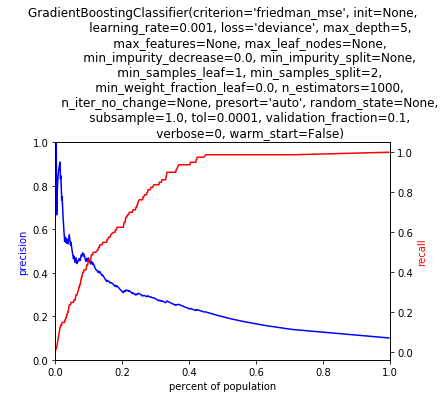

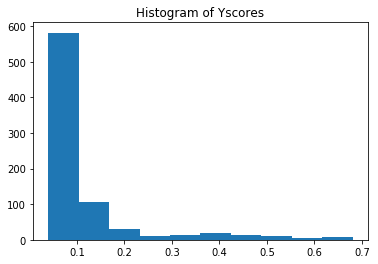

FEATURE IMPORTANCES

1. Feature label_prev_year (0.566456)
2. Feature population_race_black_group_high (0.069407)
3. Feature population_race_black_mean_by_commarea_group_high (0.021441)
4. Feature eviction_order_no_group_low (0.021358)
5. Feature eviction_filings_rate_mean_by_commarea_group_medium (0.018243)
6. Feature total_department_bureau_SPECIAL TASK FORCE_mean_by_commarea_group_medium (0.012888)
7. Feature total_primary_type_BATTERY_group_low (0.011872)
8. Feature eviction_filings_total_group_low (0.011556)
9. Feature total_primary_type_GAMBLING_mean_by_commarea_group_high (0.009898)
10. Feature eviction_filings_rate_group_low (0.009387)
            score  label_value
race                          
Asian           0          0.0
Black          74         74.0
Integrated      0          0.0
Latin           2          4.0
White           2          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

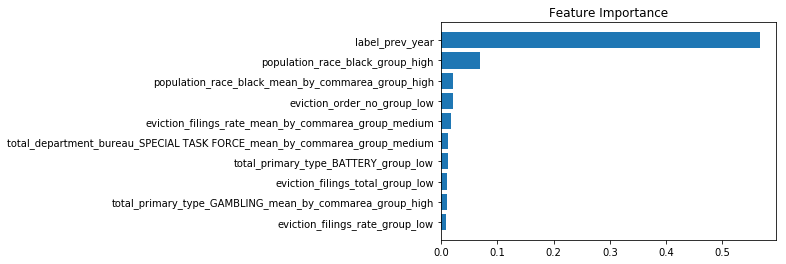

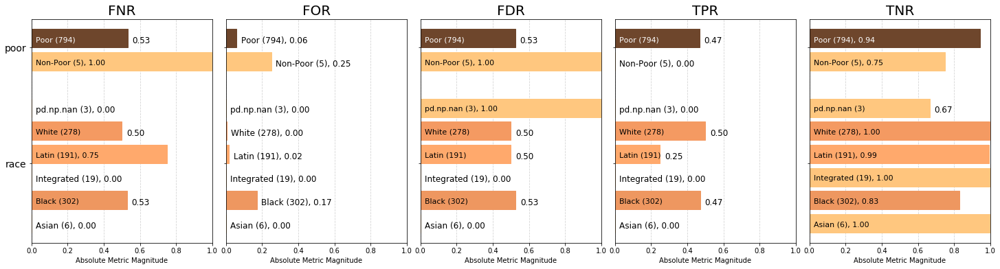

<Figure size 432x288 with 0 Axes>

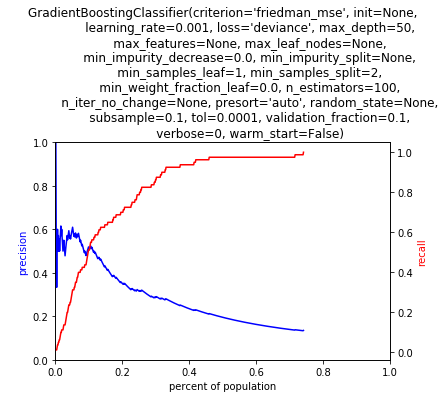

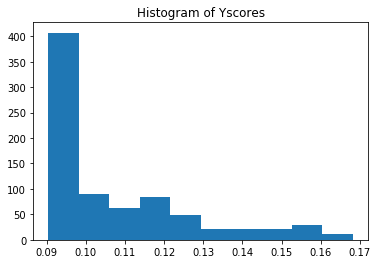

FEATURE IMPORTANCES

1. Feature label_prev_year (0.221759)
2. Feature population_race_black_group_high (0.017011)
3. Feature total_primary_type_HUMAN TRAFFICKING_mean_by_commarea (0.009439)
4. Feature some_college_group_medium (0.009396)
5. Feature eviction_filings_rate_group_low (0.008144)
6. Feature perc_increase_total_crime_class_Less serious offences_group_medium (0.007681)
7. Feature eviction_filings_rate_mean_by_commarea_group_medium (0.007494)
8. Feature some_college_group_high (0.006519)
9. Feature population_race_black_mean_by_commarea_group_high (0.006412)
10. Feature total_violation_status_COMPLIED_perc_group_medium (0.006280)
            score  label_value
race                          
Asian           0          0.0
Black          74         74.0
Integrated      0          0.0
Latin           2          4.0
White           2          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

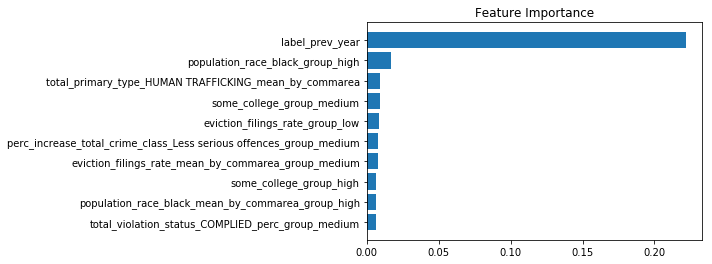

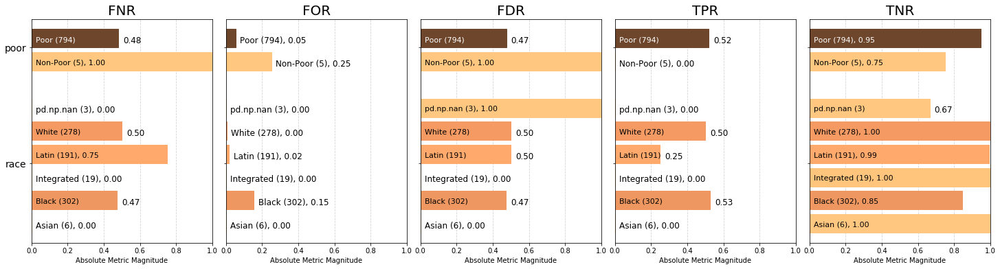

<Figure size 432x288 with 0 Axes>

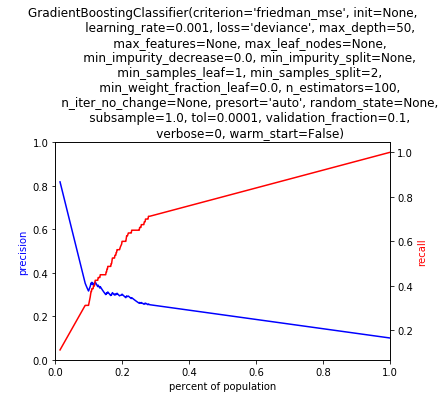

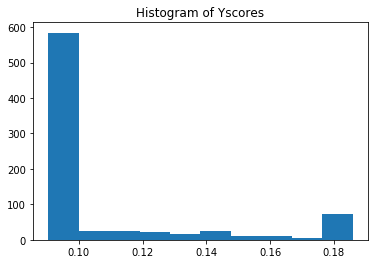

FEATURE IMPORTANCES

1. Feature label_prev_year (0.239557)
2. Feature population_race_black_group_high (0.043322)
3. Feature eviction_order_no_group_low (0.016467)
4. Feature some_college_group_medium (0.014219)
5. Feature perc_total_crime_class_Violent Crime_group_medium (0.011343)
6. Feature perc_total_crime_class_Violent Crime_group_low (0.010242)
7. Feature total_primary_type_CRIMINAL DAMAGE_group_low (0.009741)
8. Feature total_primary_type_ROBBERY_group_medium (0.009483)
9. Feature perc_total_crime_class_Less serious offences_group_high (0.009284)
10. Feature total_department_bureau_DEMOLITION_group_medium (0.009266)
            score  label_value
race                          
Asian           0          0.0
Black          65         74.0
Integrated      0          0.0
Latin           7          4.0
White           6          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

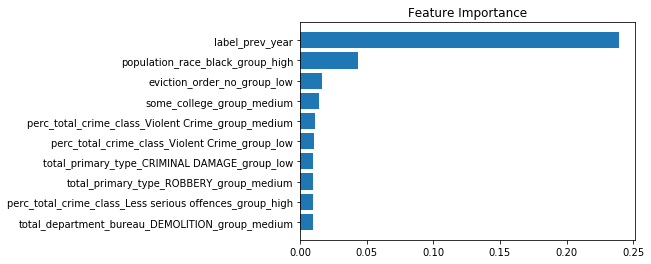

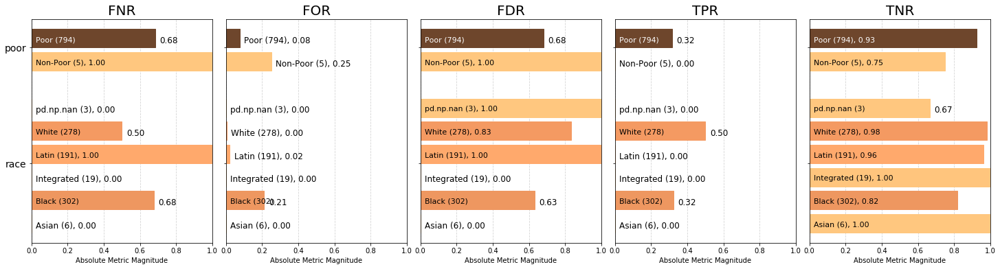

<Figure size 432x288 with 0 Axes>

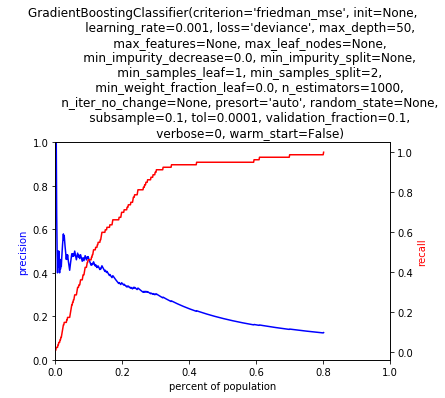

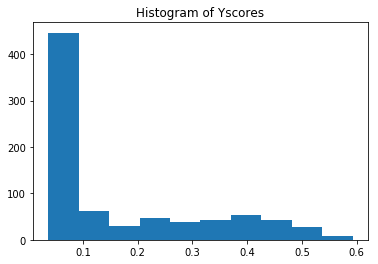

FEATURE IMPORTANCES

1. Feature label_prev_year (0.139152)
2. Feature population_race_black_group_high (0.012885)
3. Feature total_primary_type_HUMAN TRAFFICKING_mean_by_commarea (0.009745)
4. Feature some_college_group_high (0.008688)
5. Feature eviction_filings_rate_group_low (0.007997)
6. Feature high_school_grad_group_high (0.007930)
7. Feature some_college_group_medium (0.007773)
8. Feature high_school_grad_group_medium (0.006437)
9. Feature perc_total_crime_class_Property Crime_group_low (0.006056)
10. Feature population_race_black_mean_by_commarea_group_high (0.005533)
            score  label_value
race                          
Asian           0          0.0
Black          78         74.0
Integrated      0          0.0
Latin           0          4.0
White           1          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

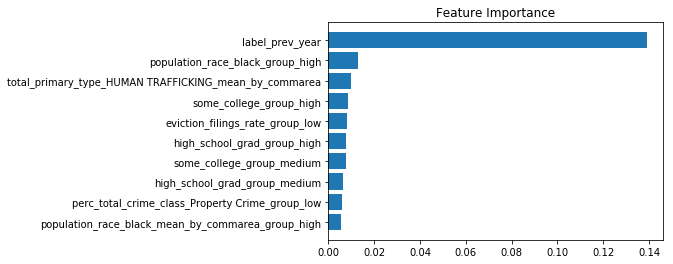

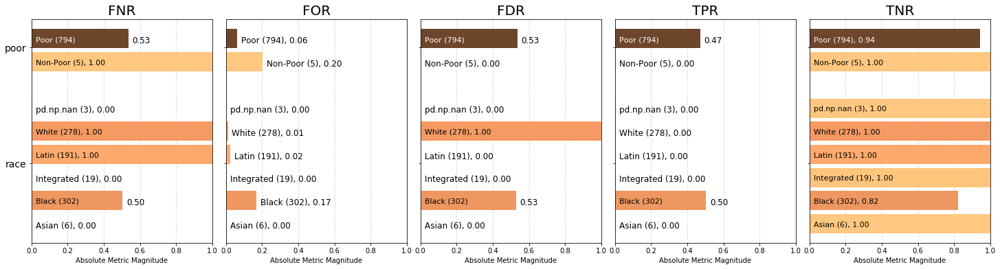

<Figure size 432x288 with 0 Axes>

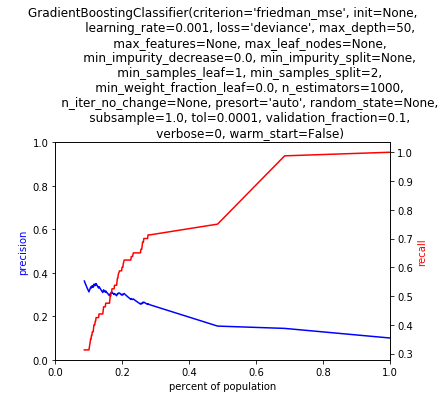

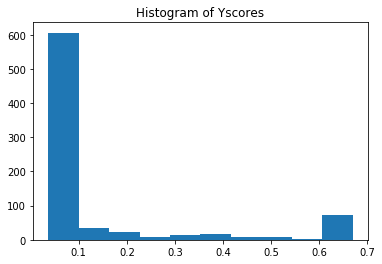

FEATURE IMPORTANCES

1. Feature label_prev_year (0.239557)
2. Feature population_race_black_group_high (0.043329)
3. Feature eviction_order_no_group_low (0.016467)
4. Feature some_college_group_medium (0.014293)
5. Feature perc_total_crime_class_Violent Crime_group_medium (0.011088)
6. Feature perc_total_crime_class_Violent Crime_group_low (0.010837)
7. Feature total_primary_type_ROBBERY_group_medium (0.009551)
8. Feature total_primary_type_CRIMINAL DAMAGE_group_low (0.009486)
9. Feature total_department_bureau_DEMOLITION_group_medium (0.009361)
10. Feature perc_total_crime_class_Less serious offences_group_high (0.009247)
            score  label_value
race                          
Asian           0          0.0
Black          65         74.0
Integrated      0          0.0
Latin           8          4.0
White           5          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

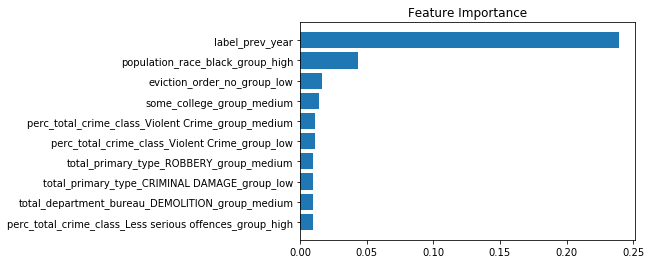

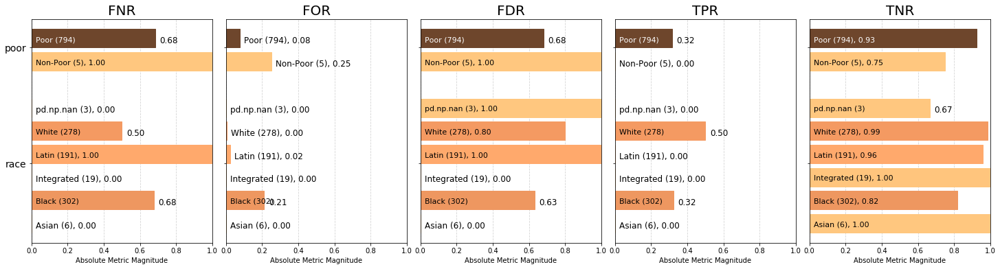

<Figure size 432x288 with 0 Axes>

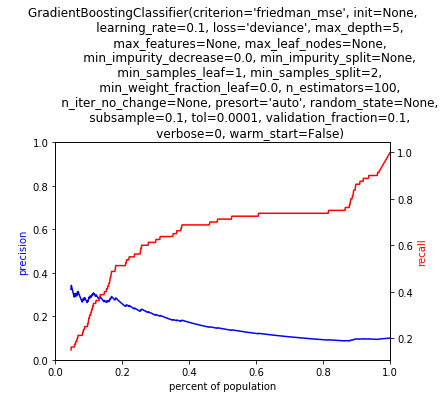

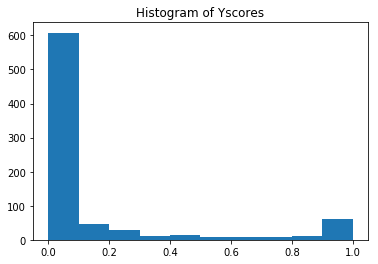

FEATURE IMPORTANCES

1. Feature label_prev_year (0.054822)
2. Feature total_department_bureau_ELECTRICAL_group_low (0.036283)
3. Feature total_department_bureau_ELECTRICAL_group_medium (0.033028)
4. Feature total_department_bureau_SIGNS_group_low (0.030358)
5. Feature total_primary_type_GAMBLING_mean_by_commarea_group_high (0.013471)
6. Feature total_primary_type_NARCOTICS_mean_by_commarea_group_high (0.011771)
7. Feature not_highschool_grad_mean_by_commarea_group_high (0.010564)
8. Feature total_primary_type_HUMAN TRAFFICKING_mean_by_commarea (0.009686)
9. Feature eviction_filings_rate_group_low (0.009596)
10. Feature total_primary_type_BATTERY_mean_by_commarea_group_medium (0.009441)
            score  label_value
race                          
Asian           1          0.0
Black          67         74.0
Integrated      1          0.0
Latin           4          4.0
White           6          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

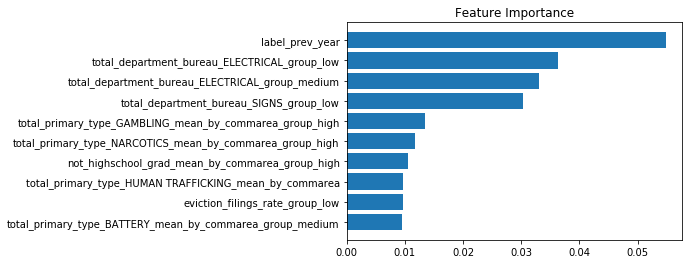

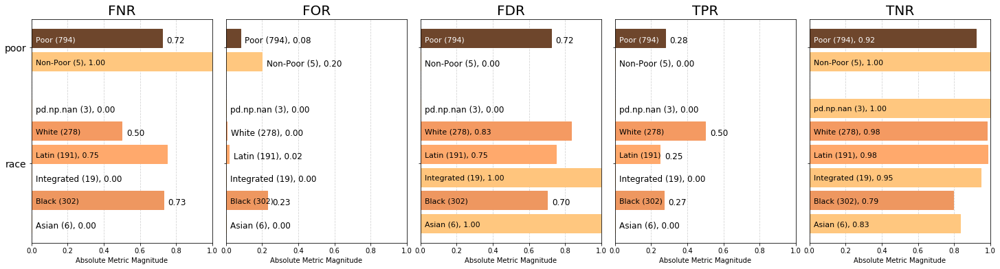

<Figure size 432x288 with 0 Axes>

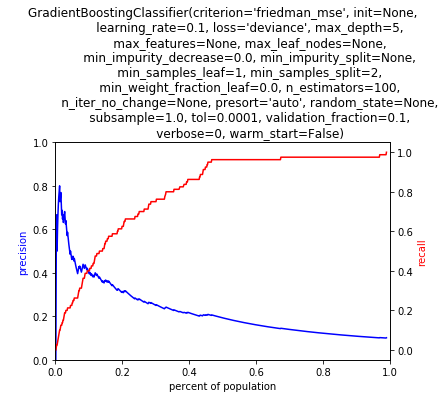

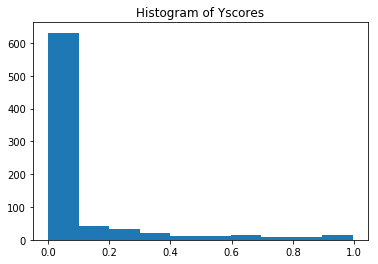

FEATURE IMPORTANCES

1. Feature label_prev_year (0.352423)
2. Feature population_race_black_group_high (0.044227)
3. Feature eviction_filings_rate_mean_by_commarea_group_medium (0.014672)
4. Feature total_primary_type_PUBLIC PEACE VIOLATION_mean_by_commarea_group_medium (0.014109)
5. Feature population_race_black_mean_by_commarea_group_high (0.013817)
6. Feature eviction_filings_rate_group_low (0.011018)
7. Feature some_college_group_high (0.009225)
8. Feature total_department_bureau_SPECIAL TASK FORCE_mean_by_commarea_group_medium (0.008188)
9. Feature total_primary_type_INTERFERENCE WITH PUBLIC OFFICER_mean_by_commarea_group_low (0.007313)
10. Feature eviction_filings_total_group_low (0.007189)
            score  label_value
race                          
Asian           0          0.0
Black          72         74.0
Integrated      0          0.0
Latin           3          4.0
White           3          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

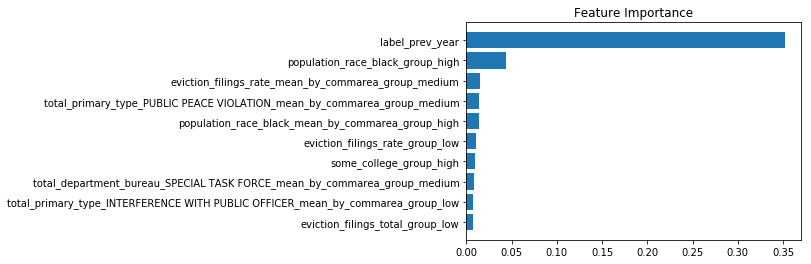

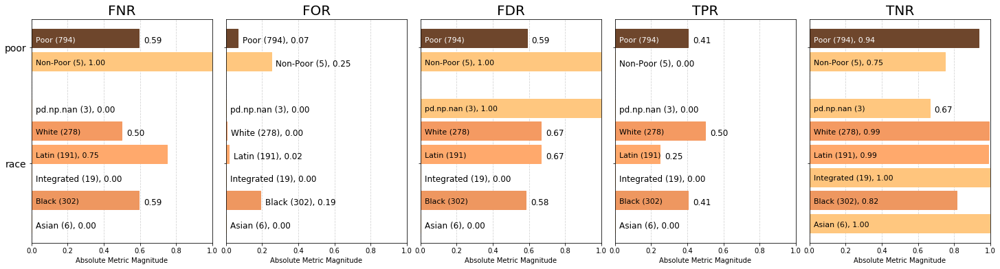

<Figure size 432x288 with 0 Axes>

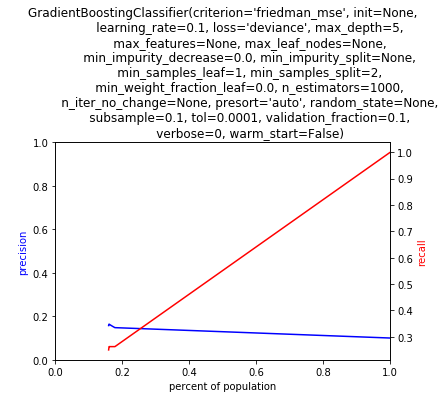

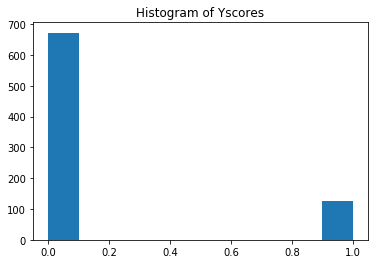

FEATURE IMPORTANCES

1. Feature label_prev_year (0.034814)
2. Feature total_primary_type_INTERFERENCE WITH PUBLIC OFFICER_mean_by_commarea_group_medium (0.033995)
3. Feature eviction_filings_rate_group_low (0.024389)
4. Feature total_violation_status_OPEN_perc_group_high (0.024072)
5. Feature eviction_filings_rate_group_medium (0.022453)
6. Feature population_race_black_mean_by_commarea_group_high (0.021640)
7. Feature total_primary_type_WEAPONS VIOLATION_mean_by_commarea_group_high (0.015736)
8. Feature total_violation_status_COMPLIED_perc_group_low (0.014974)
9. Feature perc_increase_total_crime_class_Less serious offences_group_high (0.011348)
10. Feature total_primary_type_CRIMINAL DAMAGE_group_high (0.010102)
            score  label_value
race                          
Asian           0          0.0
Black          65         74.0
Integrated      2          0.0
Latin           9          4.0
White           3          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

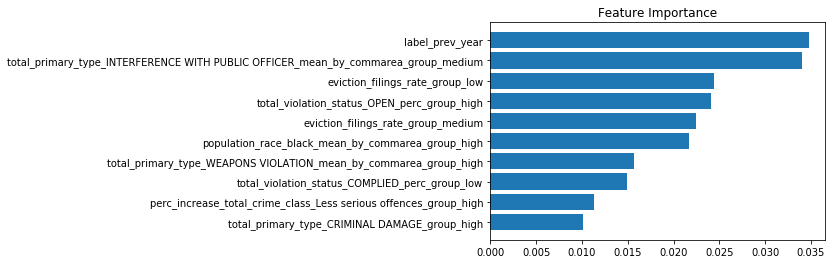

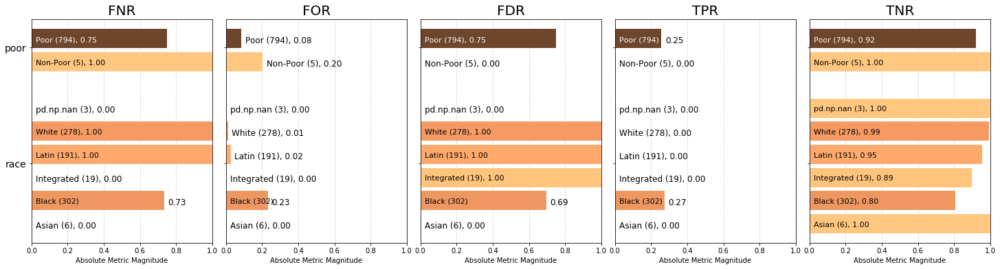

<Figure size 432x288 with 0 Axes>

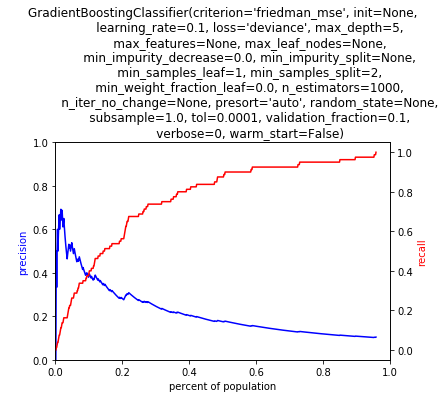

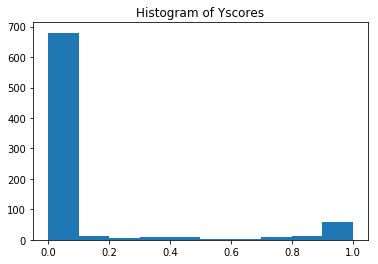

FEATURE IMPORTANCES

1. Feature label_prev_year (0.280873)
2. Feature population_race_black_group_high (0.034695)
3. Feature eviction_filings_rate_mean_by_commarea_group_medium (0.012615)
4. Feature population_race_black_mean_by_commarea_group_high (0.012397)
5. Feature total_primary_type_PUBLIC PEACE VIOLATION_mean_by_commarea_group_medium (0.011727)
6. Feature some_college_group_high (0.009185)
7. Feature eviction_filings_rate_group_low (0.008893)
8. Feature some_college_group_medium (0.008378)
9. Feature perc_increase_total_crime_class_Violent Crime_group_medium (0.008119)
10. Feature total_department_bureau_SPECIAL TASK FORCE_mean_by_commarea_group_medium (0.007479)
            score  label_value
race                          
Asian           0          0.0
Black          75         74.0
Integrated      0          0.0
Latin           3          4.0
White           1          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

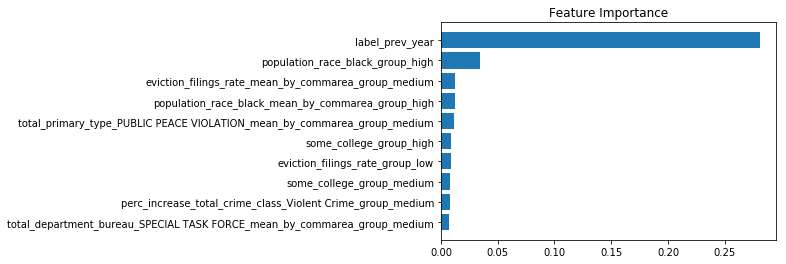

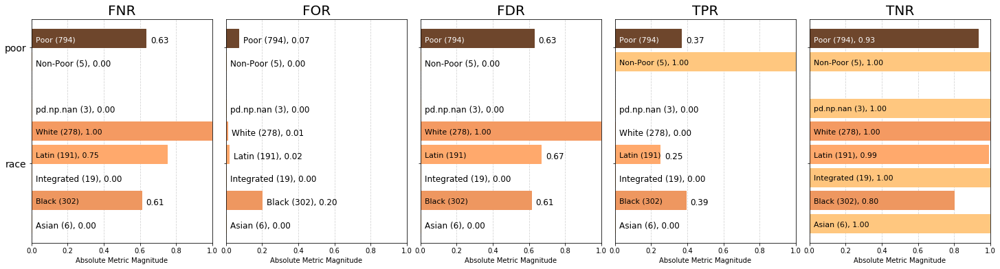

<Figure size 432x288 with 0 Axes>

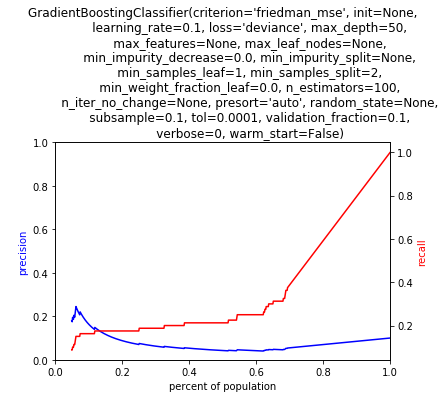

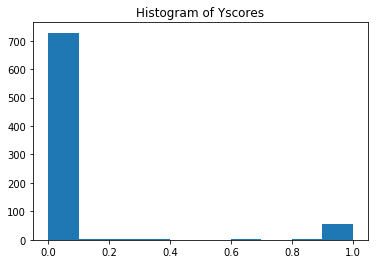

FEATURE IMPORTANCES

1. Feature label_prev_year (0.035196)
2. Feature total_department_bureau_DEMOLITION_mean_by_commarea_group_high (0.018156)
3. Feature total_primary_type_GAMBLING_mean_by_commarea_group_high (0.017811)
4. Feature perc_total_crime_class_Violent Crime_group_high (0.015738)
5. Feature median_rent_group_low (0.012476)
6. Feature some_college_group_high (0.010204)
7. Feature total_primary_type_PROSTITUTION_group_medium (0.008663)
8. Feature total_primary_type_HUMAN TRAFFICKING_mean_by_commarea (0.008460)
9. Feature some_college_group_medium (0.008188)
10. Feature total_primary_type_PROSTITUTION_mean_by_commarea_group_high (0.007947)
            score  label_value
race                          
Asian           0          0.0
Black          62         74.0
Integrated      0          0.0
Latin           8          4.0
White           8          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

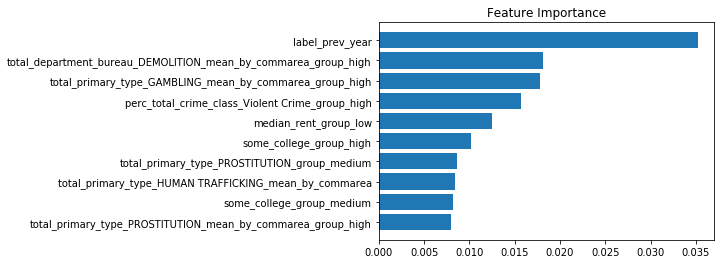

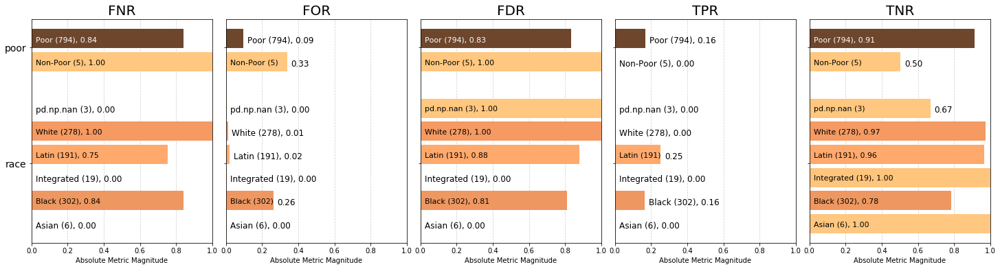

<Figure size 432x288 with 0 Axes>

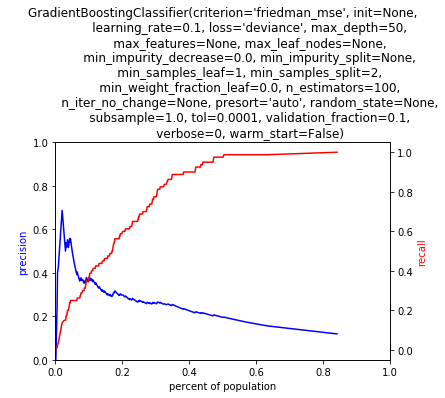

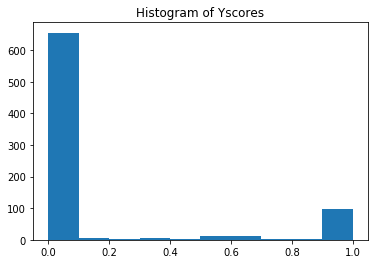

FEATURE IMPORTANCES

1. Feature label_prev_year (0.239556)
2. Feature population_race_black_group_high (0.043322)
3. Feature some_college_group_medium (0.016741)
4. Feature eviction_order_no_group_low (0.016467)
5. Feature perc_total_crime_class_Less serious offences_group_high (0.012598)
6. Feature perc_total_crime_class_Violent Crime_group_low (0.012192)
7. Feature perc_increase_total_crime_mean_by_commarea_group_medium (0.009860)
8. Feature total_primary_type_CRIMINAL DAMAGE_group_low (0.009781)
9. Feature perc_total_crime_class_Violent Crime_group_medium (0.009237)
10. Feature perc_total_crime_class_Property Crime_group_low (0.008902)
            score  label_value
race                          
Asian           0          0.0
Black          70         74.0
Integrated      0          0.0
Latin           4          4.0
White           4          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

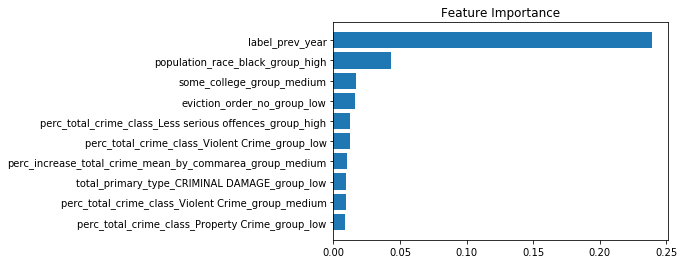

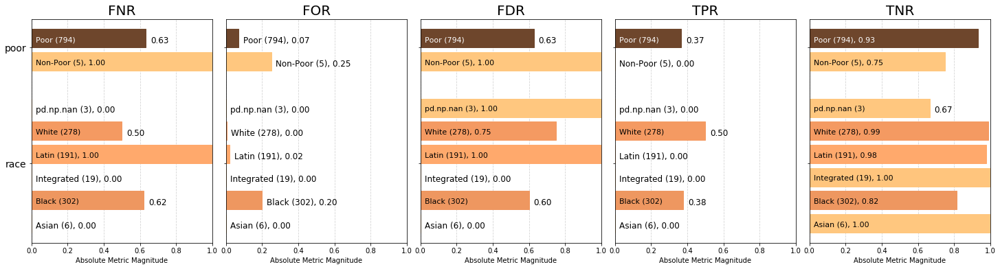

<Figure size 432x288 with 0 Axes>

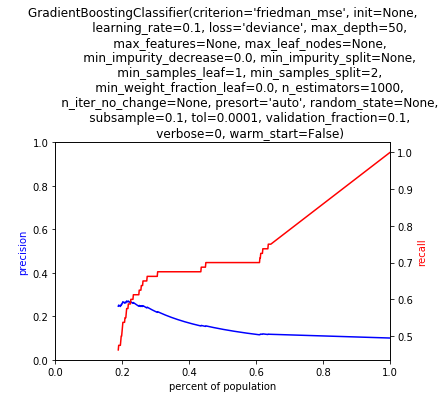

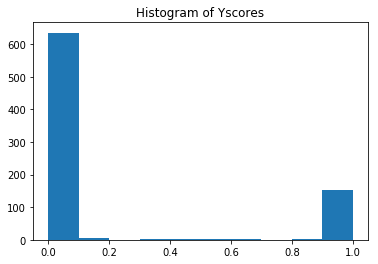

FEATURE IMPORTANCES

1. Feature total_primary_type_NON - CRIMINAL (0.017542)
2. Feature label_prev_year (0.016973)
3. Feature total_primary_type_HUMAN TRAFFICKING_mean_by_commarea (0.016780)
4. Feature perc_increase_total_crime_class_Violent Crime_group_high (0.014100)
5. Feature total_inspection_category_REGISTRATION_mean_by_commarea_group_low (0.013029)
6. Feature associate_group_low (0.011979)
7. Feature total_department_bureau_SPECIAL TASK FORCE_mean_by_commarea_group_medium (0.010779)
8. Feature total_inspection_category_REGISTRATION_mean_by_commarea_group_medium (0.008320)
9. Feature high_school_grad_group_high (0.007897)
10. Feature ftu_eviction_order_tenant_represented_mean_by_commarea_group_high (0.007669)
            score  label_value
race                          
Asian           0          0.0
Black          62         74.0
Integrated      1          0.0
Latin           5          4.0
White          11          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

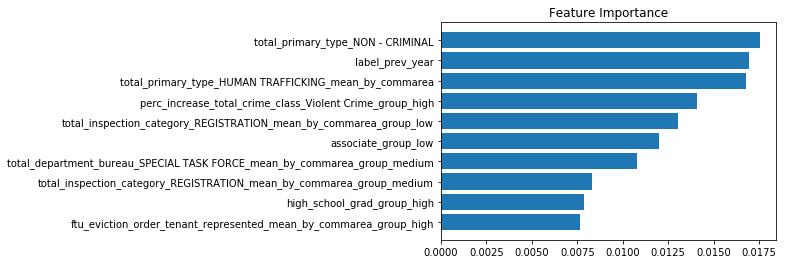

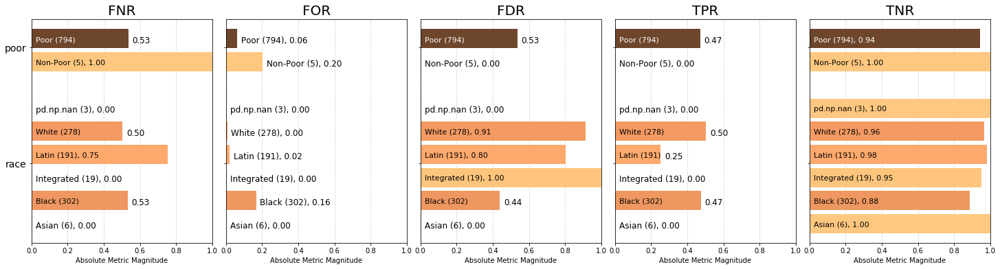

<Figure size 432x288 with 0 Axes>

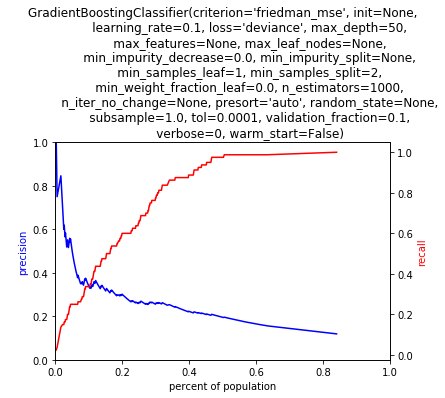

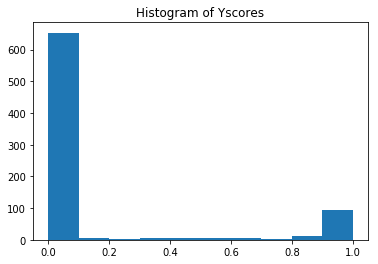

FEATURE IMPORTANCES

1. Feature label_prev_year (0.239556)
2. Feature population_race_black_group_high (0.043322)
3. Feature eviction_order_no_group_low (0.016467)
4. Feature some_college_group_medium (0.013548)
5. Feature perc_total_crime_class_Violent Crime_group_medium (0.012005)
6. Feature perc_total_crime_class_Less serious offences_group_high (0.011771)
7. Feature total_primary_type_ROBBERY_group_medium (0.010318)
8. Feature perc_total_crime_class_Violent Crime_group_low (0.010153)
9. Feature some_college_group_high (0.009771)
10. Feature total_department_bureau_DEMOLITION_group_medium (0.009645)
            score  label_value
race                          
Asian           0          0.0
Black          68         74.0
Integrated      0          0.0
Latin           6          4.0
White           4          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

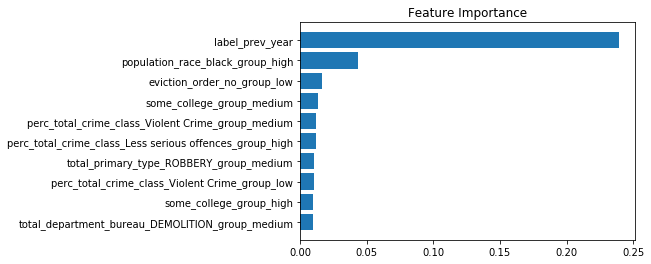

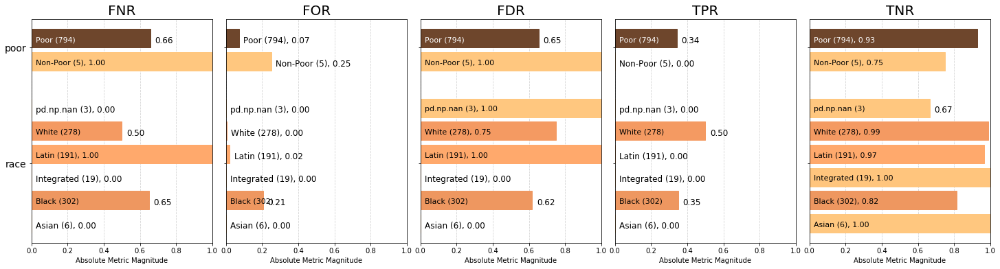

<Figure size 432x288 with 0 Axes>

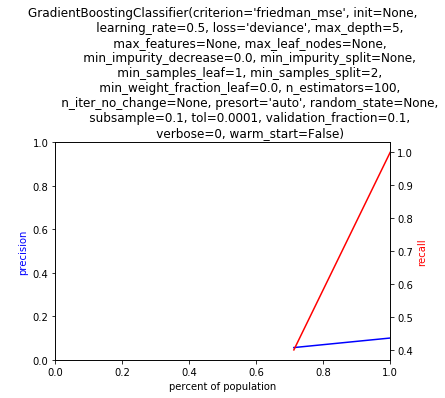

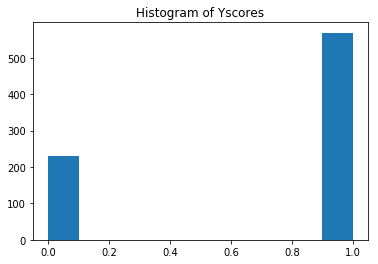

FEATURE IMPORTANCES

1. Feature total_primary_type_BATTERY_mean_by_commarea_group_low (0.154283)
2. Feature total_crime_class_Less serious offences_mean_by_commarea_group_low (0.132309)
3. Feature label_prev_year (0.128207)
4. Feature median_rent_group_low (0.087953)
5. Feature total_primary_type_SEX OFFENSE_mean_by_commarea_group_low (0.022892)
6. Feature total_primary_type_MOTOR VEHICLE THEFT_mean_by_commarea_group_high (0.019614)
7. Feature eviction_filings_rate_mean_by_commarea_group_low (0.017460)
8. Feature perc_increase_total_crime_mean_by_commarea_group_medium (0.015389)
9. Feature eviction_order_yes_tenant_rep_laa_mean_by_commarea_group_low (0.014694)
10. Feature population_race_black_mean_by_commarea_group_low (0.009910)
            score  label_value
race                          
Asian           0          0.0
Black          32         74.0
Integrated      8          0.0
Latin           3          4.0
White          36          2.0
model_id, score_thresholds 1 {'rank_abs': 

<Figure size 432x288 with 0 Axes>

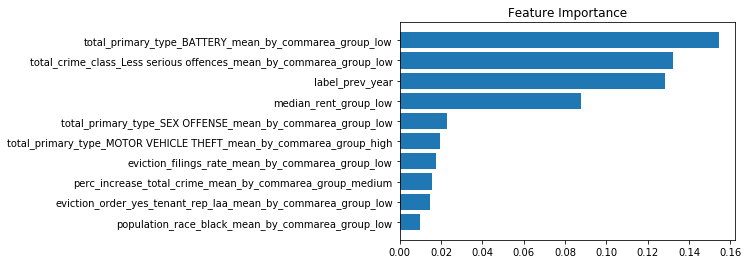

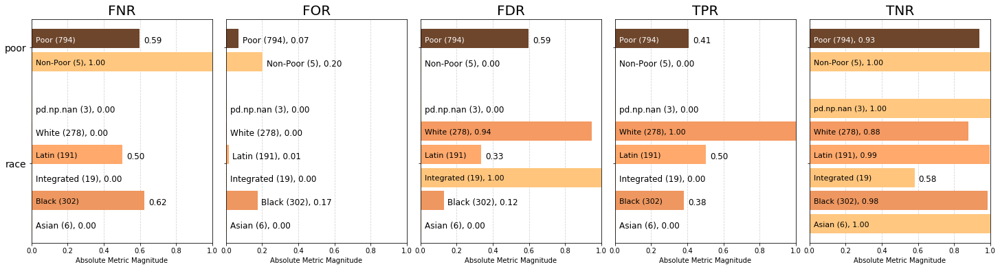

<Figure size 432x288 with 0 Axes>

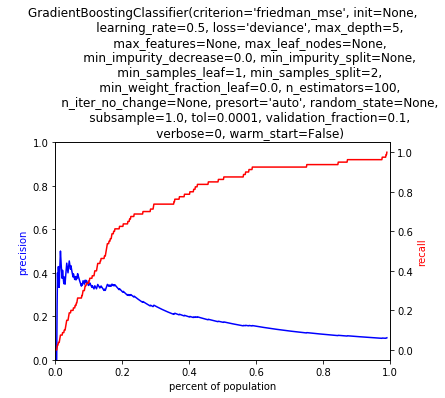

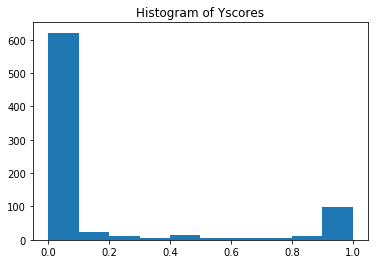

FEATURE IMPORTANCES

1. Feature label_prev_year (0.247397)
2. Feature population_race_black_group_high (0.042642)
3. Feature eviction_order_no_group_low (0.016601)
4. Feature perc_increase_total_crime_class_Violent Crime_group_medium (0.012583)
5. Feature total_department_bureau_SPECIAL TASK FORCE_mean_by_commarea_group_medium (0.012204)
6. Feature population_race_black_mean_by_commarea_group_high (0.012109)
7. Feature not_highschool_grad_group_medium (0.011195)
8. Feature some_college_group_medium (0.010443)
9. Feature eviction_filings_rate_group_low (0.008761)
10. Feature total_primary_type_GAMBLING_mean_by_commarea_group_high (0.008733)
            score  label_value
race                          
Asian           0          0.0
Black          67         74.0
Integrated      0          0.0
Latin          10          4.0
White           2          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

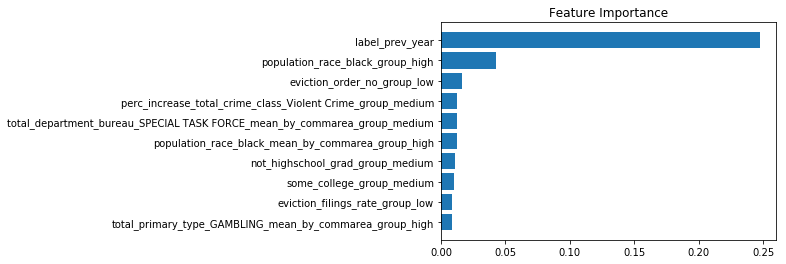

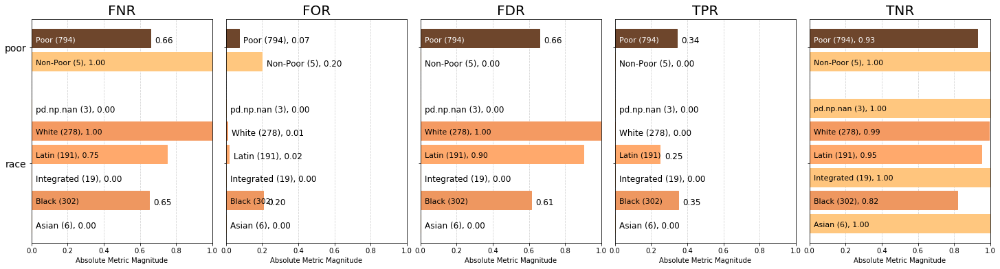

<Figure size 432x288 with 0 Axes>

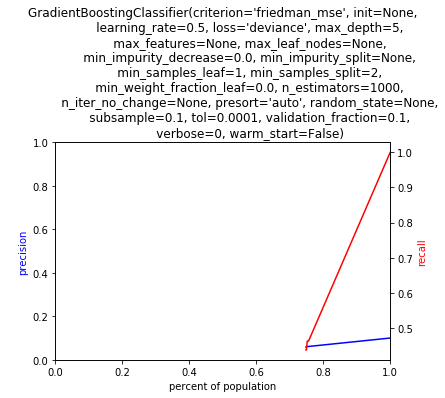

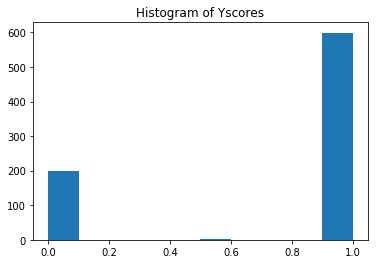

FEATURE IMPORTANCES

1. Feature total_primary_type_WEAPONS VIOLATION_mean_by_commarea_group_low (0.202863)
2. Feature label_prev_year (0.132982)
3. Feature total_primary_type_BATTERY_mean_by_commarea_group_low (0.074158)
4. Feature total_domestic_1_mean_by_commarea_group_low (0.074130)
5. Feature total_crime_class_Less serious offences_mean_by_commarea_group_low (0.043974)
6. Feature total_primary_type_PUBLIC PEACE VIOLATION_mean_by_commarea_group_medium (0.029565)
7. Feature total_primary_type_ASSAULT_mean_by_commarea_group_low (0.023000)
8. Feature eviction_filings_rate_mean_by_commarea_group_low (0.020733)
9. Feature total_crime_class_Violent Crime_mean_by_commarea_group_low (0.019282)
10. Feature total_primary_type_MOTOR VEHICLE THEFT_mean_by_commarea_group_low (0.018302)
            score  label_value
race                          
Asian           0          0.0
Black          35         74.0
Integrated      8          0.0
Latin           2          4.0
White          34          

<Figure size 432x288 with 0 Axes>

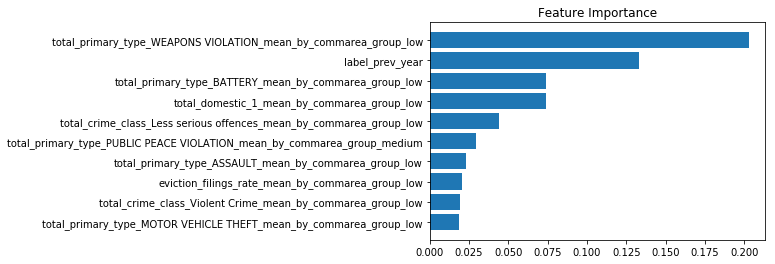

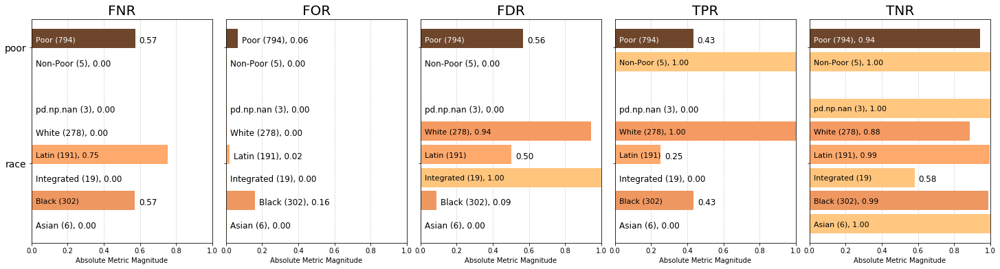

<Figure size 432x288 with 0 Axes>

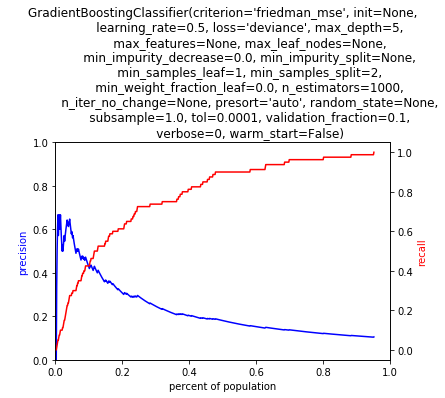

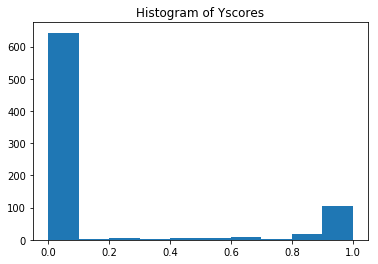

FEATURE IMPORTANCES

1. Feature label_prev_year (0.240215)
2. Feature population_race_black_group_high (0.040455)
3. Feature perc_total_crime_class_Property Crime_group_high (0.035208)
4. Feature eviction_order_no_group_low (0.015387)
5. Feature population_race_black_mean_by_commarea_group_high (0.011908)
6. Feature perc_increase_total_crime_class_Violent Crime_group_high (0.010449)
7. Feature total_department_bureau_SPECIAL TASK FORCE_mean_by_commarea_group_medium (0.009781)
8. Feature some_college_group_medium (0.008859)
9. Feature perc_increase_total_crime_group_low (0.008594)
10. Feature perc_total_crime_class_Property Crime_group_low (0.008307)
            score  label_value
race                          
Asian           0          0.0
Black          74         74.0
Integrated      0          0.0
Latin           3          4.0
White           2          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

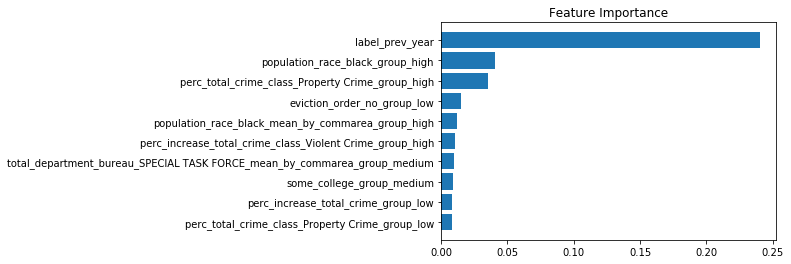

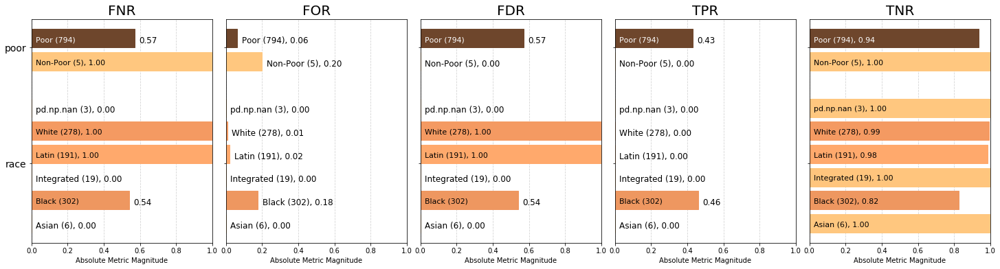

<Figure size 432x288 with 0 Axes>

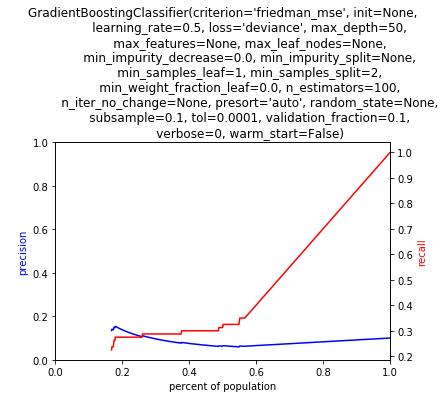

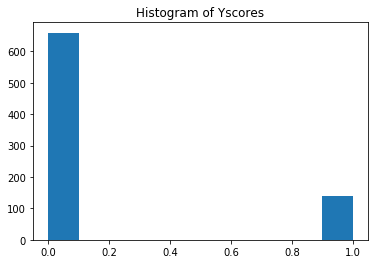

FEATURE IMPORTANCES

1. Feature label_prev_year (0.028192)
2. Feature population_race_other_group_high (0.013872)
3. Feature total_primary_type_HUMAN TRAFFICKING_mean_by_commarea (0.012799)
4. Feature some_college_group_high (0.010767)
5. Feature total_primary_type_NON - CRIMINAL_mean_by_commarea (0.009300)
6. Feature perc_increase_bv_mean_by_commarea_group_medium (0.008835)
7. Feature perc_total_crime_class_Less serious offences_group_high (0.008620)
8. Feature high_school_grad_group_medium (0.007607)
9. Feature associate_mean_by_commarea_group_high (0.007056)
10. Feature perc_total_crime_class_Property Crime_group_low (0.006774)
            score  label_value
race                          
Asian           0          0.0
Black          31         74.0
Integrated      3          0.0
Latin           3          4.0
White          42          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

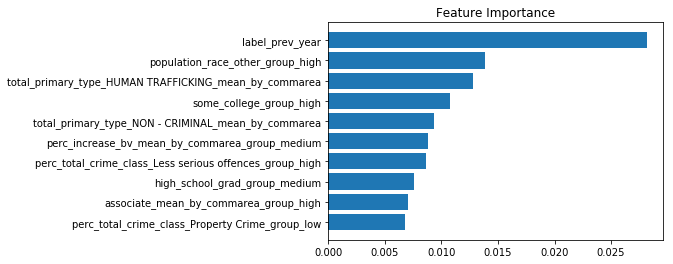

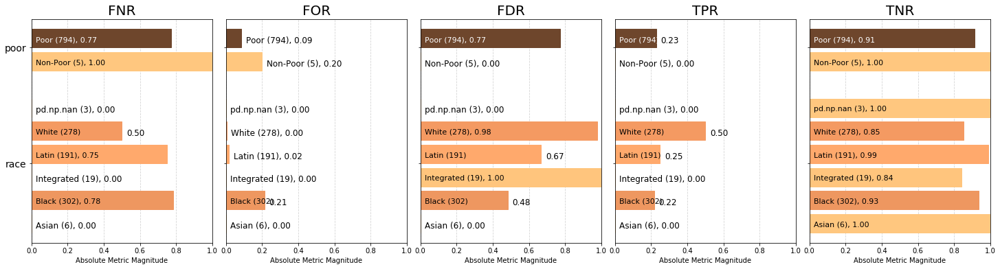

<Figure size 432x288 with 0 Axes>

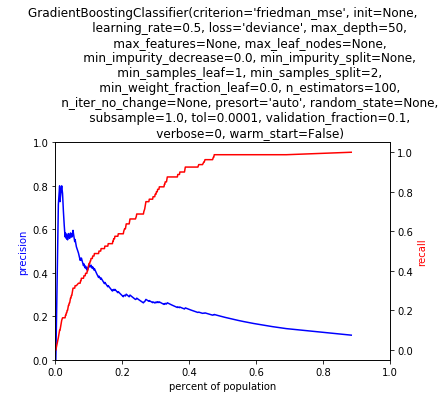

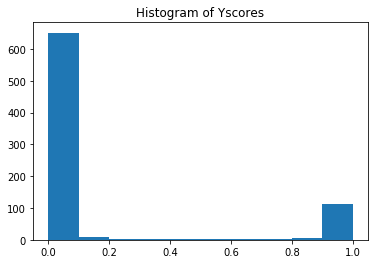

FEATURE IMPORTANCES

1. Feature label_prev_year (0.239555)
2. Feature population_race_black_group_high (0.043321)
3. Feature eviction_order_no_group_low (0.016467)
4. Feature some_college_group_high (0.012801)
5. Feature perc_increase_total_crime_mean_by_commarea_group_low (0.012533)
6. Feature perc_total_crime_class_Less serious offences_group_high (0.012116)
7. Feature perc_total_crime_class_Violent Crime_group_low (0.011938)
8. Feature perc_increase_total_crime_group_medium (0.011467)
9. Feature not_highschool_grad_group_medium (0.010942)
10. Feature total_department_bureau_SPECIAL TASK FORCE_mean_by_commarea_group_medium (0.010696)
            score  label_value
race                          
Asian           0          0.0
Black          73         74.0
Integrated      0          0.0
Latin           2          4.0
White           3          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

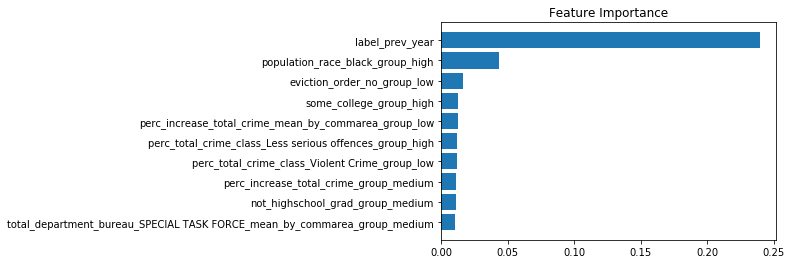

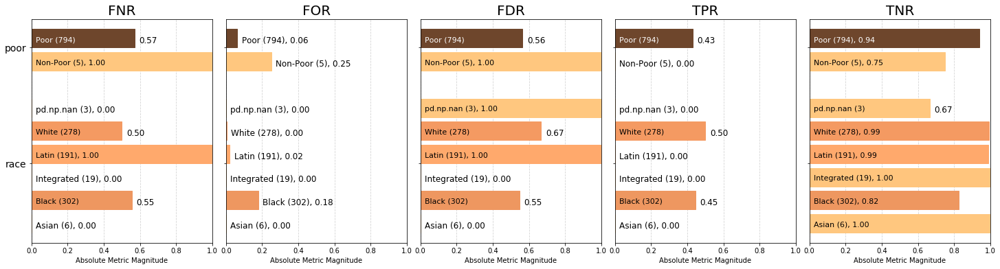

<Figure size 432x288 with 0 Axes>

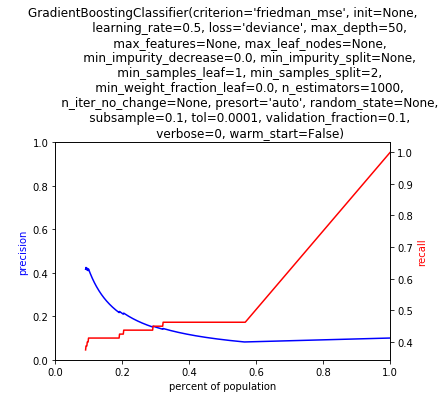

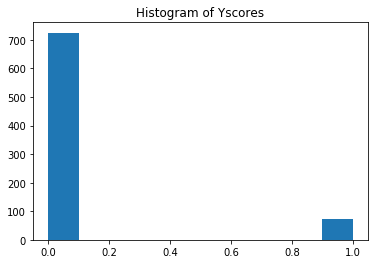

FEATURE IMPORTANCES

1. Feature label_prev_year (0.030022)
2. Feature total_department_bureau_SPECIAL TASK FORCE_mean_by_commarea_group_high (0.023190)
3. Feature total_department_bureau_SIGNS_group_low (0.011287)
4. Feature perc_increase_total_crime_class_Violent Crime_group_high (0.011091)
5. Feature total_primary_type_HUMAN TRAFFICKING_mean_by_commarea (0.010516)
6. Feature some_college_group_high (0.009028)
7. Feature population_race_latinx_mean_by_commarea_group_medium (0.008707)
8. Feature perc_increase_total_crime_class_Violent Crime_group_medium (0.007166)
9. Feature associate_group_low (0.007081)
10. Feature high_school_grad_group_high (0.006821)
            score  label_value
race                          
Asian           0          0.0
Black          68         74.0
Integrated      0          0.0
Latin           2          4.0
White           8          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

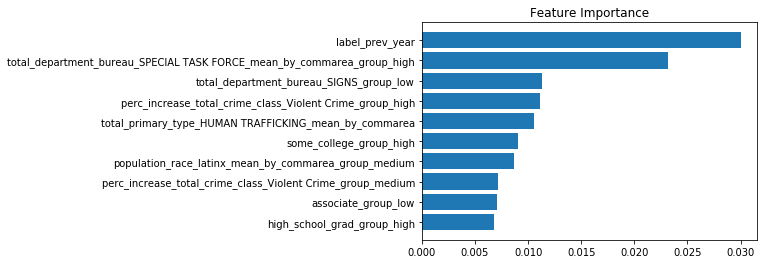

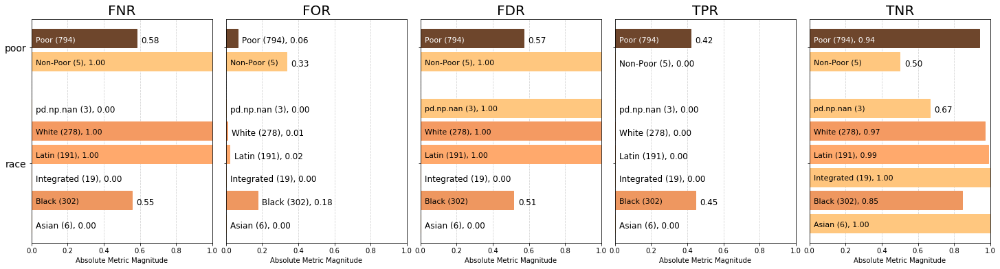

<Figure size 432x288 with 0 Axes>

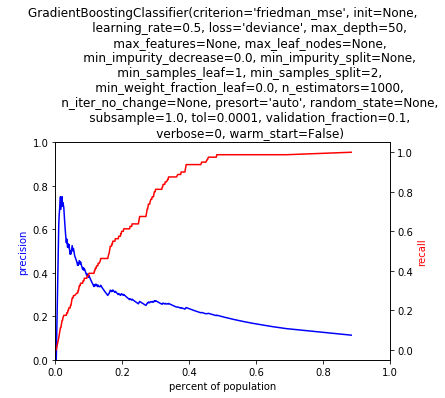

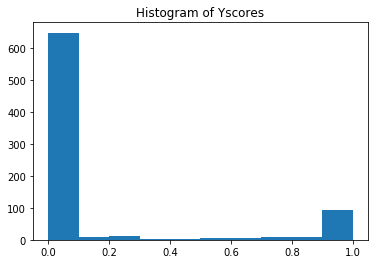

FEATURE IMPORTANCES

1. Feature label_prev_year (0.239555)
2. Feature population_race_black_group_high (0.043321)
3. Feature eviction_order_no_group_low (0.016467)
4. Feature high_school_grad_group_medium (0.013045)
5. Feature some_college_group_high (0.012614)
6. Feature perc_total_crime_class_Violent Crime_group_low (0.012424)
7. Feature perc_total_crime_class_Less serious offences_group_high (0.012128)
8. Feature perc_increase_total_crime_mean_by_commarea_group_medium (0.012008)
9. Feature perc_total_crime_class_Violent Crime_group_medium (0.011768)
10. Feature total_primary_type_CRIMINAL DAMAGE_group_low (0.011027)
            score  label_value
race                          
Asian           0          0.0
Black          73         74.0
Integrated      0          0.0
Latin           2          4.0
White           3          2.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

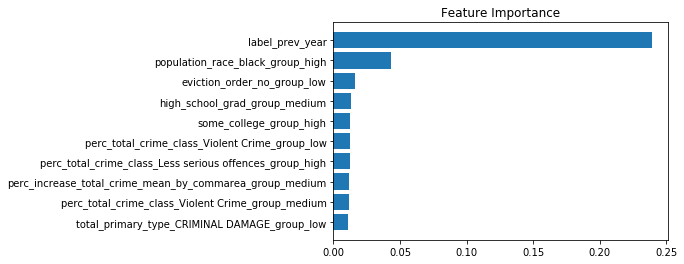

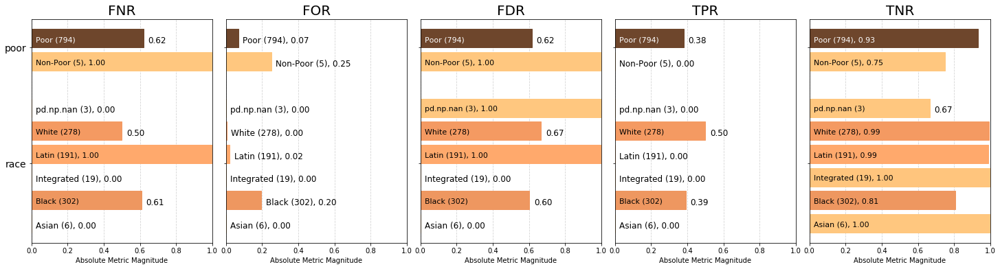

GB


<Figure size 432x288 with 0 Axes>

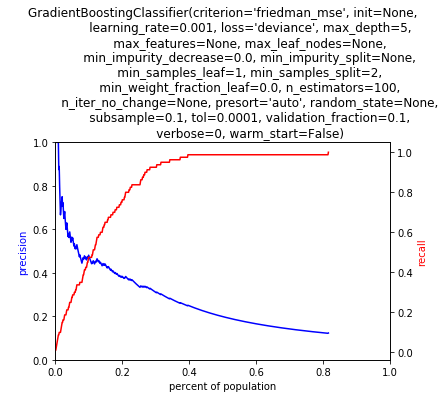

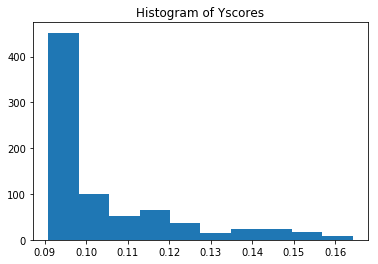

FEATURE IMPORTANCES

1. Feature label_prev_year (0.338377)
2. Feature population_race_black_mean_by_commarea_group_high (0.019644)
3. Feature population_race_black_group_high (0.018667)
4. Feature total_primary_type_CONCEALED CARRY LICENSE VIOLATION_mean_by_commarea (0.012302)
5. Feature eviction_filings_rate_group_low (0.006929)
6. Feature total_primary_type_HUMAN TRAFFICKING_mean_by_commarea (0.006886)
7. Feature some_college_group_medium (0.006406)
8. Feature eviction_filings_rate_mean_by_commarea_group_medium (0.005856)
9. Feature total_domestic_1_mean_by_commarea_group_high (0.005672)
10. Feature total_primary_type_BATTERY_mean_by_commarea_group_medium (0.005504)
            score  label_value
race                          
Asian           0          0.0
Black          73         75.0
Integrated      0          0.0
Latin           4          4.0
White           2          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

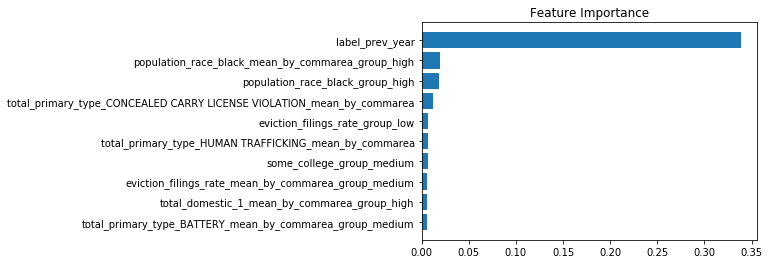

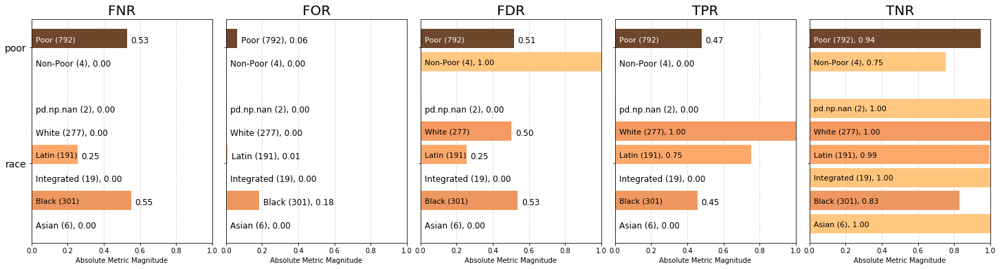

<Figure size 432x288 with 0 Axes>

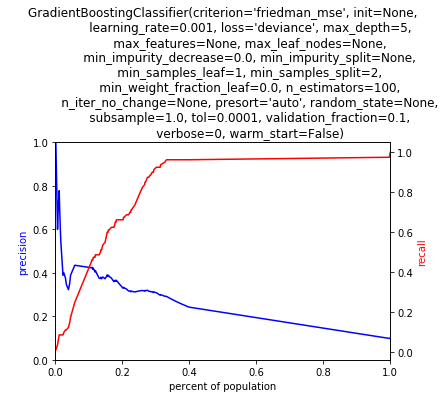

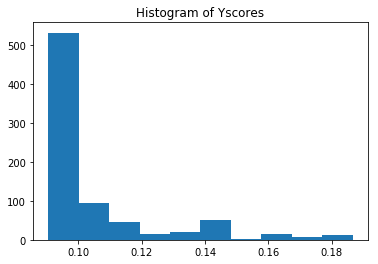

FEATURE IMPORTANCES

1. Feature label_prev_year (0.638080)
2. Feature population_race_black_group_high (0.101763)
3. Feature population_race_black_mean_by_commarea_group_high (0.028039)
4. Feature default_eviction_order_no_group_low (0.024159)
5. Feature landlord_represented_group_low (0.016482)
6. Feature eviction_filings_rate_group_low (0.014261)
7. Feature total_primary_type_BATTERY_group_low (0.011068)
8. Feature total_primary_type_INTERFERENCE WITH PUBLIC OFFICER_mean_by_commarea_group_low (0.009640)
9. Feature total_primary_type_GAMBLING_mean_by_commarea_group_high (0.009141)
10. Feature perc_total_crime_class_Property Crime_group_low (0.007495)
            score  label_value
race                          
Asian           0          0.0
Black          68         75.0
Integrated      0          0.0
Latin           8          4.0
White           3          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

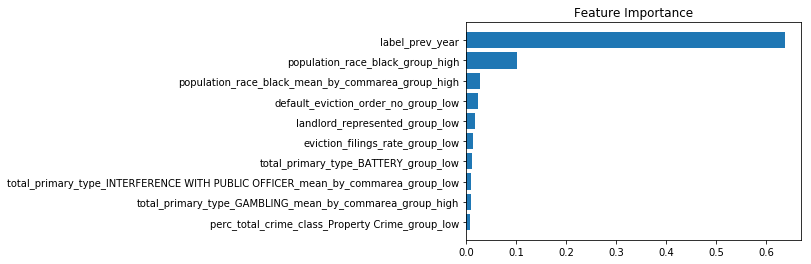

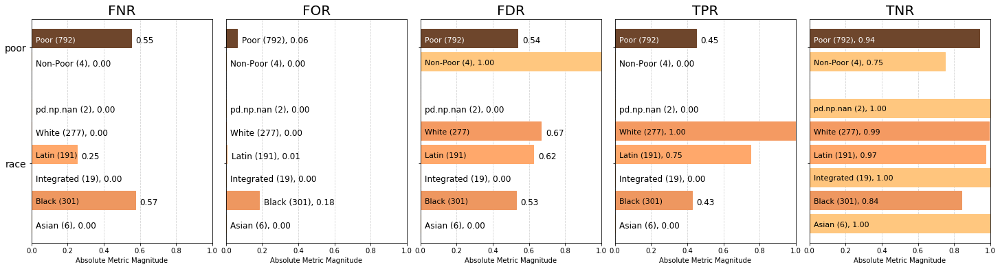

<Figure size 432x288 with 0 Axes>

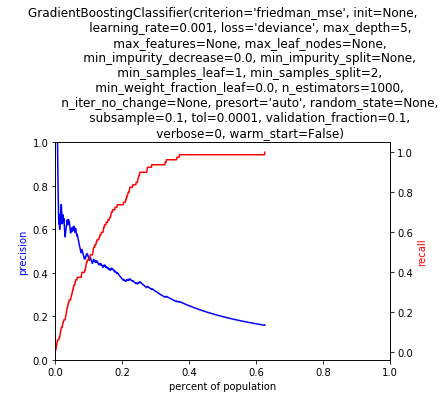

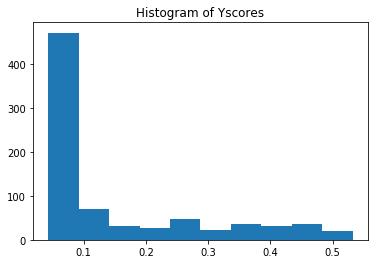

FEATURE IMPORTANCES

1. Feature label_prev_year (0.223923)
2. Feature population_race_black_group_high (0.019589)
3. Feature population_race_black_mean_by_commarea_group_high (0.013872)
4. Feature eviction_filings_rate_group_low (0.012972)
5. Feature total_primary_type_CONCEALED CARRY LICENSE VIOLATION_mean_by_commarea (0.008285)
6. Feature high_school_grad_group_high (0.007747)
7. Feature total_primary_type_HUMAN TRAFFICKING_mean_by_commarea (0.006285)
8. Feature some_college_group_high (0.006142)
9. Feature total_primary_type_INTERFERENCE WITH PUBLIC OFFICER_mean_by_commarea_group_medium (0.005659)
10. Feature total_department_bureau_SPECIAL TASK FORCE_mean_by_commarea_group_medium (0.005607)
            score  label_value
race                          
Asian           0          0.0
Black          76         75.0
Integrated      0          0.0
Latin           2          4.0
White           1          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

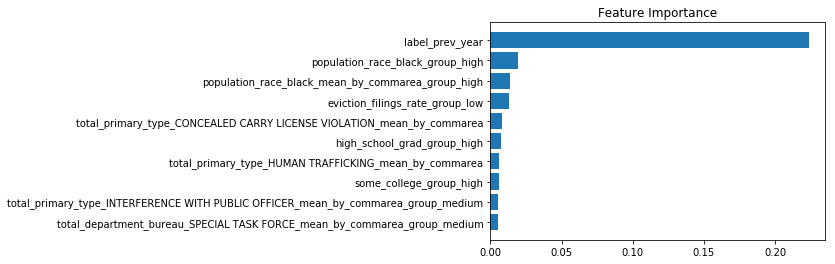

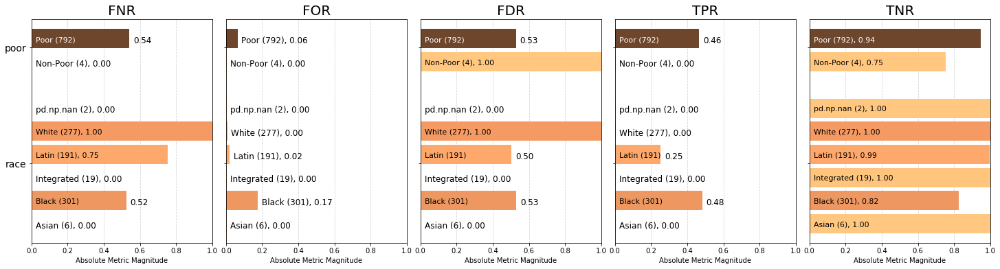

<Figure size 432x288 with 0 Axes>

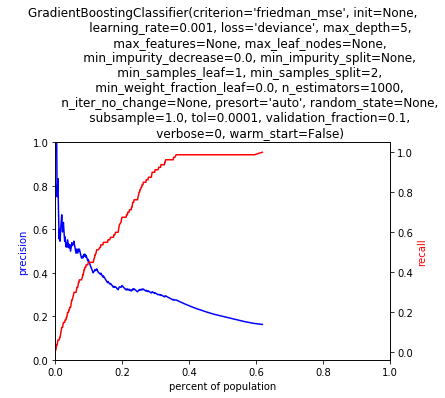

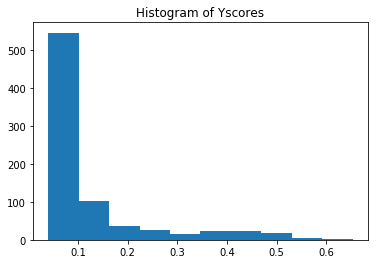

FEATURE IMPORTANCES

1. Feature label_prev_year (0.593660)
2. Feature population_race_black_group_high (0.051497)
3. Feature population_race_black_mean_by_commarea_group_high (0.047859)
4. Feature eviction_filings_rate_mean_by_commarea_group_medium (0.019150)
5. Feature landlord_represented_group_low (0.018622)
6. Feature eviction_filings_rate_group_low (0.010319)
7. Feature total_domestic_1_group_high (0.009032)
8. Feature perc_total_crime_class_Property Crime_mean_by_commarea_group_low (0.007896)
9. Feature total_primary_type_INTERFERENCE WITH PUBLIC OFFICER_mean_by_commarea_group_low (0.007277)
10. Feature eviction_order_no_group_low (0.006012)
            score  label_value
race                          
Asian           0          0.0
Black          71         75.0
Integrated      0          0.0
Latin           5          4.0
White           3          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

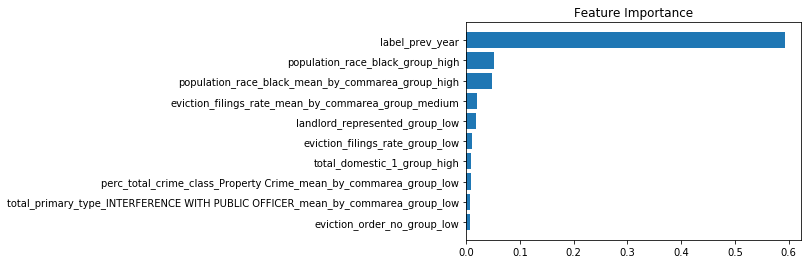

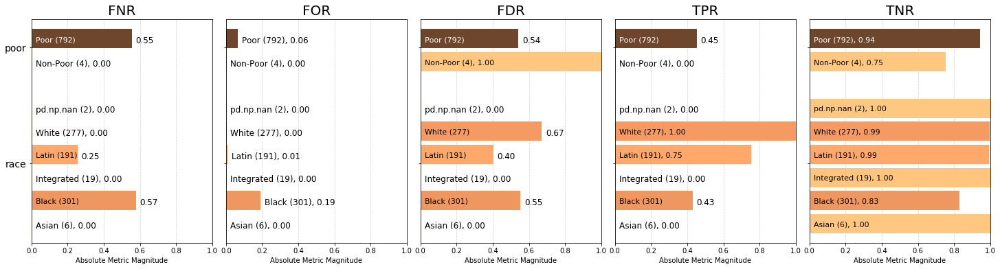

<Figure size 432x288 with 0 Axes>

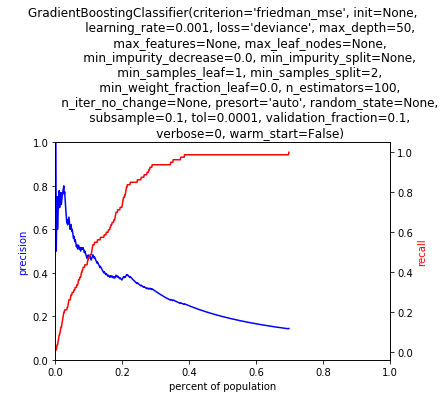

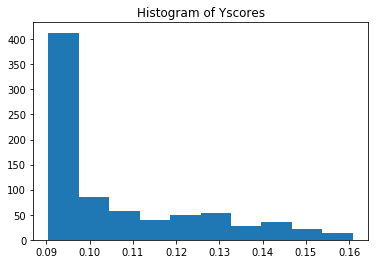

FEATURE IMPORTANCES

1. Feature label_prev_year (0.223593)
2. Feature population_race_black_group_high (0.021404)
3. Feature total_primary_type_CONCEALED CARRY LICENSE VIOLATION_mean_by_commarea (0.009752)
4. Feature population_race_black_mean_by_commarea_group_high (0.009645)
5. Feature total_primary_type_HUMAN TRAFFICKING_mean_by_commarea (0.009103)
6. Feature some_college_group_high (0.008652)
7. Feature high_school_grad_group_high (0.008193)
8. Feature total_primary_type_BATTERY_group_low (0.006487)
9. Feature some_college_group_medium (0.006189)
10. Feature perc_total_crime_class_Property Crime_group_medium (0.005897)
            score  label_value
race                          
Asian           0          0.0
Black          75         75.0
Integrated      0          0.0
Latin           4          4.0
White           0          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

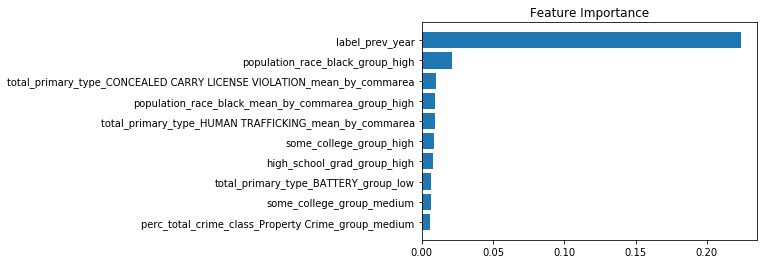

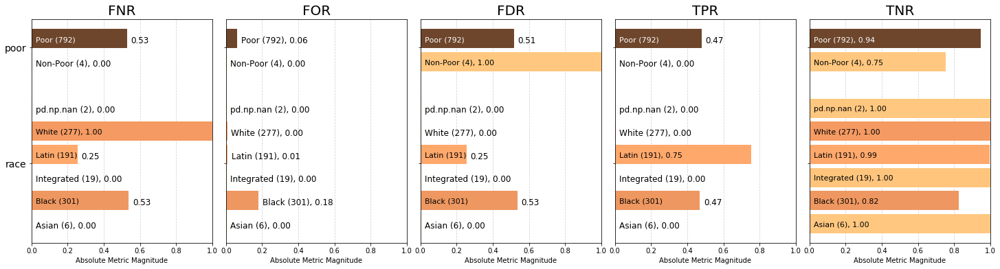

<Figure size 432x288 with 0 Axes>

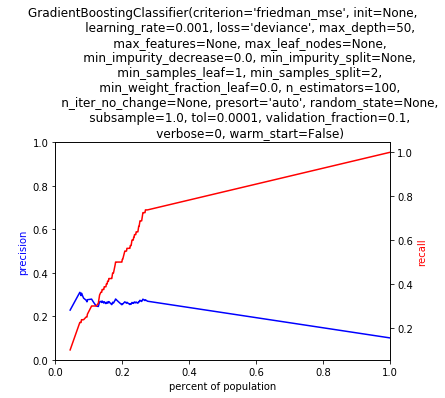

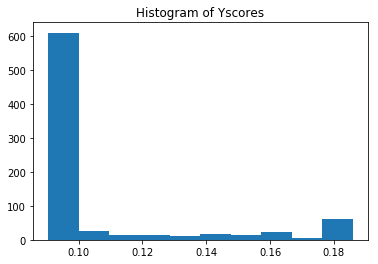

FEATURE IMPORTANCES

1. Feature label_prev_year (0.241834)
2. Feature population_race_black_group_high (0.048656)
3. Feature default_eviction_order_no_group_low (0.015410)
4. Feature some_college_group_medium (0.014150)
5. Feature high_school_grad_group_medium (0.013517)
6. Feature some_college_group_high (0.011807)
7. Feature high_school_grad_group_high (0.010401)
8. Feature perc_total_crime_class_Property Crime_group_medium (0.010258)
9. Feature total_inspection_category_COMPLAINT_perc_group_medium (0.009000)
10. Feature total_violation_status_OPEN_perc_group_medium (0.008898)
            score  label_value
race                          
Asian           0          0.0
Black          60         75.0
Integrated      0          0.0
Latin          13          4.0
White           5          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

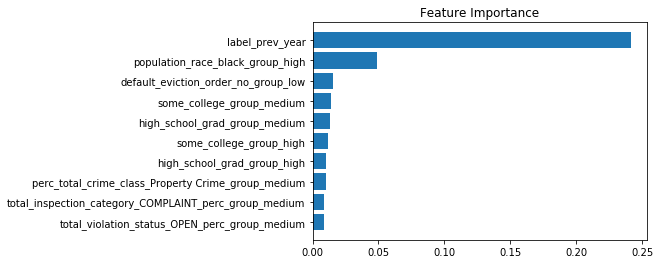

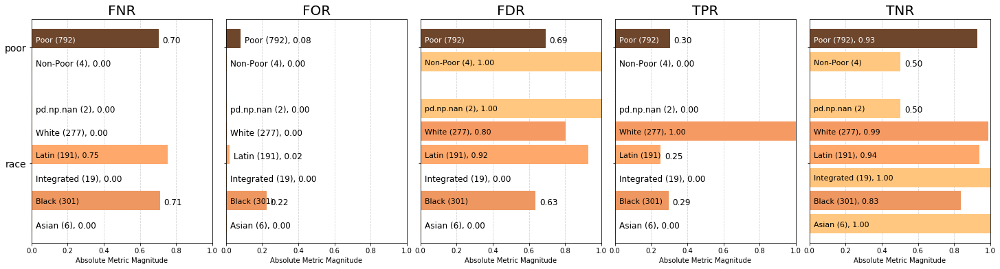

<Figure size 432x288 with 0 Axes>

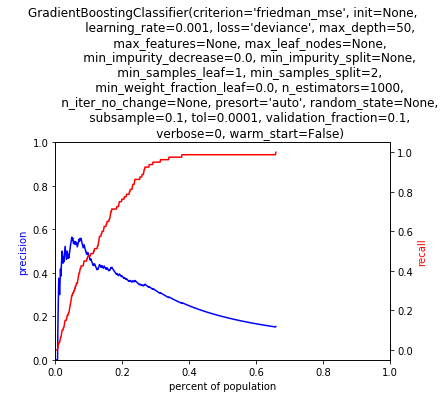

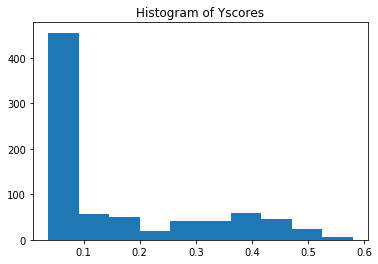

FEATURE IMPORTANCES

1. Feature label_prev_year (0.138918)
2. Feature population_race_black_group_high (0.012209)
3. Feature high_school_grad_group_high (0.009392)
4. Feature some_college_group_high (0.008710)
5. Feature some_college_group_medium (0.008463)
6. Feature population_race_black_mean_by_commarea_group_high (0.008025)
7. Feature total_primary_type_CONCEALED CARRY LICENSE VIOLATION_mean_by_commarea (0.007457)
8. Feature perc_total_crime_class_Property Crime_group_low (0.007436)
9. Feature eviction_filings_rate_group_low (0.007273)
10. Feature total_primary_type_HUMAN TRAFFICKING_mean_by_commarea (0.007194)
            score  label_value
race                          
Asian           0          0.0
Black          77         75.0
Integrated      0          0.0
Latin           2          4.0
White           0          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

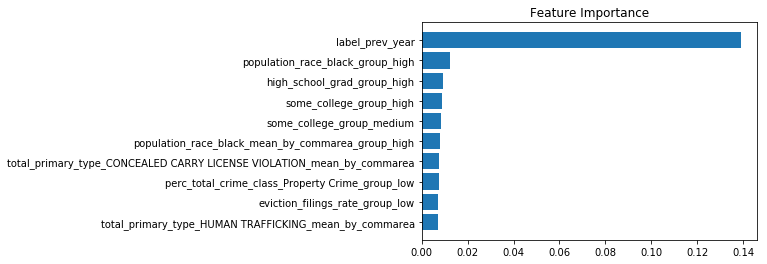

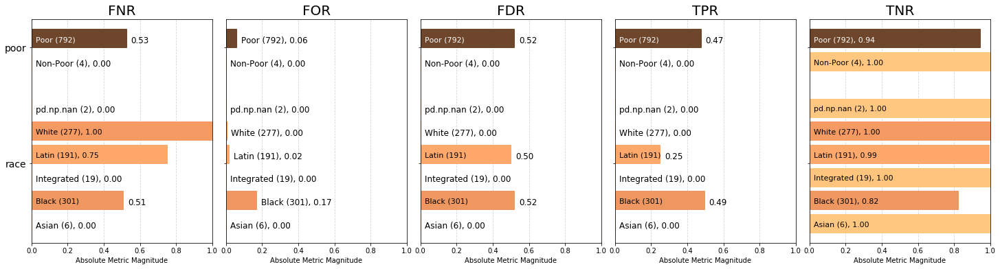

<Figure size 432x288 with 0 Axes>

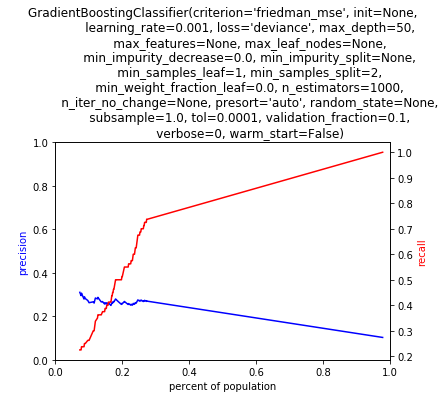

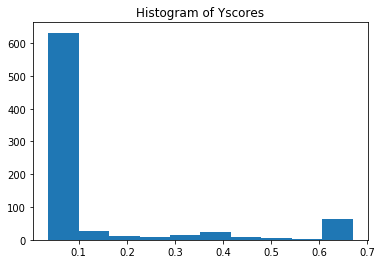

FEATURE IMPORTANCES

1. Feature label_prev_year (0.241834)
2. Feature population_race_black_group_high (0.048670)
3. Feature default_eviction_order_no_group_low (0.015412)
4. Feature some_college_group_medium (0.014135)
5. Feature high_school_grad_group_medium (0.013366)
6. Feature some_college_group_high (0.011949)
7. Feature perc_total_crime_class_Property Crime_group_medium (0.010268)
8. Feature high_school_grad_group_high (0.010122)
9. Feature total_violation_status_OPEN_perc_group_medium (0.008877)
10. Feature total_inspection_category_COMPLAINT_perc_group_medium (0.008876)
            score  label_value
race                          
Asian           0          0.0
Black          60         75.0
Integrated      0          0.0
Latin          13          4.0
White           5          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

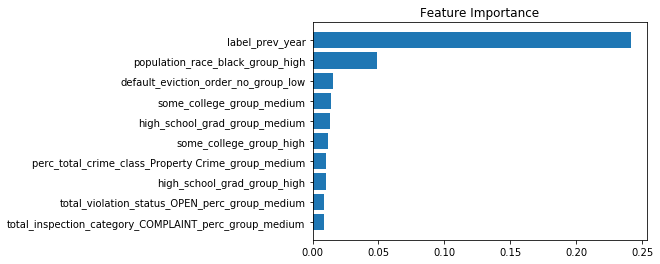

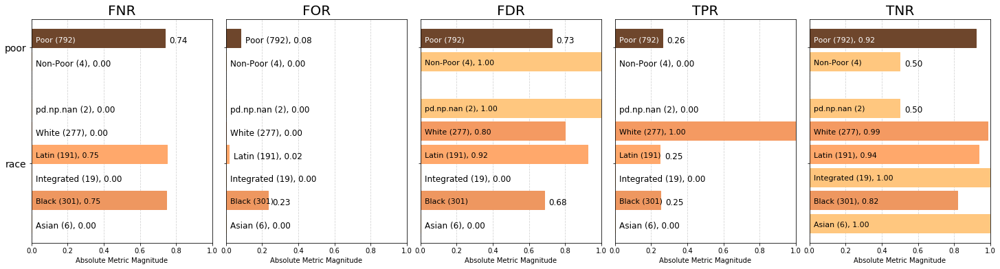

<Figure size 432x288 with 0 Axes>

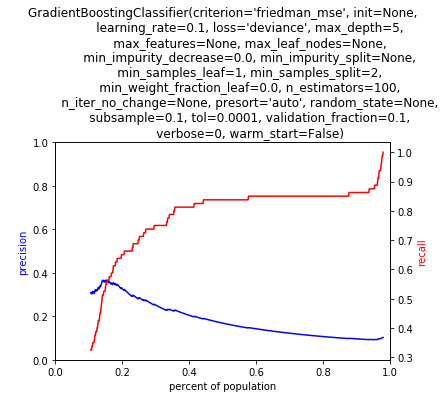

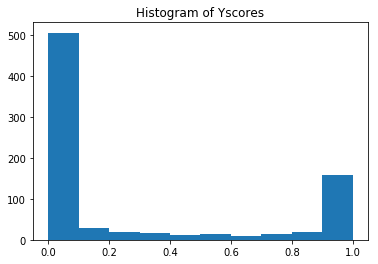

FEATURE IMPORTANCES

1. Feature total_department_bureau_PLUMBING_group_high (0.060694)
2. Feature label_prev_year (0.060314)
3. Feature total_primary_type_CONCEALED CARRY LICENSE VIOLATION_mean_by_commarea (0.047082)
4. Feature population_race_black_group_high (0.011434)
5. Feature total_primary_type_INTERFERENCE WITH PUBLIC OFFICER_mean_by_commarea_group_low (0.011347)
6. Feature eviction_filings_rate_group_low (0.011183)
7. Feature total_primary_type_HUMAN TRAFFICKING_mean_by_commarea (0.010897)
8. Feature total_inspection_category_COMPLAINT_group_high (0.010548)
9. Feature total_primary_type_GAMBLING_mean_by_commarea_group_high (0.009826)
10. Feature eviction_filings_rate_group_medium (0.008992)
            score  label_value
race                          
Asian           0          0.0
Black          66         75.0
Integrated      0          0.0
Latin           4          4.0
White           8          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

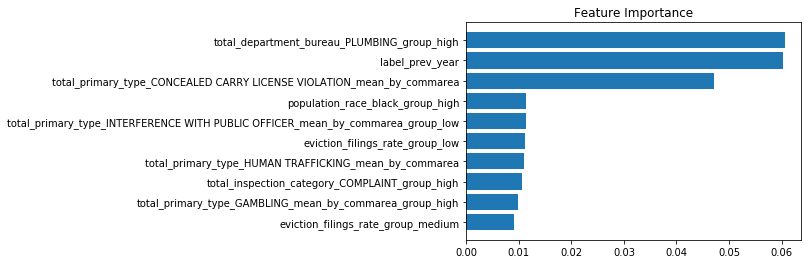

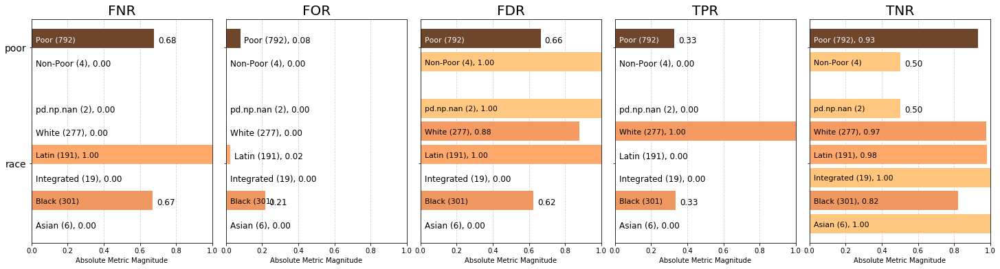

<Figure size 432x288 with 0 Axes>

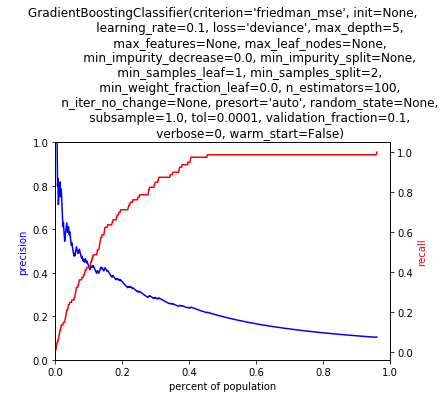

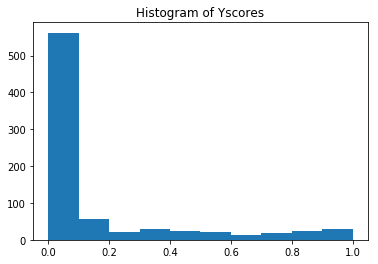

FEATURE IMPORTANCES

1. Feature label_prev_year (0.370350)
2. Feature population_race_black_group_high (0.037914)
3. Feature population_race_black_mean_by_commarea_group_high (0.028231)
4. Feature eviction_filings_rate_mean_by_commarea_group_medium (0.014189)
5. Feature eviction_filings_rate_group_low (0.009280)
6. Feature perc_increase_total_crime_class_Violent Crime_group_medium (0.008930)
7. Feature total_primary_type_CONCEALED CARRY LICENSE VIOLATION_mean_by_commarea (0.008245)
8. Feature eviction_order_no_group_low (0.007779)
9. Feature not_highschool_grad_group_medium (0.006630)
10. Feature high_school_grad_group_high (0.006619)
            score  label_value
race                          
Asian           0          0.0
Black          71         75.0
Integrated      0          0.0
Latin           6          4.0
White           2          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

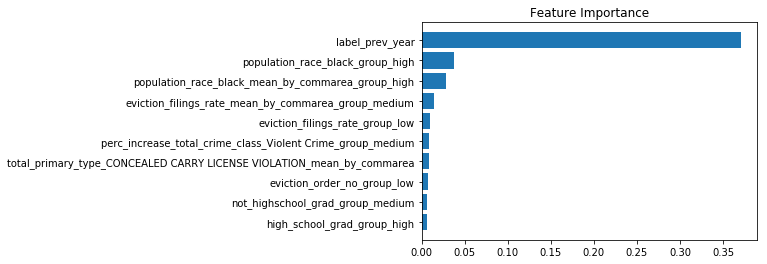

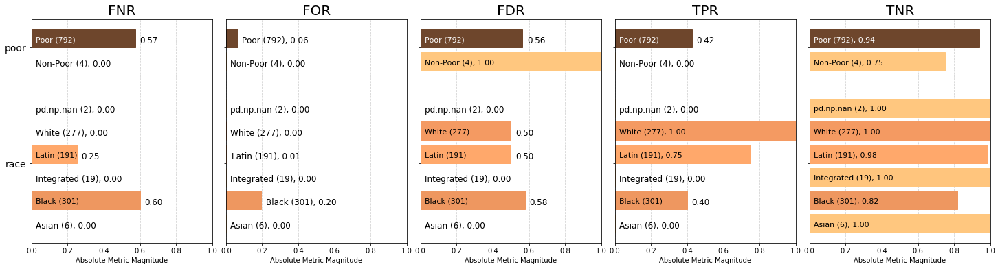

<Figure size 432x288 with 0 Axes>

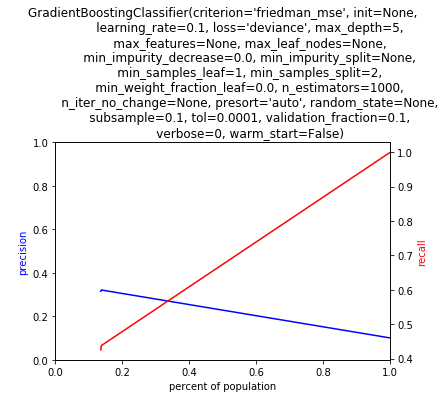

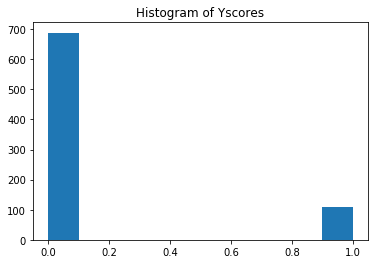

FEATURE IMPORTANCES

1. Feature label_prev_year (0.030849)
2. Feature commarea_group_medium (0.023264)
3. Feature population_race_black_mean_by_commarea_group_high (0.014228)
4. Feature total_primary_type_NARCOTICS_mean_by_commarea_group_high (0.013241)
5. Feature some_college_mean_by_commarea_group_medium (0.012067)
6. Feature total_primary_type_CONCEALED CARRY LICENSE VIOLATION_mean_by_commarea (0.010201)
7. Feature total_department_bureau_DEMOLITION_mean_by_commarea_group_high (0.009812)
8. Feature total_primary_type_WEAPONS VIOLATION_mean_by_commarea_group_high (0.008847)
9. Feature total_primary_type_INTERFERENCE WITH PUBLIC OFFICER_mean_by_commarea_group_low (0.008686)
10. Feature ftu_other_outcome_group_low (0.008221)
            score  label_value
race                          
Asian           0          0.0
Black          67         75.0
Integrated      1          0.0
Latin           3          4.0
White           8          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

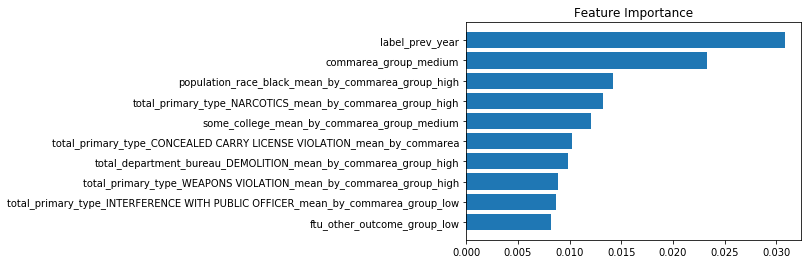

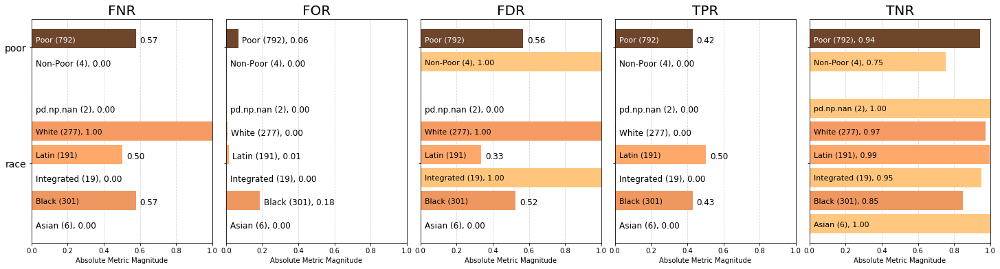

<Figure size 432x288 with 0 Axes>

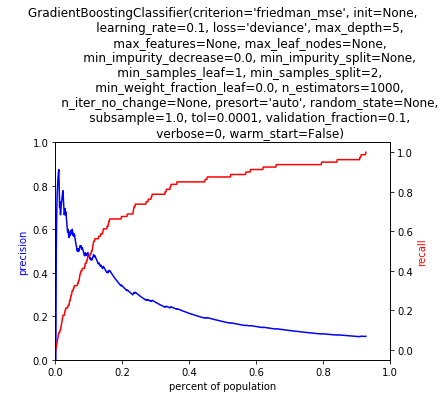

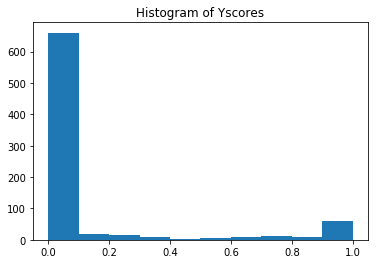

FEATURE IMPORTANCES

1. Feature label_prev_year (0.287607)
2. Feature population_race_black_group_high (0.029086)
3. Feature population_race_black_mean_by_commarea_group_high (0.022606)
4. Feature eviction_filings_rate_mean_by_commarea_group_medium (0.011407)
5. Feature high_school_grad_group_high (0.009035)
6. Feature perc_increase_total_crime_class_Violent Crime_group_medium (0.008432)
7. Feature some_college_group_high (0.008361)
8. Feature perc_total_crime_class_Property Crime_group_low (0.007884)
9. Feature total_primary_type_HUMAN TRAFFICKING_mean_by_commarea (0.007730)
10. Feature total_primary_type_CONCEALED CARRY LICENSE VIOLATION_mean_by_commarea (0.007367)
            score  label_value
race                          
Asian           0          0.0
Black          71         75.0
Integrated      0          0.0
Latin           6          4.0
White           2          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

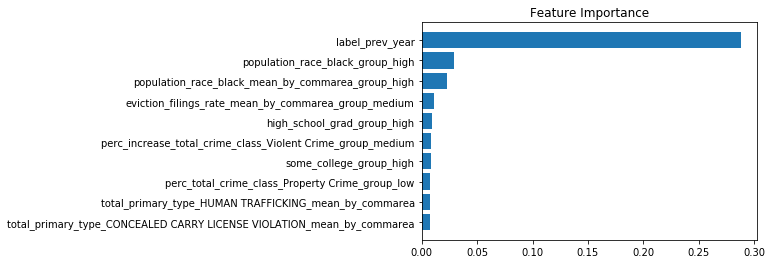

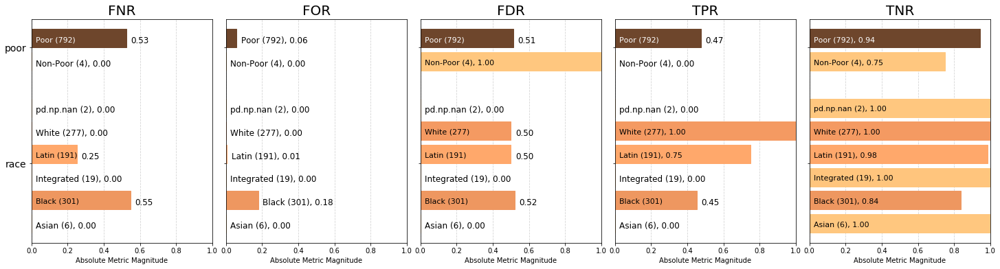

<Figure size 432x288 with 0 Axes>

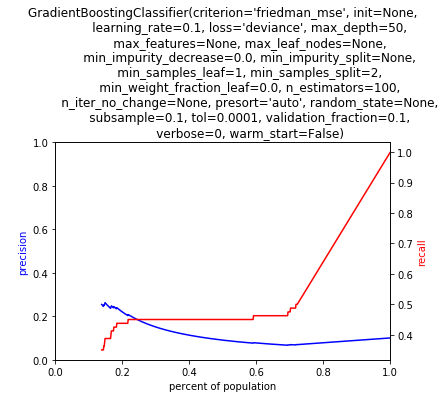

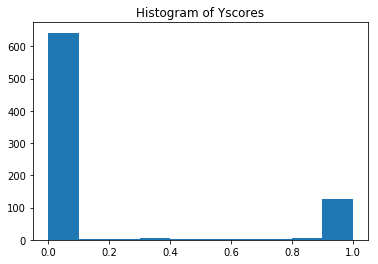

FEATURE IMPORTANCES

1. Feature label_prev_year (0.030573)
2. Feature perc_increase_total_crime_group_high (0.027323)
3. Feature total_primary_type_STALKING_mean_by_commarea_group_medium (0.010845)
4. Feature total_primary_type_CONCEALED CARRY LICENSE VIOLATION_mean_by_commarea (0.010235)
5. Feature some_college_group_high (0.010185)
6. Feature high_school_grad_group_high (0.009108)
7. Feature total_department_bureau_ELECTRICAL_group_medium (0.008895)
8. Feature total_primary_type_WEAPONS VIOLATION_mean_by_commarea_group_high (0.007781)
9. Feature total_department_bureau_DEMOLITION_group_medium (0.007614)
10. Feature some_college_group_medium (0.007086)
            score  label_value
race                          
Asian           0          0.0
Black          58         75.0
Integrated      0          0.0
Latin          11          4.0
White          10          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

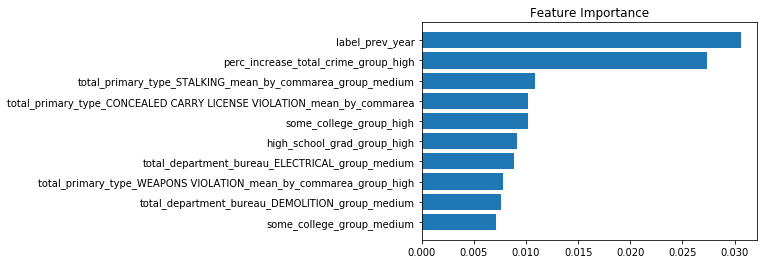

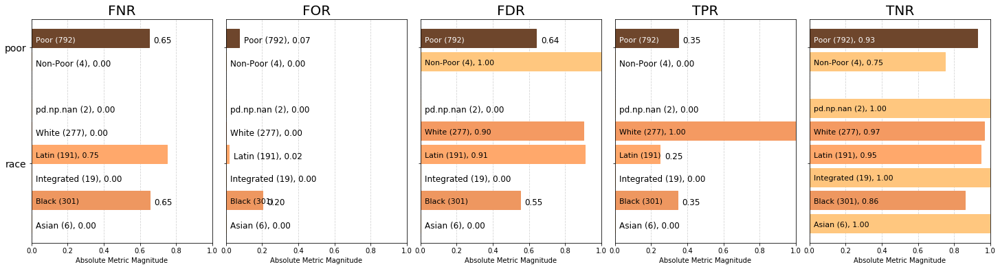

<Figure size 432x288 with 0 Axes>

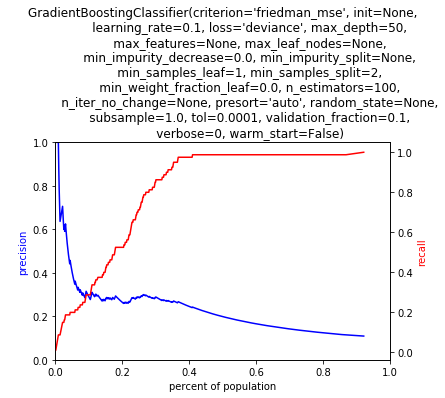

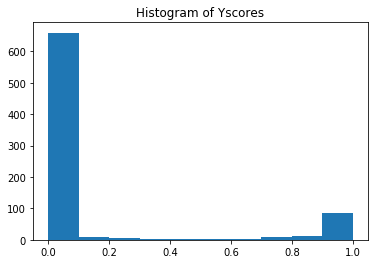

FEATURE IMPORTANCES

1. Feature label_prev_year (0.241804)
2. Feature population_race_black_group_high (0.048620)
3. Feature default_eviction_order_no_group_low (0.015405)
4. Feature some_college_group_medium (0.014882)
5. Feature high_school_grad_group_medium (0.012419)
6. Feature some_college_group_high (0.011132)
7. Feature perc_total_crime_class_Property Crime_group_low (0.010081)
8. Feature total_violation_status_OPEN_perc_group_medium (0.009417)
9. Feature high_school_grad_group_high (0.009316)
10. Feature perc_total_crime_class_Property Crime_mean_by_commarea_group_low (0.009216)
            score  label_value
race                          
Asian           0          0.0
Black          63         75.0
Integrated      0          0.0
Latin          12          4.0
White           3          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

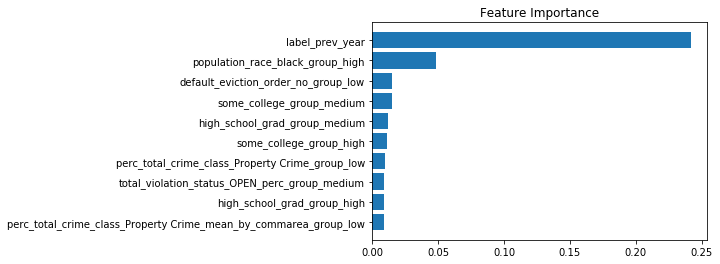

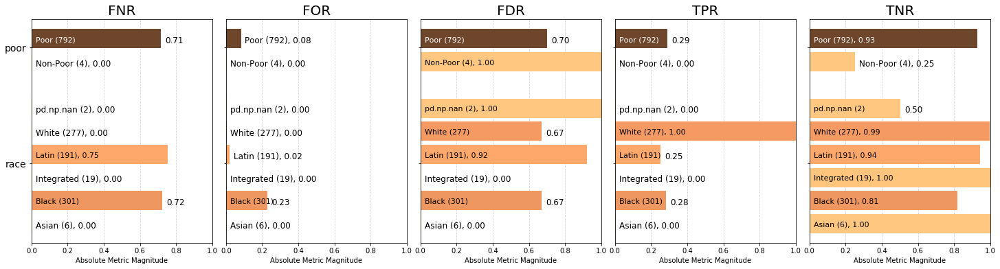

<Figure size 432x288 with 0 Axes>

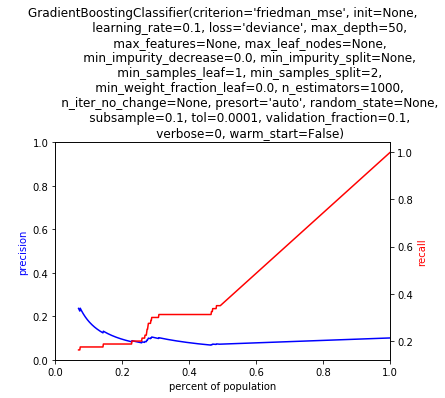

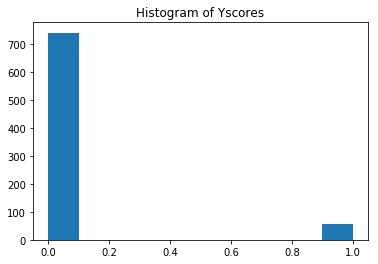

FEATURE IMPORTANCES

1. Feature label_prev_year (0.048794)
2. Feature some_college_group_high (0.016721)
3. Feature high_school_grad_group_high (0.011464)
4. Feature eviction_filings_rate_group_low (0.010848)
5. Feature total_primary_type_NON - CRIMINAL_mean_by_commarea (0.009236)
6. Feature total_department_bureau_DEMOLITION_mean_by_commarea_group_high (0.008400)
7. Feature total_primary_type_CONCEALED CARRY LICENSE VIOLATION_mean_by_commarea (0.008392)
8. Feature some_college_group_medium (0.007070)
9. Feature eviction_filings_rate_group_medium (0.007051)
10. Feature total_primary_type_HUMAN TRAFFICKING_mean_by_commarea (0.006649)
            score  label_value
race                          
Asian           0          0.0
Black          49         75.0
Integrated      0          0.0
Latin           6          4.0
White          24          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

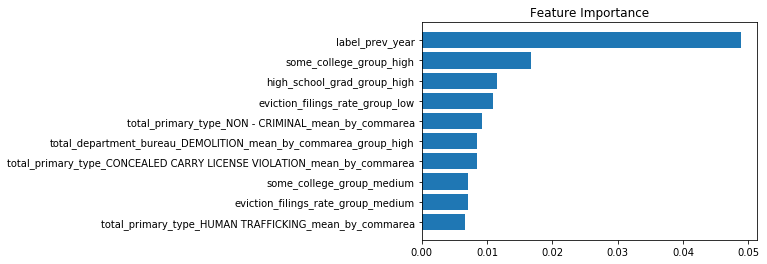

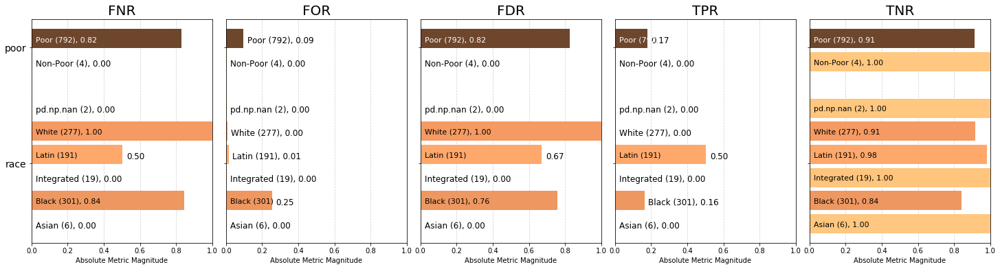

<Figure size 432x288 with 0 Axes>

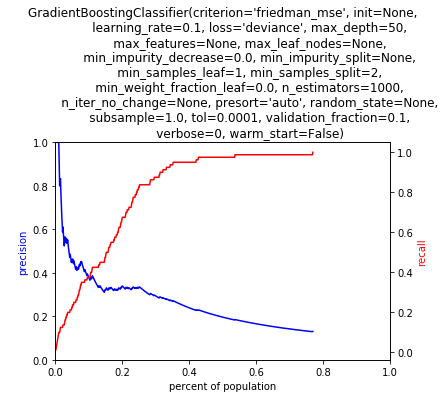

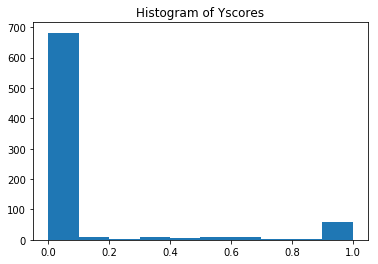

FEATURE IMPORTANCES

1. Feature label_prev_year (0.241804)
2. Feature population_race_black_group_high (0.048619)
3. Feature default_eviction_order_no_group_low (0.015406)
4. Feature some_college_group_medium (0.013357)
5. Feature high_school_grad_group_medium (0.013330)
6. Feature total_violation_status_OPEN_perc_group_medium (0.010406)
7. Feature some_college_group_high (0.010374)
8. Feature high_school_grad_group_high (0.009888)
9. Feature perc_total_crime_class_Property Crime_group_medium (0.009703)
10. Feature perc_total_crime_class_Property Crime_mean_by_commarea_group_low (0.008480)
            score  label_value
race                          
Asian           0          0.0
Black          71         75.0
Integrated      0          0.0
Latin           5          4.0
White           3          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

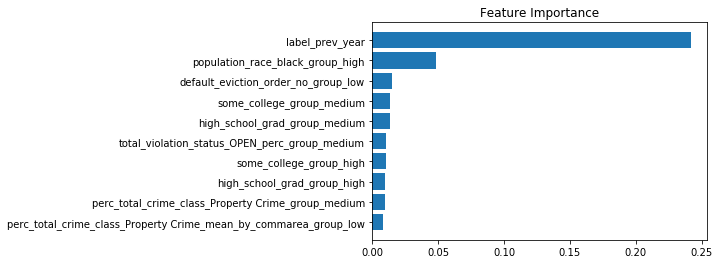

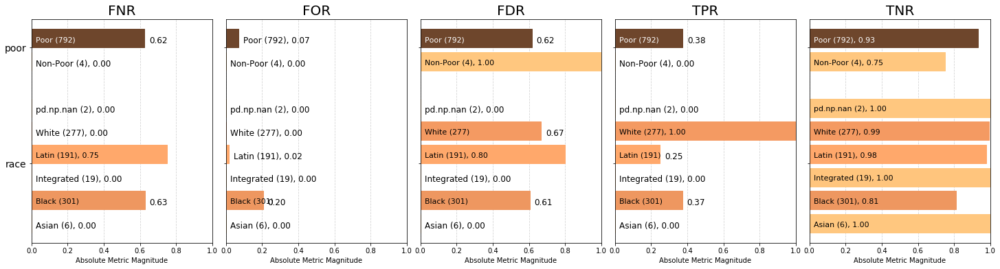

<Figure size 432x288 with 0 Axes>

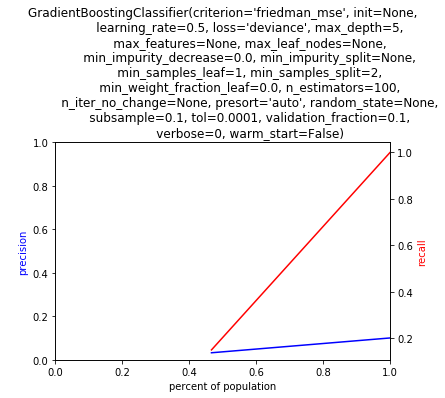

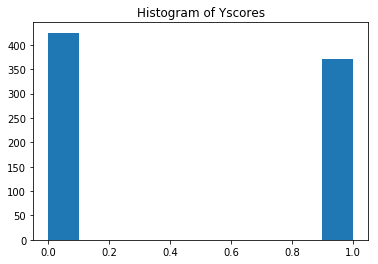

FEATURE IMPORTANCES

1. Feature total_crime_class_Violent Crime_mean_by_commarea_group_low (0.165423)
2. Feature label_prev_year (0.164414)
3. Feature total_crime_class_Less serious offences_mean_by_commarea_group_low (0.065341)
4. Feature population_race_black_mean_by_commarea_group_low (0.045284)
5. Feature population_race_black_group_high (0.039098)
6. Feature population_race_black_group_low (0.027476)
7. Feature eviction_order_no_mean_by_commarea_group_medium (0.019410)
8. Feature total_primary_type_CONCEALED CARRY LICENSE VIOLATION_mean_by_commarea (0.017407)
9. Feature eviction_order_no_mean_by_commarea_group_low (0.017216)
10. Feature total_department_bureau_DEMOLITION_mean_by_commarea_group_medium (0.016755)
            score  label_value
race                          
Asian           0          0.0
Black          12         75.0
Integrated      0          0.0
Latin           0          4.0
White          67          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

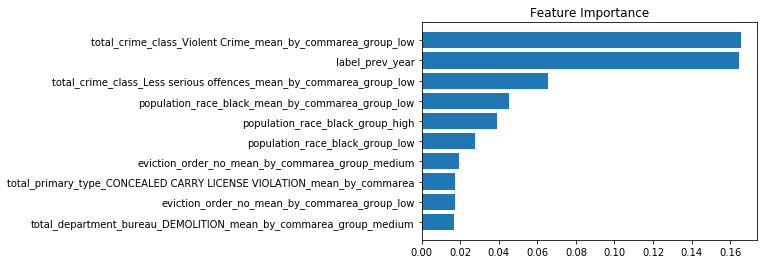

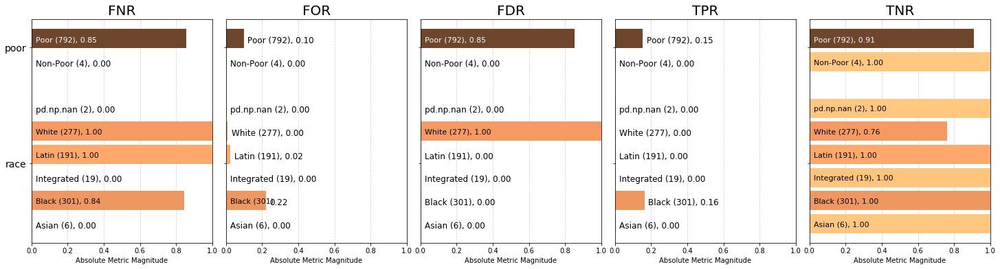

<Figure size 432x288 with 0 Axes>

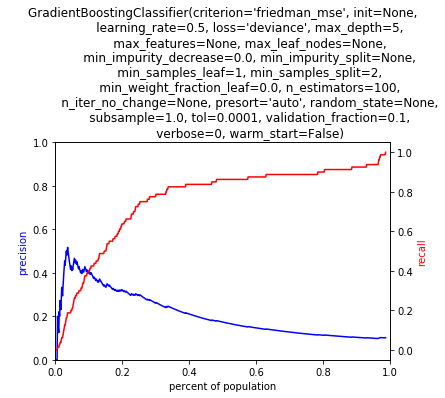

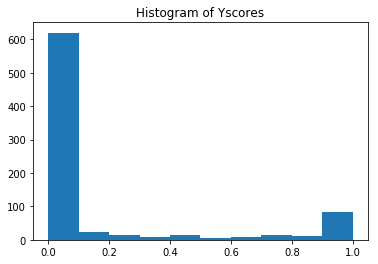

FEATURE IMPORTANCES

1. Feature label_prev_year (0.242096)
2. Feature population_race_black_group_high (0.051110)
3. Feature perc_total_crime_class_Property Crime_group_high (0.031572)
4. Feature default_eviction_order_no_group_low (0.014528)
5. Feature population_race_black_mean_by_commarea_group_high (0.011181)
6. Feature high_school_grad_group_high (0.010496)
7. Feature housing_units_rental_group_low (0.009771)
8. Feature perc_increase_total_crime_class_Violent Crime_group_medium (0.008378)
9. Feature total_violation_status_OPEN_perc_group_high (0.008336)
10. Feature perc_increase_total_crime_class_Less serious offences_group_medium (0.007919)
            score  label_value
race                          
Asian           0          0.0
Black          69         75.0
Integrated      0          0.0
Latin           5          4.0
White           5          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

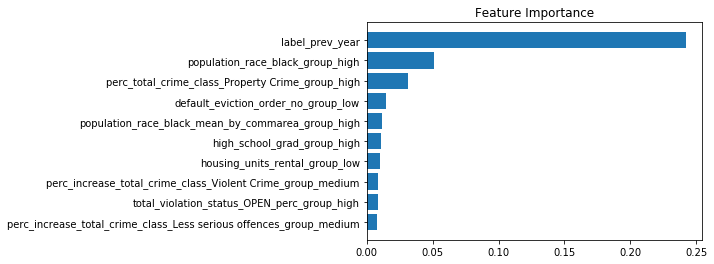

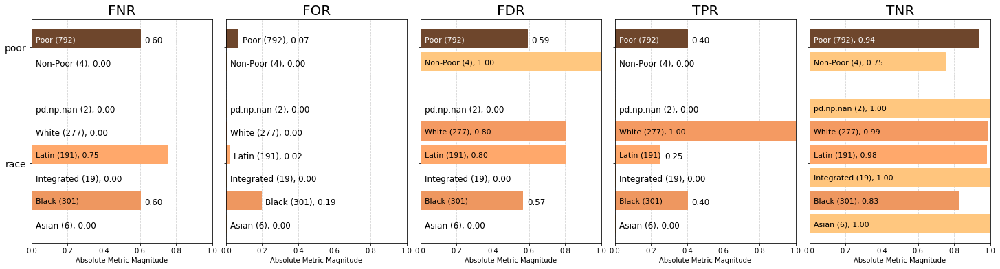

<Figure size 432x288 with 0 Axes>

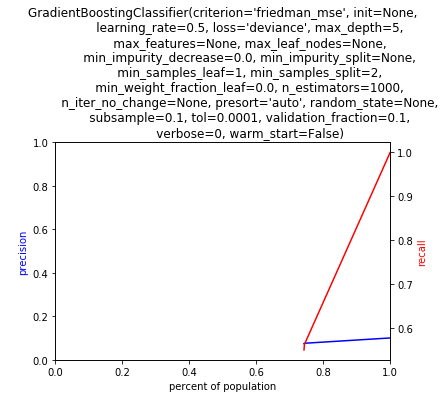

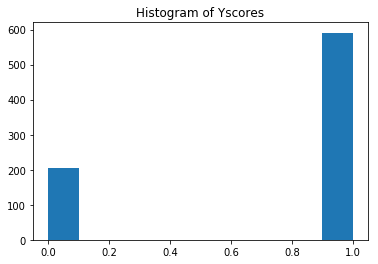

FEATURE IMPORTANCES

1. Feature perc_total_crime_class_Violent Crime_mean_by_commarea_group_high (0.172386)
2. Feature total_primary_type_MOTOR VEHICLE THEFT_mean_by_commarea_group_high (0.114008)
3. Feature label_prev_year (0.103449)
4. Feature total_crime_class_Less serious offences_mean_by_commarea_group_low (0.051506)
5. Feature total_primary_type_BATTERY_mean_by_commarea_group_low (0.034891)
6. Feature perc_total_crime_class_Violent Crime_mean_by_commarea_group_medium (0.021604)
7. Feature associate_group_low (0.021424)
8. Feature population_race_black_group_high (0.020110)
9. Feature eviction_order_no_tenant_rep_pa_mean_by_commarea_group_medium (0.017245)
10. Feature total_primary_type_ROBBERY_mean_by_commarea_group_low (0.016194)
            score  label_value
race                          
Asian           0          0.0
Black          41         75.0
Integrated      6          0.0
Latin           3          4.0
White          29          1.0
model_id, score_thresholds 1 {'rank_

<Figure size 432x288 with 0 Axes>

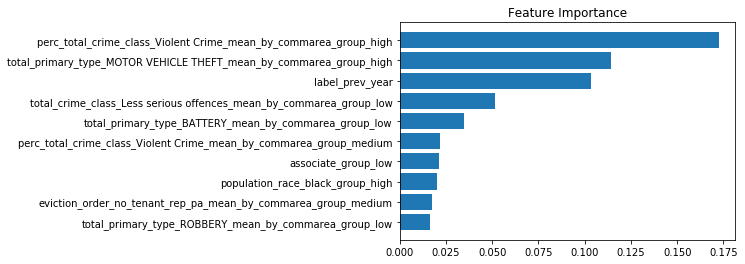

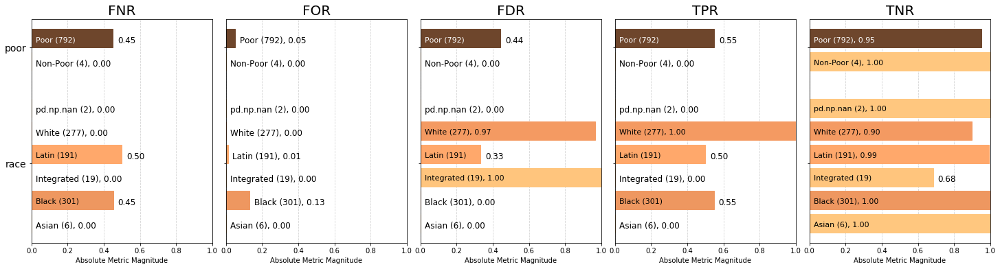

<Figure size 432x288 with 0 Axes>

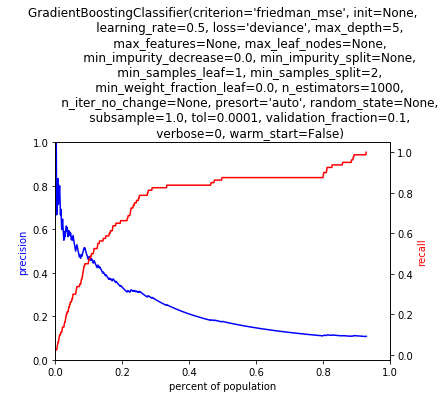

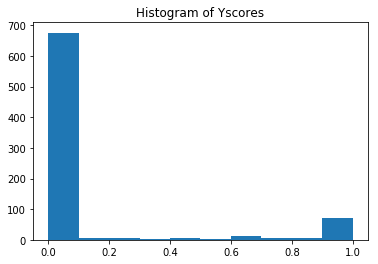

FEATURE IMPORTANCES

1. Feature label_prev_year (0.255529)
2. Feature population_race_black_group_high (0.052121)
3. Feature default_eviction_order_no_group_low (0.014782)
4. Feature some_college_group_medium (0.013899)
5. Feature population_race_black_mean_by_commarea_group_high (0.012512)
6. Feature median_rent_group_low (0.010415)
7. Feature eviction_filings_rate_group_low (0.009164)
8. Feature high_school_grad_group_high (0.008826)
9. Feature perc_total_crime_class_Property Crime_mean_by_commarea_group_low (0.008749)
10. Feature some_college_group_high (0.008104)
            score  label_value
race                          
Asian           0          0.0
Black          74         75.0
Integrated      0          0.0
Latin           3          4.0
White           2          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

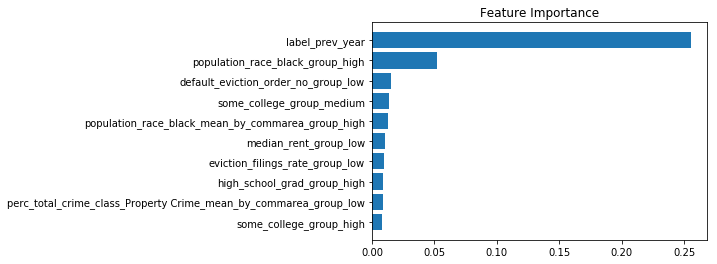

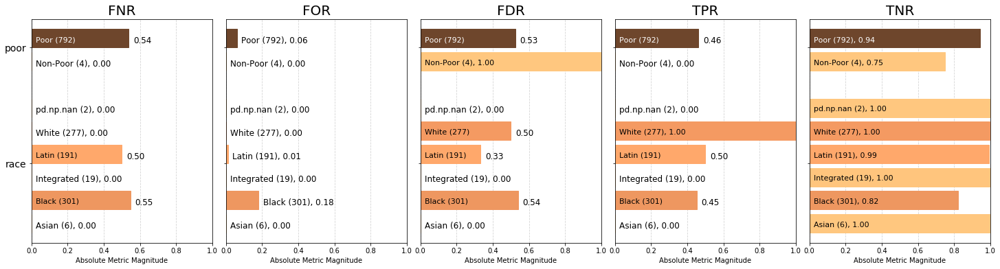

<Figure size 432x288 with 0 Axes>

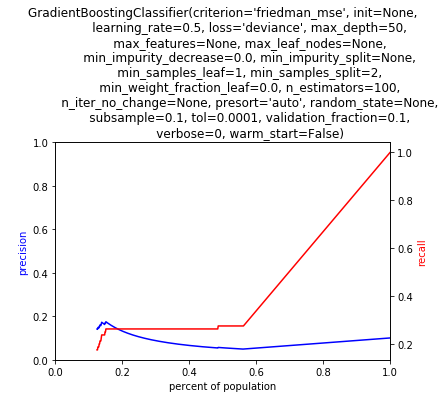

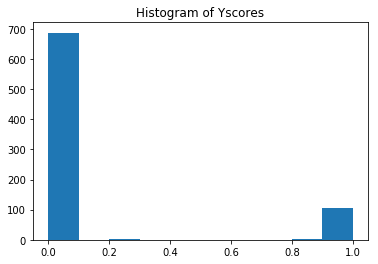

FEATURE IMPORTANCES

1. Feature label_prev_year (0.031225)
2. Feature total_primary_type_HUMAN TRAFFICKING_mean_by_commarea (0.027363)
3. Feature perc_increase_total_crime_class_Less serious offences_group_low (0.011397)
4. Feature eviction_filings_rate_group_low (0.009248)
5. Feature high_school_grad_group_high (0.007737)
6. Feature total_primary_type_CONCEALED CARRY LICENSE VIOLATION_mean_by_commarea (0.007167)
7. Feature not_highschool_grad_group_medium (0.007012)
8. Feature perc_total_crime_class_Property Crime_group_low (0.006995)
9. Feature population_race_white_group_high (0.006979)
10. Feature perc_total_crime_class_Property Crime_group_medium (0.006614)
            score  label_value
race                          
Asian           1          0.0
Black          37         75.0
Integrated      0          0.0
Latin          30          4.0
White          11          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

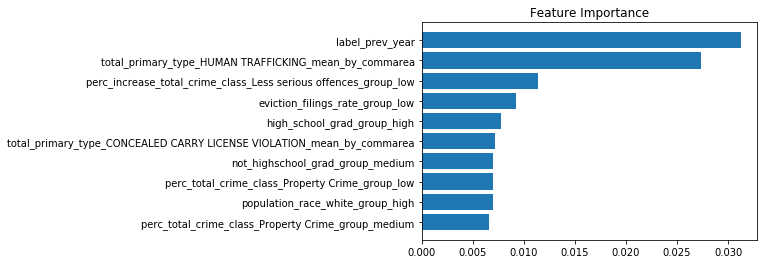

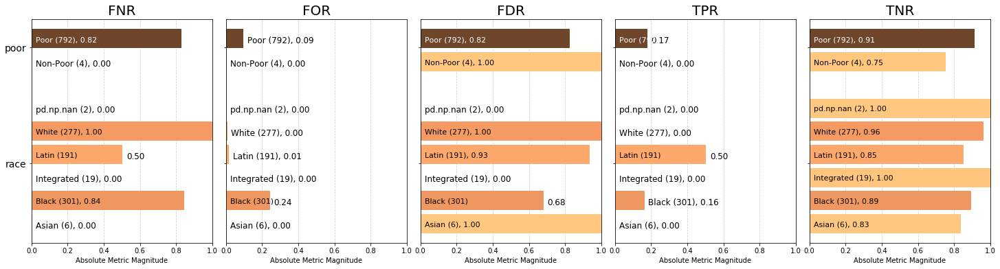

<Figure size 432x288 with 0 Axes>

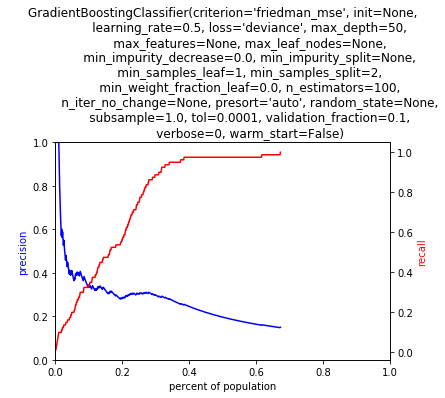

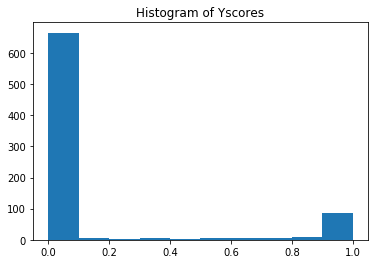

FEATURE IMPORTANCES

1. Feature label_prev_year (0.241835)
2. Feature population_race_black_group_high (0.048599)
3. Feature some_college_group_medium (0.020464)
4. Feature default_eviction_order_no_group_low (0.015406)
5. Feature high_school_grad_group_medium (0.013203)
6. Feature high_school_grad_group_high (0.012897)
7. Feature some_college_group_high (0.011414)
8. Feature perc_total_crime_class_Property Crime_group_low (0.010927)
9. Feature total_violation_status_COMPLIED_perc_group_low (0.010909)
10. Feature perc_increase_total_crime_group_medium (0.010613)
            score  label_value
race                          
Asian           0          0.0
Black          68         75.0
Integrated      0          0.0
Latin           7          4.0
White           4          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

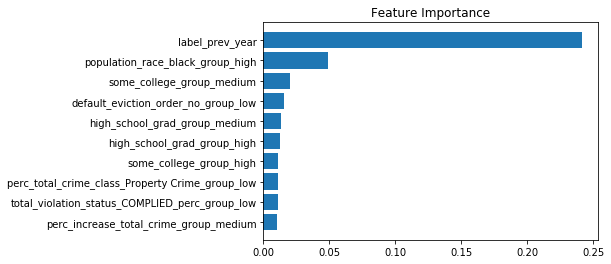

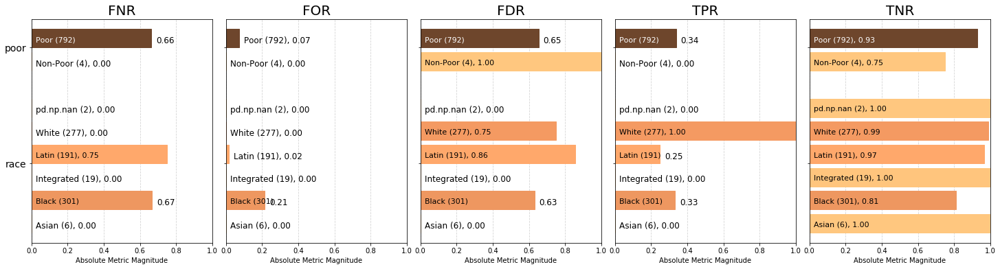

<Figure size 432x288 with 0 Axes>

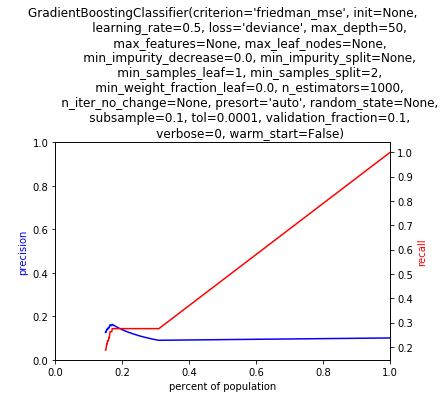

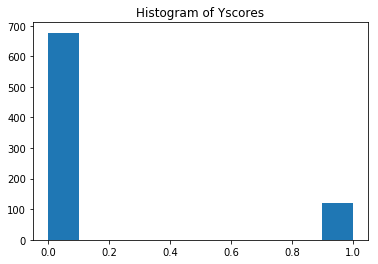

FEATURE IMPORTANCES

1. Feature label_prev_year (0.039934)
2. Feature total_department_bureau_IRON_mean_by_commarea_group_high (0.031291)
3. Feature eviction_filings_rate_group_low (0.017195)
4. Feature total_primary_type_CONCEALED CARRY LICENSE VIOLATION_mean_by_commarea (0.009661)
5. Feature total_primary_type_HUMAN TRAFFICKING_mean_by_commarea (0.009618)
6. Feature population_race_other_group_high (0.009285)
7. Feature high_school_grad_group_high (0.008232)
8. Feature perc_increase_total_crime_class_Violent Crime_group_high (0.007916)
9. Feature some_college_group_high (0.007901)
10. Feature perc_total_crime_class_Less serious offences_group_high (0.007494)
            score  label_value
race                          
Asian           0          0.0
Black          22         75.0
Integrated      6          0.0
Latin           8          4.0
White          43          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

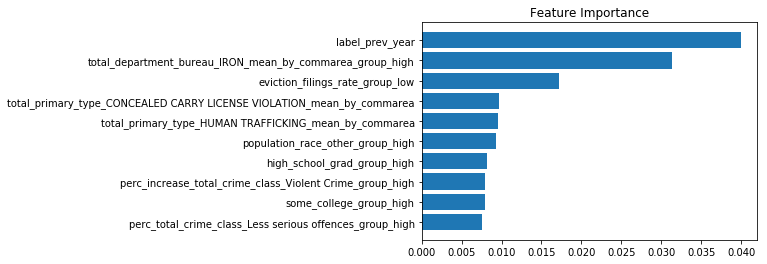

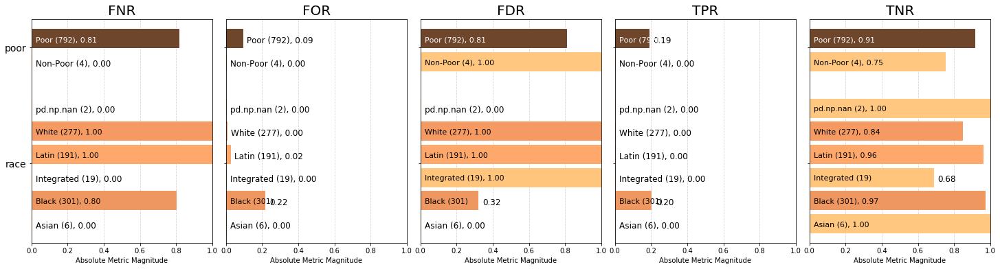

<Figure size 432x288 with 0 Axes>

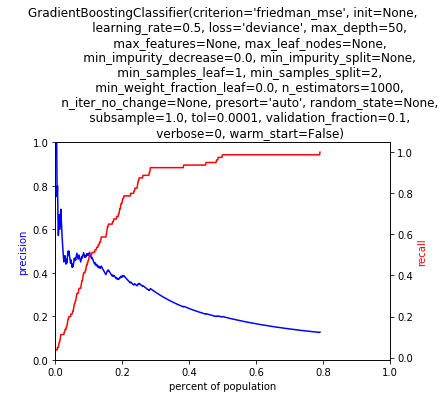

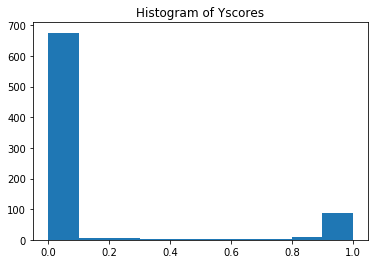

FEATURE IMPORTANCES

1. Feature label_prev_year (0.241835)
2. Feature population_race_black_group_high (0.048599)
3. Feature default_eviction_order_no_group_low (0.015406)
4. Feature some_college_group_medium (0.013864)
5. Feature high_school_grad_group_medium (0.011448)
6. Feature not_highschool_grad_group_low (0.011399)
7. Feature perc_increase_total_crime_group_medium (0.010478)
8. Feature high_school_grad_group_high (0.010231)
9. Feature perc_total_crime_class_Property Crime_mean_by_commarea_group_low (0.010086)
10. Feature housing_units_rental_mean_by_commarea_group_low (0.009928)
            score  label_value
race                          
Asian           0          0.0
Black          71         75.0
Integrated      0          0.0
Latin           5          4.0
White           3          1.0
model_id, score_thresholds 1 {'rank_abs': [79]}


<Figure size 432x288 with 0 Axes>

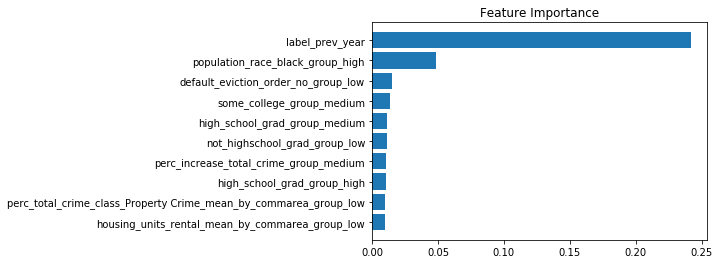

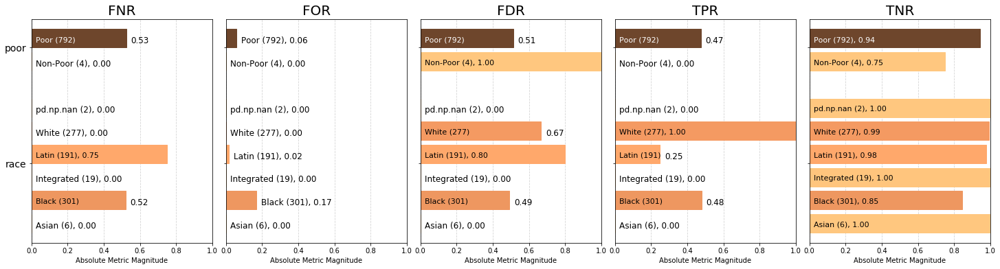

In [12]:
clfs, grid = helper.define_clfs_params(params['grid_size'])
predictors = selected_features
results_df = mlpipeline.clf_loop_cross_validation(params['models_to_run'], clfs, grid, processed_rv, 
                                                  predictors, params['outcome'], params['thresholds'],
                                                  params['date_col'], params['bias_list'])

In [16]:
results_df.to_csv('../results/GB_results.csv')

In [14]:
eviction_df['correct_with_baseline'] = eviction_df['label'] *eviction_df['label_prev_year']

In [15]:
eviction_df.groupby('year')['correct_with_baseline'].sum()/80

year
2010    0.5625
2011    0.5375
2012    0.5750
2013    0.5500
2014    0.4750
2015    0.5500
2016    0.4875
2017    0.0000
Name: correct_with_baseline, dtype: float64